In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    #print("Agg:")
    agg.columns = names
    #print(type(agg))
    #print(agg)

    #print("Test columns:")
    #print(agg.iloc[:, -36]) # Column containing response actual values (temperature) at time t

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    #print("Scaled values rows:")
    #print(len(scaled_values))

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
    #print("Train_X Fold "+str(i)+":")
    #print(len(train_X[i]))
    #print(len(train_X[i][0]))
    #print(len(train_X[i][0][0])) 
    #print("Train_y Fold "+str(i)+":")
    #print(len(train_y[i]))
    #print(len(train_y[i][0]))
    #print(train_y[i][0][0])
    #print("Validation_X Fold "+str(i)+":")
    #print(len(val_X[i]))
    #print(len(val_X[i][0]))
    #print(len(val_X[i][0][0]))
    #print("Validation_y Fold "+str(i)+":")
    #print(len(val_y[i]))
    #print(len(val_y[i][0]))
    #print(val_y[i][0][0])
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]


Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2160)
(11, 1, 1, 2160)
(10, 1, 1, 2160)
(84, 1, 2160)
(11, 1, 2160)
(10, 1, 2160)
(84, 2160)
(11, 2160)
(10, 2160)
[[0.39307412 0.69695044 0.32924264 ... 0.28675577 0.28888214 0.44896719]
 [0.45747266 0.51683609 0.42215989 ... 0.44744836 0.28584447 0.55801944]
 [0.38487242 0.62674714 0.3411641  ... 0.35905225 0.21111786 0.59720535]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.33961118 0.4845079  0.34568651]
 [0.44896719 0.51620076 0.3997195  ... 0.41585662 0.27855407 0.57776428]
 [0.46780073 0.52414231 0.42356241 ... 0.48876063 0.37788578 0.5227825 ]]
Fold 2:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2160)
(11, 1, 1, 2160)
(10, 1, 1, 2160)
(84, 1, 2160)
(11, 1, 2160)
(10, 1, 2160)
(84, 2160)
(11, 2160)
(10, 2160)
[[0.38166311 0.

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 2160)
(11, 2160)


[I 2025-05-23 11:29:12,401] A new study created in memory with name: no-name-1a32cf39-aca5-4c12-81a6-6d5f4e03d6b0
[I 2025-05-23 11:32:54,017] Trial 0 finished with value: 0.06302512064576149 and parameters: {'lr': 0.5132281016536735, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3560479955504232}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.04475961998105049, 0.048318203538656235, 0.08965924382209778, 0.07661998271942139, 0.05576855316758156]
Mean Cross Validation Accuracy:
0.06302512064576149
Standard Deviation of Cross Validation Accuracy:
0.017301887117116974


[I 2025-05-23 11:38:09,735] Trial 1 finished with value: 0.45398677587509156 and parameters: {'lr': 0.039642408195855745, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.236343388867577}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.5651991963386536, 0.3899514973163605, 0.4896966218948364, 0.4802301526069641, 0.3448564112186432]
Mean Cross Validation Accuracy:
0.45398677587509156
Standard Deviation of Cross Validation Accuracy:
0.07790001769005277


[I 2025-05-23 11:43:09,519] Trial 2 finished with value: 0.09570759683847427 and parameters: {'lr': 0.009506338819380674, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.28675222610403694}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.09939202666282654, 0.06812181323766708, 0.10282823443412781, 0.12668265402317047, 0.08151325583457947]
Mean Cross Validation Accuracy:
0.09570759683847427
Standard Deviation of Cross Validation Accuracy:
0.019930817564263754


[I 2025-05-23 11:49:22,572] Trial 3 finished with value: 1.6161803245544433 and parameters: {'lr': 0.0710692547137356, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.42575664777445743}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[1.8729901313781738, 1.4977710247039795, 1.5327129364013672, 1.5904256105422974, 1.587001919746399]
Mean Cross Validation Accuracy:
1.6161803245544433
Standard Deviation of Cross Validation Accuracy:
0.13300641237023472


[I 2025-05-23 11:52:03,996] Trial 4 finished with value: 0.09260677546262741 and parameters: {'lr': 0.6696320632951791, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.38126747707091047}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.05812929570674896, 0.08689232170581818, 0.06921003013849258, 0.18061105906963348, 0.06819117069244385]
Mean Cross Validation Accuracy:
0.09260677546262741
Standard Deviation of Cross Validation Accuracy:
0.04496584253251419


[I 2025-05-23 11:55:01,648] Trial 5 finished with value: 2.700575113296509 and parameters: {'lr': 0.4811806090850388, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35909141408144574}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[4.3260908126831055, 2.7209396362304688, 1.896248698234558, 2.775092601776123, 1.7845038175582886]
Mean Cross Validation Accuracy:
2.700575113296509
Standard Deviation of Cross Validation Accuracy:
0.9093290339231278


[I 2025-05-23 11:57:40,489] Trial 6 finished with value: 0.5544125378131867 and parameters: {'lr': 0.008897230142719379, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19151864115440742}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.6122862696647644, 0.47148415446281433, 0.5197014212608337, 0.5152292251586914, 0.6533616185188293]
Mean Cross Validation Accuracy:
0.5544125378131867
Standard Deviation of Cross Validation Accuracy:
0.0674649535372513


[I 2025-05-23 12:00:51,971] Trial 7 finished with value: 0.08918135613203049 and parameters: {'lr': 0.005476093871932894, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4326408775433128}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.07811199128627777, 0.09078451991081238, 0.09635763615369797, 0.1099814623594284, 0.07067117094993591]
Mean Cross Validation Accuracy:
0.08918135613203049
Standard Deviation of Cross Validation Accuracy:
0.013797618212473044


[I 2025-05-23 12:03:45,273] Trial 8 finished with value: 0.10101725459098816 and parameters: {'lr': 0.10141595792190088, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.4624061522929117}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.10323679447174072, 0.0847168043255806, 0.11398990452289581, 0.10721826553344727, 0.0959245041012764]
Mean Cross Validation Accuracy:
0.10101725459098816
Standard Deviation of Cross Validation Accuracy:
0.01003303868877278


[I 2025-05-23 12:06:57,621] Trial 9 finished with value: 0.22579271495342254 and parameters: {'lr': 0.3407892216287292, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4975563569516519}. Best is trial 0 with value: 0.06302512064576149.


Cross Validation Accuracies:
[0.4134122133255005, 0.16933639347553253, 0.18444789946079254, 0.19142131507396698, 0.1703457534313202]
Mean Cross Validation Accuracy:
0.22579271495342254
Standard Deviation of Cross Validation Accuracy:
0.0941844412246859


[I 2025-05-23 12:09:49,480] Trial 10 finished with value: 0.0600566565990448 and parameters: {'lr': 0.0015872568940320305, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13279685055507454}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.04974089935421944, 0.04923518747091293, 0.06879362463951111, 0.07726718485355377, 0.05524638667702675]
Mean Cross Validation Accuracy:
0.0600566565990448
Standard Deviation of Cross Validation Accuracy:
0.011128293954486742


[I 2025-05-23 12:12:37,165] Trial 11 finished with value: 0.09627485051751136 and parameters: {'lr': 0.001068444213500497, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.11599565759690787}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.05034812539815903, 0.05304345116019249, 0.06945166736841202, 0.07699782401323318, 0.23153318464756012]
Mean Cross Validation Accuracy:
0.09627485051751136
Standard Deviation of Cross Validation Accuracy:
0.06835805998902136


[I 2025-05-23 12:15:20,762] Trial 12 finished with value: 0.060141319036483766 and parameters: {'lr': 0.0015187555356861162, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10239949892353592}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.05007467418909073, 0.04947711154818535, 0.06852631270885468, 0.07730071246623993, 0.05532778427004814]
Mean Cross Validation Accuracy:
0.060141319036483766
Standard Deviation of Cross Validation Accuracy:
0.010981672719104031


[I 2025-05-23 12:18:07,843] Trial 13 finished with value: 0.07173190116882325 and parameters: {'lr': 0.0010175522634135413, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10541393217712179}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.05027441680431366, 0.09499215334653854, 0.06886802613735199, 0.08113355934619904, 0.06339135020971298]
Mean Cross Validation Accuracy:
0.07173190116882325
Standard Deviation of Cross Validation Accuracy:
0.015281496743484908


[I 2025-05-23 12:20:59,290] Trial 14 finished with value: 0.06023461297154427 and parameters: {'lr': 0.002981850547648051, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1748706204040701}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.04992212355136871, 0.049530576914548874, 0.06884872168302536, 0.07755360007286072, 0.055318042635917664]
Mean Cross Validation Accuracy:
0.06023461297154427
Standard Deviation of Cross Validation Accuracy:
0.011128761592599904


[I 2025-05-23 12:24:15,738] Trial 15 finished with value: 0.34062938690185546 and parameters: {'lr': 0.002669483132263602, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1681607064508726}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.3717784583568573, 0.3110881447792053, 0.3546023666858673, 0.3666691780090332, 0.2990087866783142]
Mean Cross Validation Accuracy:
0.34062938690185546
Standard Deviation of Cross Validation Accuracy:
0.029827969714935502


[I 2025-05-23 12:27:20,670] Trial 16 finished with value: 0.06195414662361145 and parameters: {'lr': 0.017560488517499636, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24632676663618686}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.05298566818237305, 0.05503663793206215, 0.06749114394187927, 0.0760183334350586, 0.05823894962668419]
Mean Cross Validation Accuracy:
0.06195414662361145
Standard Deviation of Cross Validation Accuracy:
0.00860869224382408


[I 2025-05-23 12:30:08,741] Trial 17 finished with value: 0.060392946004867554 and parameters: {'lr': 0.002255308190852728, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13206784393684107}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.05042095482349396, 0.04920047149062157, 0.06885505467653275, 0.07784609496593475, 0.055642154067754745]
Mean Cross Validation Accuracy:
0.060392946004867554
Standard Deviation of Cross Validation Accuracy:
0.0111669316262924


[I 2025-05-23 12:33:25,471] Trial 18 finished with value: 0.2289993017911911 and parameters: {'lr': 0.004220620583443192, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21427039598577372}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.20470242202281952, 0.18076060712337494, 0.26461198925971985, 0.225014790892601, 0.2699066996574402]
Mean Cross Validation Accuracy:
0.2289993017911911
Standard Deviation of Cross Validation Accuracy:
0.034277879356089655


[I 2025-05-23 12:37:23,127] Trial 19 finished with value: 0.17641254663467407 and parameters: {'lr': 0.001629287768752492, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14912910319047268}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.19052673876285553, 0.14289607107639313, 0.17033331096172333, 0.22909022867679596, 0.14921638369560242]
Mean Cross Validation Accuracy:
0.17641254663467407
Standard Deviation of Cross Validation Accuracy:
0.03122207912227104


[I 2025-05-23 12:40:23,140] Trial 20 finished with value: 0.06155929416418075 and parameters: {'lr': 0.012041841523608618, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2646751416507479}. Best is trial 10 with value: 0.0600566565990448.


Cross Validation Accuracies:
[0.04799796640872955, 0.049688443541526794, 0.07365839183330536, 0.07956390827894211, 0.05688776075839996]
Mean Cross Validation Accuracy:
0.06155929416418075
Standard Deviation of Cross Validation Accuracy:
0.012784398485544333


[I 2025-05-23 12:43:17,099] Trial 21 finished with value: 0.06003924831748009 and parameters: {'lr': 0.0036643221977293323, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1789298787227327}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.05071767792105675, 0.04952807351946831, 0.0674515813589096, 0.07722331583499908, 0.05527559295296669]
Mean Cross Validation Accuracy:
0.06003924831748009
Standard Deviation of Cross Validation Accuracy:
0.010679922661568393


[I 2025-05-23 12:46:30,141] Trial 22 finished with value: 0.06037118062376976 and parameters: {'lr': 0.004866270706607537, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13788433022872623}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.04977670684456825, 0.050472866743803024, 0.06927119940519333, 0.07785451412200928, 0.05448061600327492]
Mean Cross Validation Accuracy:
0.06037118062376976
Standard Deviation of Cross Validation Accuracy:
0.011223150434642781


[I 2025-05-23 12:49:12,929] Trial 23 finished with value: 0.0603003591299057 and parameters: {'lr': 0.0015147184834705273, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10340277594564184}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.050100088119506836, 0.049703966826200485, 0.06887254118919373, 0.07749646157026291, 0.05532873794436455]
Mean Cross Validation Accuracy:
0.0603003591299057
Standard Deviation of Cross Validation Accuracy:
0.011047482248448892


[I 2025-05-23 12:51:58,382] Trial 24 finished with value: 0.06099553182721138 and parameters: {'lr': 0.024316858375586954, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20090925344617422}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.053977008908987045, 0.04905075207352638, 0.07776249200105667, 0.07299022376537323, 0.05119718238711357]
Mean Cross Validation Accuracy:
0.06099553182721138
Standard Deviation of Cross Validation Accuracy:
0.011941094315268323


[I 2025-05-23 12:54:47,126] Trial 25 finished with value: 0.06070124432444572 and parameters: {'lr': 0.00514508649180122, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16239902783212717}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.05072495713829994, 0.05034550651907921, 0.06878508627414703, 0.07782946527004242, 0.05582120642066002]
Mean Cross Validation Accuracy:
0.06070124432444572
Standard Deviation of Cross Validation Accuracy:
0.010856397513772854


[I 2025-05-23 12:57:41,023] Trial 26 finished with value: 0.060422273725271224 and parameters: {'lr': 0.0020036630394269523, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.22390808718027772}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.050244174897670746, 0.049653664231300354, 0.06911168247461319, 0.07750826328992844, 0.0555935837328434]
Mean Cross Validation Accuracy:
0.060422273725271224
Standard Deviation of Cross Validation Accuracy:
0.011048165069709362


[I 2025-05-23 13:00:36,196] Trial 27 finished with value: 0.06041920036077499 and parameters: {'lr': 0.0034606134400175263, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.32017525746652253}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.049436260014772415, 0.050261687487363815, 0.06856083124876022, 0.07795239984989166, 0.05588482320308685]
Mean Cross Validation Accuracy:
0.06041920036077499
Standard Deviation of Cross Validation Accuracy:
0.011118092106714038


[I 2025-05-23 13:05:00,390] Trial 28 finished with value: 0.0771090030670166 and parameters: {'lr': 0.007929961492236922, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.13606842594400004}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.062318362295627594, 0.08913688361644745, 0.07392874360084534, 0.09034833312034607, 0.06981269270181656]
Mean Cross Validation Accuracy:
0.0771090030670166
Standard Deviation of Cross Validation Accuracy:
0.010973267703087736


[I 2025-05-23 13:07:22,265] Trial 29 finished with value: 0.44817339777946474 and parameters: {'lr': 0.0014211915750939723, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19099958813433643}. Best is trial 21 with value: 0.06003924831748009.


Cross Validation Accuracies:
[0.4485841989517212, 0.4631730914115906, 0.43575990200042725, 0.4380745589733124, 0.4552752375602722]
Mean Cross Validation Accuracy:
0.44817339777946474
Standard Deviation of Cross Validation Accuracy:
0.010311906881094823


[I 2025-05-23 13:10:12,398] Trial 30 finished with value: 0.05938272327184677 and parameters: {'lr': 0.016010606910565203, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.31706632484432495}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.049101781100034714, 0.053035929799079895, 0.06301451474428177, 0.0788176879286766, 0.05294370278716087]
Mean Cross Validation Accuracy:
0.05938272327184677
Standard Deviation of Cross Validation Accuracy:
0.01075498307427567


[I 2025-05-23 13:13:41,731] Trial 31 finished with value: 0.07188739329576492 and parameters: {'lr': 0.045584621696555236, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3199109444580984}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.06151249259710312, 0.07771753519773483, 0.07239700108766556, 0.07949705421924591, 0.0683128833770752]
Mean Cross Validation Accuracy:
0.07188739329576492
Standard Deviation of Cross Validation Accuracy:
0.006520320233469045


[I 2025-05-23 13:17:16,724] Trial 32 finished with value: 0.060594388842582704 and parameters: {'lr': 0.01650026398920527, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3047225549469298}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.052850112318992615, 0.04931434616446495, 0.06572645157575607, 0.07519373297691345, 0.05988730117678642]
Mean Cross Validation Accuracy:
0.060594388842582704
Standard Deviation of Cross Validation Accuracy:
0.009243290233579733


[I 2025-05-23 13:21:58,259] Trial 33 finished with value: 0.08981177657842636 and parameters: {'lr': 0.12683389373095094, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.27477107591849126}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.09222979843616486, 0.07800747454166412, 0.08861587941646576, 0.11350930482149124, 0.07669642567634583]
Mean Cross Validation Accuracy:
0.08981177657842636
Standard Deviation of Cross Validation Accuracy:
0.013268035426672315


[I 2025-05-23 13:26:23,953] Trial 34 finished with value: 0.060232438147068024 and parameters: {'lr': 0.006019146226800072, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3462028430410432}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.050876107066869736, 0.04799533262848854, 0.06873124837875366, 0.0773719772696495, 0.056187525391578674]
Mean Cross Validation Accuracy:
0.060232438147068024
Standard Deviation of Cross Validation Accuracy:
0.011132318524398761


[I 2025-05-23 13:30:32,551] Trial 35 finished with value: 0.08422629088163376 and parameters: {'lr': 0.0027981110705253298, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24420794730932593}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.06298123300075531, 0.0874478742480278, 0.11084651947021484, 0.09706305712461472, 0.06279277056455612]
Mean Cross Validation Accuracy:
0.08422629088163376
Standard Deviation of Cross Validation Accuracy:
0.018944899126764055


[I 2025-05-23 13:35:56,202] Trial 36 finished with value: 0.06152167841792107 and parameters: {'lr': 0.03326993765956529, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.38749662365287557}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.050519976764917374, 0.053552206605672836, 0.06988638639450073, 0.07893236726522446, 0.05471745505928993]
Mean Cross Validation Accuracy:
0.06152167841792107
Standard Deviation of Cross Validation Accuracy:
0.010990430395695475


[I 2025-05-23 13:39:10,406] Trial 37 finished with value: 0.05966320931911469 and parameters: {'lr': 0.011512371152718269, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1215614463185567}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.04954397305846214, 0.048983678221702576, 0.0687091276049614, 0.07680169492959976, 0.05427757278084755]
Mean Cross Validation Accuracy:
0.05966320931911469
Standard Deviation of Cross Validation Accuracy:
0.011144619639420948


[I 2025-05-23 13:42:34,709] Trial 38 finished with value: 0.7957744359970093 and parameters: {'lr': 0.012652662941188718, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1616086279278249}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.6786532402038574, 0.8055236339569092, 0.8972370624542236, 0.9126255512237549, 0.6848326921463013]
Mean Cross Validation Accuracy:
0.7957744359970093
Standard Deviation of Cross Validation Accuracy:
0.10006931556760607


[I 2025-05-23 13:45:56,548] Trial 39 finished with value: 0.3030387729406357 and parameters: {'lr': 0.04818331926125089, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12766576853994974}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.27247318625450134, 0.22018872201442719, 0.3166755735874176, 0.3706071078777313, 0.33524927496910095]
Mean Cross Validation Accuracy:
0.3030387729406357
Standard Deviation of Cross Validation Accuracy:
0.052129348138875306


[I 2025-05-23 13:48:32,581] Trial 40 finished with value: 0.060445071756839754 and parameters: {'lr': 0.007679787861687768, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3773154560117886}. Best is trial 30 with value: 0.05938272327184677.


Cross Validation Accuracies:
[0.049170080572366714, 0.049079760909080505, 0.06990059465169907, 0.07877281308174133, 0.05530210956931114]
Mean Cross Validation Accuracy:
0.060445071756839754
Standard Deviation of Cross Validation Accuracy:
0.011900073884024432


[I 2025-05-23 13:51:40,440] Trial 41 finished with value: 0.05887582823634148 and parameters: {'lr': 0.021837112549221632, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1106079708959797}. Best is trial 41 with value: 0.05887582823634148.


Cross Validation Accuracies:
[0.0487983264029026, 0.04899262264370918, 0.06705775856971741, 0.0755699872970581, 0.053960446268320084]
Mean Cross Validation Accuracy:
0.05887582823634148
Standard Deviation of Cross Validation Accuracy:
0.010668024246367987


[I 2025-05-23 13:54:51,351] Trial 42 finished with value: 0.05876677930355072 and parameters: {'lr': 0.02299578249524173, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14939166624230998}. Best is trial 42 with value: 0.05876677930355072.


Cross Validation Accuracies:
[0.04880460351705551, 0.048523686826229095, 0.06742780655622482, 0.0755338966846466, 0.053543902933597565]
Mean Cross Validation Accuracy:
0.05876677930355072
Standard Deviation of Cross Validation Accuracy:
0.01084060833919223


[I 2025-05-23 13:58:03,846] Trial 43 finished with value: 0.05894894078373909 and parameters: {'lr': 0.02465680957961443, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17880689325598031}. Best is trial 42 with value: 0.05876677930355072.


Cross Validation Accuracies:
[0.0485142357647419, 0.047772184014320374, 0.06801266968250275, 0.07637819647789001, 0.05406741797924042]
Mean Cross Validation Accuracy:
0.05894894078373909
Standard Deviation of Cross Validation Accuracy:
0.011345151926787483


[I 2025-05-23 14:01:17,661] Trial 44 finished with value: 0.05854334160685539 and parameters: {'lr': 0.024843605432521332, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1529966322590134}. Best is trial 44 with value: 0.05854334160685539.


Cross Validation Accuracies:
[0.04827693849802017, 0.047375377267599106, 0.06800771504640579, 0.07641425728797913, 0.052642419934272766]
Mean Cross Validation Accuracy:
0.05854334160685539
Standard Deviation of Cross Validation Accuracy:
0.01160936973954278


[I 2025-05-23 14:04:55,409] Trial 45 finished with value: 6.991423034667969 and parameters: {'lr': 0.06983364089740726, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15105050858267782}. Best is trial 44 with value: 0.05854334160685539.


Cross Validation Accuracies:
[7.143616199493408, 7.6391496658325195, 7.161933422088623, 6.9173479080200195, 6.095067977905273]
Mean Cross Validation Accuracy:
6.991423034667969
Standard Deviation of Cross Validation Accuracy:
0.5061078644972171


[I 2025-05-23 14:07:28,955] Trial 46 finished with value: 0.05897458344697952 and parameters: {'lr': 0.02328696435505999, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21820109314968145}. Best is trial 44 with value: 0.05854334160685539.


Cross Validation Accuracies:
[0.0488615483045578, 0.049230847507715225, 0.06734117120504379, 0.07623635977506638, 0.05320299044251442]
Mean Cross Validation Accuracy:
0.05897458344697952
Standard Deviation of Cross Validation Accuracy:
0.010940693473171146


[I 2025-05-23 14:10:25,613] Trial 47 finished with value: 0.05909093990921974 and parameters: {'lr': 0.02313984675365804, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.20140740315983421}. Best is trial 44 with value: 0.05854334160685539.


Cross Validation Accuracies:
[0.04847448691725731, 0.04773580655455589, 0.0688469409942627, 0.07592564821243286, 0.05447181686758995]
Mean Cross Validation Accuracy:
0.05909093990921974
Standard Deviation of Cross Validation Accuracy:
0.01132758920628829


[I 2025-05-23 14:12:51,657] Trial 48 finished with value: 0.056532451510429384 and parameters: {'lr': 0.05753828384807164, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.21591746954796556}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.04619264975190163, 0.04947927966713905, 0.06374789029359818, 0.0741412490606308, 0.04910118877887726]
Mean Cross Validation Accuracy:
0.056532451510429384
Standard Deviation of Cross Validation Accuracy:
0.010714613453033463


[I 2025-05-23 14:15:21,037] Trial 49 finished with value: 0.0610689215362072 and parameters: {'lr': 0.17891696125211337, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18417780767912661}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.05115027725696564, 0.06264950335025787, 0.06429460644721985, 0.07534319162368774, 0.05190702900290489]
Mean Cross Validation Accuracy:
0.0610689215362072
Standard Deviation of Cross Validation Accuracy:
0.008932836589530741


[I 2025-05-23 14:18:05,037] Trial 50 finished with value: 5.7709972858428955 and parameters: {'lr': 0.07983266373001355, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14889326706359632}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[3.277688503265381, 6.527433395385742, 3.700698137283325, 8.147255897521973, 7.201910495758057]
Mean Cross Validation Accuracy:
5.7709972858428955
Standard Deviation of Cross Validation Accuracy:
1.9374746677834864


[I 2025-05-23 14:20:33,067] Trial 51 finished with value: 0.058615239709615706 and parameters: {'lr': 0.02451490730652111, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.22555656840228586}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.0477483831346035, 0.04754510894417763, 0.06755789369344711, 0.07605256885290146, 0.05417224392294884]
Mean Cross Validation Accuracy:
0.058615239709615706
Standard Deviation of Cross Validation Accuracy:
0.011352603987384942


[I 2025-05-23 14:22:59,166] Trial 52 finished with value: 0.059316332638263705 and parameters: {'lr': 0.03434690299383164, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.23443085562571836}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.046923503279685974, 0.04931870475411415, 0.06744678318500519, 0.07818049192428589, 0.05471218004822731]
Mean Cross Validation Accuracy:
0.059316332638263705
Standard Deviation of Cross Validation Accuracy:
0.011804183458033135


[I 2025-05-23 14:25:25,379] Trial 53 finished with value: 0.05694644600152969 and parameters: {'lr': 0.06023119481997121, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20367357848608864}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.045865725725889206, 0.045611556619405746, 0.0707160234451294, 0.07158316671848297, 0.05095575749874115]
Mean Cross Validation Accuracy:
0.05694644600152969
Standard Deviation of Cross Validation Accuracy:
0.011755724428471417


[I 2025-05-23 14:28:17,995] Trial 54 finished with value: 0.0595677025616169 and parameters: {'lr': 0.0539897630908974, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.26679613056513213}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.053338661789894104, 0.048948705196380615, 0.06724704056978226, 0.07475055009126663, 0.05355355516076088]
Mean Cross Validation Accuracy:
0.0595677025616169
Standard Deviation of Cross Validation Accuracy:
0.009769596862615646


[I 2025-05-23 14:31:06,748] Trial 55 finished with value: 0.056674763560295105 and parameters: {'lr': 0.06440095777560655, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11564501206757283}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.047407303005456924, 0.04592175781726837, 0.06284019351005554, 0.07443767786026001, 0.05276688560843468]
Mean Cross Validation Accuracy:
0.056674763560295105
Standard Deviation of Cross Validation Accuracy:
0.010680057290342455


[I 2025-05-23 14:33:24,481] Trial 56 finished with value: 0.06891849339008331 and parameters: {'lr': 0.18532522768946105, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2092848490162423}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.06758556514978409, 0.059229180216789246, 0.0625719353556633, 0.08282176405191422, 0.07238402217626572]
Mean Cross Validation Accuracy:
0.06891849339008331
Standard Deviation of Cross Validation Accuracy:
0.008261345062545264


[I 2025-05-23 14:35:50,091] Trial 57 finished with value: 0.41396719217300415 and parameters: {'lr': 0.05827664868290753, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.25544848972638245}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.5043467283248901, 0.4962869882583618, 0.42639482021331787, 0.33496221899986267, 0.30784520506858826]
Mean Cross Validation Accuracy:
0.41396719217300415
Standard Deviation of Cross Validation Accuracy:
0.08075037740388827


[I 2025-05-23 14:38:12,003] Trial 58 finished with value: 0.060117004066705705 and parameters: {'lr': 0.10708630021172512, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.23461072724262722}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.05257768929004669, 0.05355946719646454, 0.06814370304346085, 0.07695206254720688, 0.049352098256349564]
Mean Cross Validation Accuracy:
0.060117004066705705
Standard Deviation of Cross Validation Accuracy:
0.010616711776414553


[I 2025-05-23 14:40:57,944] Trial 59 finished with value: 0.05948975160717964 and parameters: {'lr': 0.038585684837837975, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.15621887252961164}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.05194912105798721, 0.04802798852324486, 0.06872495263814926, 0.07713916152715683, 0.051607534289360046]
Mean Cross Validation Accuracy:
0.05948975160717964
Standard Deviation of Cross Validation Accuracy:
0.011376757714945071


[I 2025-05-23 14:43:19,341] Trial 60 finished with value: 0.05930749997496605 and parameters: {'lr': 0.029256233136131578, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19620223659303218}. Best is trial 48 with value: 0.056532451510429384.


Cross Validation Accuracies:
[0.05065906420350075, 0.04818899929523468, 0.06730162352323532, 0.07609264552593231, 0.054295167326927185]
Mean Cross Validation Accuracy:
0.05930749997496605
Standard Deviation of Cross Validation Accuracy:
0.010669462026785228


[I 2025-05-23 14:45:42,540] Trial 61 finished with value: 0.054894205182790756 and parameters: {'lr': 0.08008949582089764, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11596090936428248}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.04861575737595558, 0.04639690741896629, 0.0633443146944046, 0.0694805160164833, 0.046633530408144]
Mean Cross Validation Accuracy:
0.054894205182790756
Standard Deviation of Cross Validation Accuracy:
0.009633551145637815


[I 2025-05-23 14:48:11,563] Trial 62 finished with value: 0.05669142976403237 and parameters: {'lr': 0.0812087491460152, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12146606959849161}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.052869949489831924, 0.044656507670879364, 0.06609782576560974, 0.07059196382761002, 0.049240902066230774]
Mean Cross Validation Accuracy:
0.05669142976403237
Standard Deviation of Cross Validation Accuracy:
0.009966529558891072


[I 2025-05-23 14:50:36,730] Trial 63 finished with value: 0.05794202238321304 and parameters: {'lr': 0.08371674069157686, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11894713757616669}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.038049548864364624, 0.05148822441697121, 0.06769027560949326, 0.07634557038545609, 0.056136492639780045]
Mean Cross Validation Accuracy:
0.05794202238321304
Standard Deviation of Cross Validation Accuracy:
0.013223773807624815


[I 2025-05-23 14:54:43,151] Trial 64 finished with value: 0.06073700338602066 and parameters: {'lr': 0.14657052911122717, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1152838140847327}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.05640750750899315, 0.05129452049732208, 0.06506377458572388, 0.07449185103178024, 0.05642736330628395]
Mean Cross Validation Accuracy:
0.06073700338602066
Standard Deviation of Cross Validation Accuracy:
0.008177955710837225


[I 2025-05-23 14:57:06,639] Trial 65 finished with value: 0.05833498388528824 and parameters: {'lr': 0.08459035125213153, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.136640948930765}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.0483970083296299, 0.04937915503978729, 0.06575726717710495, 0.07135030627250671, 0.05679118260741234]
Mean Cross Validation Accuracy:
0.05833498388528824
Standard Deviation of Cross Validation Accuracy:
0.009009355769948844


[I 2025-05-23 14:59:28,416] Trial 66 finished with value: 0.07122305184602737 and parameters: {'lr': 0.2451801046205585, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10100048209289439}. Best is trial 61 with value: 0.054894205182790756.


Cross Validation Accuracies:
[0.06826750189065933, 0.07196199148893356, 0.07097947597503662, 0.0797615498304367, 0.06514474004507065]
Mean Cross Validation Accuracy:
0.07122305184602737
Standard Deviation of Cross Validation Accuracy:
0.004882467792395057


[I 2025-05-23 15:01:54,676] Trial 67 finished with value: 0.05191924050450325 and parameters: {'lr': 0.08998336848412251, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13357123631882456}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.042388394474983215, 0.036851659417152405, 0.0660323053598404, 0.06904096156358719, 0.04528288170695305]
Mean Cross Validation Accuracy:
0.05191924050450325
Standard Deviation of Cross Validation Accuracy:
0.01307090062381444


[I 2025-05-23 15:04:17,464] Trial 68 finished with value: 0.0568141758441925 and parameters: {'lr': 0.09472307187095398, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12271719300933341}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04834296554327011, 0.04783158376812935, 0.06674951314926147, 0.07126186788082123, 0.04988494887948036]
Mean Cross Validation Accuracy:
0.0568141758441925
Standard Deviation of Cross Validation Accuracy:
0.010078782498364178


[I 2025-05-23 15:07:02,231] Trial 69 finished with value: 0.05940714105963707 and parameters: {'lr': 0.06336103617928625, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.13793696119485468}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04874711111187935, 0.04839750751852989, 0.0677238255739212, 0.07786373049020767, 0.05430353060364723]
Mean Cross Validation Accuracy:
0.05940714105963707
Standard Deviation of Cross Validation Accuracy:
0.011581951852790932


[I 2025-05-23 15:09:52,402] Trial 70 finished with value: 0.6286315441131591 and parameters: {'lr': 0.10426586704692528, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17002680111222415}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.5140359997749329, 0.607177197933197, 0.4587690234184265, 0.8831160068511963, 0.6800594925880432]
Mean Cross Validation Accuracy:
0.6286315441131591
Standard Deviation of Cross Validation Accuracy:
0.14822474783136266


[I 2025-05-23 15:12:16,694] Trial 71 finished with value: 0.05695332437753677 and parameters: {'lr': 0.08261313918813869, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12193047516524026}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04204072430729866, 0.04633896052837372, 0.0684334859251976, 0.07524535059928894, 0.05270810052752495]
Mean Cross Validation Accuracy:
0.05695332437753677
Standard Deviation of Cross Validation Accuracy:
0.012802067167232435


[I 2025-05-23 15:18:03,572] Trial 72 finished with value: 0.0609000638127327 and parameters: {'lr': 0.13839909410793544, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12486124466832695}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.054544951766729355, 0.06342979520559311, 0.05911586433649063, 0.07940475642681122, 0.04800495132803917]
Mean Cross Validation Accuracy:
0.0609000638127327
Standard Deviation of Cross Validation Accuracy:
0.010570505499196655


[I 2025-05-23 15:22:41,214] Trial 73 finished with value: 0.07749128118157386 and parameters: {'lr': 0.30483013052000413, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10059926156859053}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.07472271472215652, 0.060151394456624985, 0.09256744384765625, 0.0916568711400032, 0.06835798174142838]
Mean Cross Validation Accuracy:
0.07749128118157386
Standard Deviation of Cross Validation Accuracy:
0.012803971338160372


[I 2025-05-23 15:24:15,714] Trial 74 finished with value: 0.06892160922288895 and parameters: {'lr': 0.9545499693240456, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11472729185940982}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.06913726776838303, 0.045280732214450836, 0.06403103470802307, 0.09481405466794968, 0.07134495675563812]
Mean Cross Validation Accuracy:
0.06892160922288895
Standard Deviation of Cross Validation Accuracy:
0.015869131279384677


[I 2025-05-23 15:25:50,342] Trial 75 finished with value: 0.05851186737418175 and parameters: {'lr': 0.04350135349083548, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14411626379716602}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04674020782113075, 0.04818533733487129, 0.06779148429632187, 0.07709208875894547, 0.05275021865963936]
Mean Cross Validation Accuracy:
0.05851186737418175
Standard Deviation of Cross Validation Accuracy:
0.011914207519797581


[I 2025-05-23 15:27:25,461] Trial 76 finished with value: 0.053574420511722565 and parameters: {'lr': 0.10885056000086302, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1284774192715983}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.045768845826387405, 0.04899463802576065, 0.056466396898031235, 0.06710153818130493, 0.0495406836271286]
Mean Cross Validation Accuracy:
0.053574420511722565
Standard Deviation of Cross Validation Accuracy:
0.007609453027739863


[I 2025-05-23 15:29:10,227] Trial 77 finished with value: 12.25352077484131 and parameters: {'lr': 0.12268303470796588, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.12854389955862586}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[13.136567115783691, 13.275094032287598, 13.36971378326416, 11.81265926361084, 9.673569679260254]
Mean Cross Validation Accuracy:
12.25352077484131
Standard Deviation of Cross Validation Accuracy:
1.4085294544529416


[I 2025-05-23 15:30:44,882] Trial 78 finished with value: 0.05298560559749603 and parameters: {'lr': 0.16481766549652624, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.16451886050400613}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04907608404755592, 0.04285711422562599, 0.05592500790953636, 0.06815407425165176, 0.04891574755311012]
Mean Cross Validation Accuracy:
0.05298560559749603
Standard Deviation of Cross Validation Accuracy:
0.008638946324466632


[I 2025-05-23 15:33:11,833] Trial 79 finished with value: 0.05692251995205879 and parameters: {'lr': 0.1760568458990269, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16440260199380963}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04430796578526497, 0.04438504949212074, 0.060522403568029404, 0.08078499883413315, 0.0546121820807457]
Mean Cross Validation Accuracy:
0.05692251995205879
Standard Deviation of Cross Validation Accuracy:
0.013446411148603158


[I 2025-05-23 15:35:00,032] Trial 80 finished with value: 0.06306788176298142 and parameters: {'lr': 0.21990057264056712, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.11023472594291533}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05101456865668297, 0.06576173007488251, 0.06825266033411026, 0.07774657756090164, 0.0525638721883297]
Mean Cross Validation Accuracy:
0.06306788176298142
Standard Deviation of Cross Validation Accuracy:
0.010052058812699924


[I 2025-05-23 15:37:27,220] Trial 81 finished with value: 0.06363513916730881 and parameters: {'lr': 0.4367971469119044, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17266269806384169}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05333465337753296, 0.05616234615445137, 0.07454907149076462, 0.07667390257120132, 0.057455722242593765]
Mean Cross Validation Accuracy:
0.06363513916730881
Standard Deviation of Cross Validation Accuracy:
0.00989192707526193


[I 2025-05-23 15:39:53,636] Trial 82 finished with value: 0.05991828590631485 and parameters: {'lr': 0.15442935376645017, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16393587395900652}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.053026679903268814, 0.045480988919734955, 0.06488172709941864, 0.07713557034730911, 0.05906646326184273]
Mean Cross Validation Accuracy:
0.05991828590631485
Standard Deviation of Cross Validation Accuracy:
0.01074919542474754


[I 2025-05-23 15:42:20,712] Trial 83 finished with value: 0.05916975811123848 and parameters: {'lr': 0.10382357101630249, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13920395523896212}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05192047357559204, 0.04722534120082855, 0.06679514050483704, 0.07817520946264267, 0.0517326258122921]
Mean Cross Validation Accuracy:
0.05916975811123848
Standard Deviation of Cross Validation Accuracy:
0.011574850289828157


[I 2025-05-23 15:44:47,550] Trial 84 finished with value: 0.06043480783700943 and parameters: {'lr': 0.17889553141517772, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12678583306974522}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04533519595861435, 0.05530736222863197, 0.06397157162427902, 0.08061858266592026, 0.05694132670760155]
Mean Cross Validation Accuracy:
0.06043480783700943
Standard Deviation of Cross Validation Accuracy:
0.01171654259735084


[I 2025-05-23 15:46:24,085] Trial 85 finished with value: 0.06696442887187004 and parameters: {'lr': 0.23487042846008216, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15956601653452235}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.048963144421577454, 0.07204139977693558, 0.0768098458647728, 0.08622043579816818, 0.050787318497896194]
Mean Cross Validation Accuracy:
0.06696442887187004
Standard Deviation of Cross Validation Accuracy:
0.014691812781224379


[I 2025-05-23 15:48:00,039] Trial 86 finished with value: 0.05908793658018112 and parameters: {'lr': 0.07015232541213541, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18606612905375775}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.049763504415750504, 0.04947750270366669, 0.06896156072616577, 0.07394775003194809, 0.05328936502337456]
Mean Cross Validation Accuracy:
0.05908793658018112
Standard Deviation of Cross Validation Accuracy:
0.010307583772939381


[I 2025-05-23 15:49:35,405] Trial 87 finished with value: 0.06645479202270507 and parameters: {'lr': 0.2977382822351286, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4966152696423628}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05661535635590553, 0.05283200740814209, 0.08317777514457703, 0.07877432554960251, 0.06087449565529823]
Mean Cross Validation Accuracy:
0.06645479202270507
Standard Deviation of Cross Validation Accuracy:
0.01220625686489285


[I 2025-05-23 15:52:26,221] Trial 88 finished with value: 0.7549292802810669 and parameters: {'lr': 0.11684400212124099, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10953037811483024}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.8944507837295532, 0.5502524971961975, 0.8508931994438171, 0.6381222009658813, 0.8409277200698853]
Mean Cross Validation Accuracy:
0.7549292802810669
Standard Deviation of Cross Validation Accuracy:
0.13535696115370394


[I 2025-05-23 15:54:01,942] Trial 89 finished with value: 0.057448658347129825 and parameters: {'lr': 0.04942879449687241, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14584278296339553}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.046094514429569244, 0.0480496883392334, 0.06568356603384018, 0.07408466935157776, 0.05333085358142853]
Mean Cross Validation Accuracy:
0.057448658347129825
Standard Deviation of Cross Validation Accuracy:
0.010759034381831865


[I 2025-05-23 15:55:46,566] Trial 90 finished with value: 8.05561990737915 and parameters: {'lr': 0.09193404580185, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13280964017567842}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[8.79052448272705, 9.353405952453613, 9.197458267211914, 7.116238594055176, 5.820472240447998]
Mean Cross Validation Accuracy:
8.05561990737915
Standard Deviation of Cross Validation Accuracy:
1.3716012932665906


[I 2025-05-23 15:57:23,807] Trial 91 finished with value: 0.05820081308484078 and parameters: {'lr': 0.06142264675480608, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17376058676004305}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.046284984797239304, 0.04973847046494484, 0.06666653603315353, 0.0758000910282135, 0.052513983100652695]
Mean Cross Validation Accuracy:
0.05820081308484078
Standard Deviation of Cross Validation Accuracy:
0.011201261454236716


[I 2025-05-23 15:58:59,777] Trial 92 finished with value: 0.05842188224196434 and parameters: {'lr': 0.07096722912415637, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.16047719706262556}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.050263918936252594, 0.047856930643320084, 0.0727696344256401, 0.07089456915855408, 0.05032435804605484]
Mean Cross Validation Accuracy:
0.05842188224196434
Standard Deviation of Cross Validation Accuracy:
0.0110015124171708


[I 2025-05-23 16:00:35,911] Trial 93 finished with value: 0.07152518928050995 and parameters: {'lr': 0.16339233677467987, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20874450224048519}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.06980960816144943, 0.060857489705085754, 0.08625610917806625, 0.08748190850019455, 0.053220830857753754]
Mean Cross Validation Accuracy:
0.07152518928050995
Standard Deviation of Cross Validation Accuracy:
0.013589771590136314


[I 2025-05-23 16:02:11,788] Trial 94 finished with value: 0.05729371756315231 and parameters: {'lr': 0.09489963790704954, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14333741855394394}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05835863575339317, 0.041910286992788315, 0.06282522529363632, 0.07157303392887115, 0.0518014058470726]
Mean Cross Validation Accuracy:
0.05729371756315231
Standard Deviation of Cross Validation Accuracy:
0.01002442944507459


[I 2025-05-23 16:03:48,203] Trial 95 finished with value: 0.05803374275565147 and parameters: {'lr': 0.03941402911971456, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11779673719896666}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04644300788640976, 0.04870406538248062, 0.0656212866306305, 0.07616788893938065, 0.05323246493935585]
Mean Cross Validation Accuracy:
0.05803374275565147
Standard Deviation of Cross Validation Accuracy:
0.011232616464861206


[I 2025-05-23 16:05:24,414] Trial 96 finished with value: 0.05857171937823295 and parameters: {'lr': 0.12661113036384392, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.28715232131150537}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.05088673532009125, 0.0602446049451828, 0.05763298645615578, 0.07614286988973618, 0.04795140027999878]
Mean Cross Validation Accuracy:
0.05857171937823295
Standard Deviation of Cross Validation Accuracy:
0.009841496366297255


[I 2025-05-23 16:07:51,709] Trial 97 finished with value: 0.058382301777601245 and parameters: {'lr': 0.07692856102147654, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18326083435698812}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04896986484527588, 0.05081452056765556, 0.05921873077750206, 0.0807410255074501, 0.052167367190122604]
Mean Cross Validation Accuracy:
0.058382301777601245
Standard Deviation of Cross Validation Accuracy:
0.011705578445107523


[I 2025-05-23 16:09:28,044] Trial 98 finished with value: 0.05888463705778122 and parameters: {'lr': 0.0513603209956669, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13199511101733105}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04807703197002411, 0.047715719789266586, 0.06846214085817337, 0.07613874226808548, 0.05402955040335655]
Mean Cross Validation Accuracy:
0.05888463705778122
Standard Deviation of Cross Validation Accuracy:
0.011441622548927097


[I 2025-05-23 16:11:18,804] Trial 99 finished with value: 0.058644545078277585 and parameters: {'lr': 0.0611616682000693, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.19481659988793287}. Best is trial 67 with value: 0.05191924050450325.


Cross Validation Accuracies:
[0.04923364147543907, 0.047667935490608215, 0.06701323390007019, 0.07637560367584229, 0.05293231084942818]
Mean Cross Validation Accuracy:
0.058644545078277585
Standard Deviation of Cross Validation Accuracy:
0.011190228560074565
Number of finished trials: 100
Best trial: {'lr': 0.08998336848412251, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13357123631882456}
Best hyperparameters:  {'lr': 0.08998336848412251, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.13357123631882456}
Fold 1:
Epoch 1/100
84/84 [==============================] - 5s 24ms/step - loss: 0.1055 - val_loss: 0.0710
Epoch 2/100
84/84 [==============================] - 1s 11ms/step - loss: 0.0787 - val_loss: 0.0918
Epoch 3/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0770 - val_loss: 0.0811
Epoch 4/100
84/84 [==============================] - 1s 12ms/step

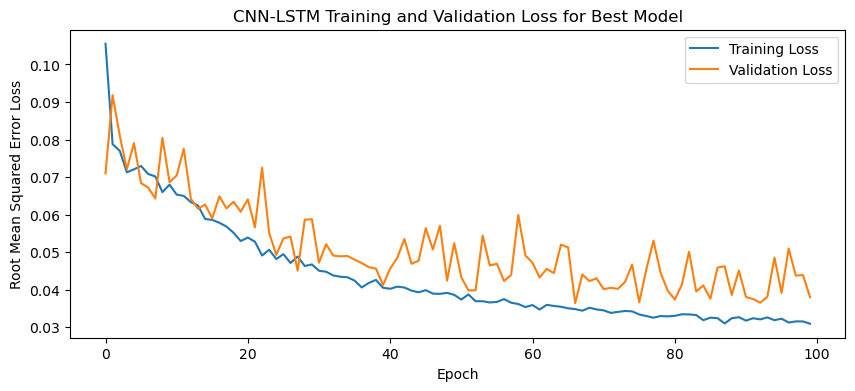

1/1 - 1s - loss: 0.0256 - 1s/epoch - 1s/step
Test Loss: 0.025615336373448372
1/1 [==============================] - 0s 31ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

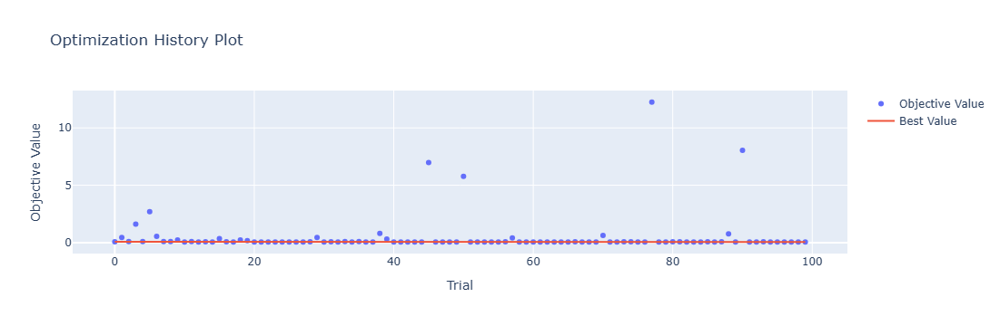

In [4]:
optuna.visualization.plot_optimization_history(study)

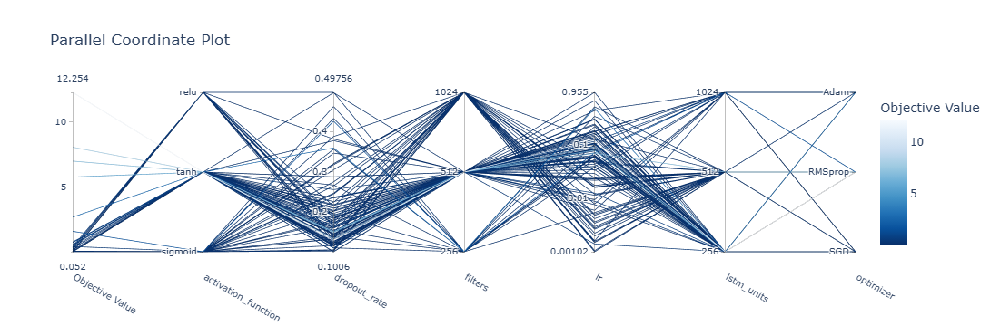

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

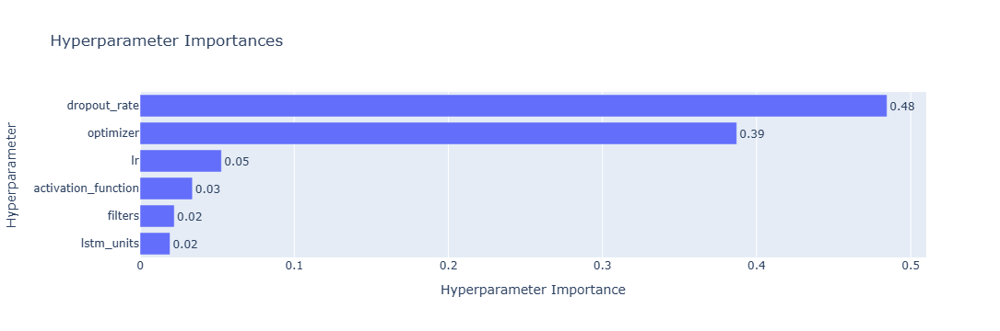

In [6]:
optuna.visualization.plot_param_importances(study)

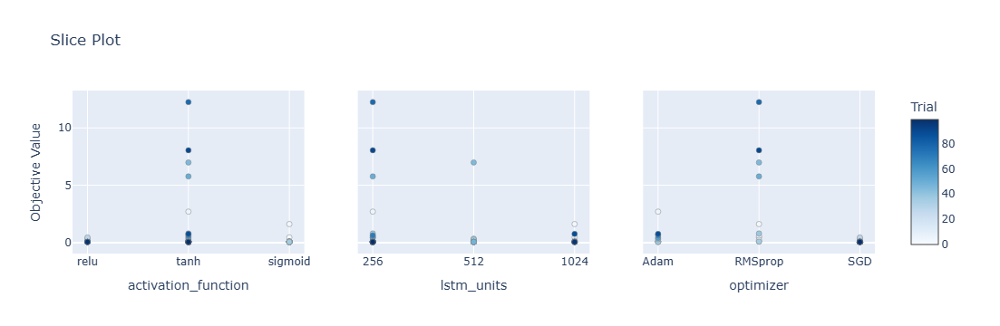

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

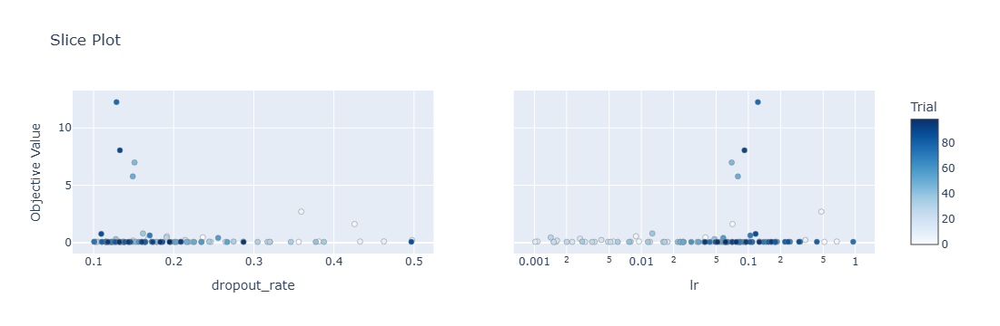

In [9]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 7s 34ms/step - loss: 0.1115 - accuracy: 0.6071 - mae: 0.0932 - rmse: 0.1115 - mape: 19.6410 - pearson: 0.7178 - val_loss: 0.0850 - val_accuracy: 0.0000e+00 - val_mae: 0.0689 - val_rmse: 0.0850 - val_mape: 16.2172 - val_pearson: 0.7397
Epoch 2/100
84/84 [==============================] - 1s 13ms/step - loss: 0.0774 - accuracy: 0.6548 - mae: 0.0602 - rmse: 0.0774 - mape: 13.5001 - pearson: 0.7821 - val_loss: 0.0681 - val_accuracy: 0.6000 - val_mae: 0.0587 - val_rmse: 0.0681 - val_mape: 13.2347 - val_pearson: 0.8119
Epoch 3/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0768 - accuracy: 0.6548 - mae: 0.0596 - rmse: 0.0768 - mape: 13.2931 - pearson: 0.7862 -

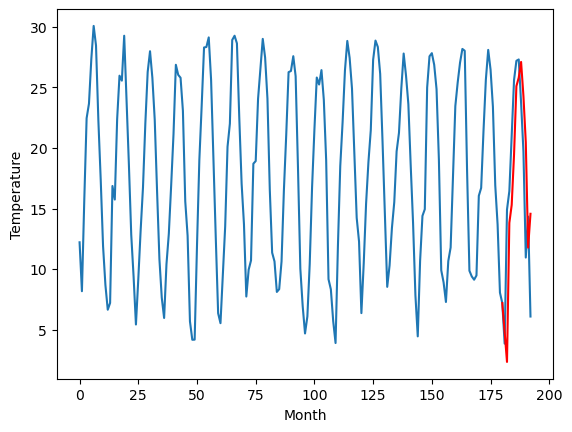

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		12.40		-0.47
12.78		12.46		-0.32
17.84		19.94		2.10
19.24		21.31		2.07
23.26		25.07		1.81
26.74		28.88		2.14
27.96		29.54		1.58
28.30		30.71		2.41
26.17		28.23		2.06
23.54		26.07		2.53
18.03		18.10		0.07
17.79		21.19		3.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 12.39892514705658, 12.464893891513348, 19.940857484042645, 21.30536098688841, 25.0679525873065, 28.878292038142682, 29.544504894912244, 30.70828474968672, 28.23401464432478, 26.068608178794385, 18.097662820518018, 21.191806688010693]


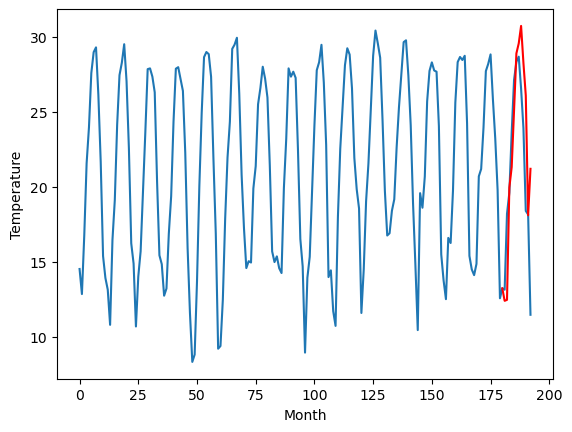

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.36		-0.98
16.20		13.90		-2.30
22.18		22.24		0.06
23.82		23.87		0.05
27.80		27.73		-0.07
31.94		32.23		0.29
33.70		33.02		-0.68
33.98		34.18		0.20
30.41		31.39		0.98
26.53		28.77		2.24
18.17		20.34		2.17
20.35		23.17		2.82
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 14.35746838569641, 13.904988635778427, 22.240279544591903, 23.867523540258407, 27.728710998296737, 32.22840916037559, 33.02435188412666, 34.18351082921028, 31.38701968312263, 28.765168715715404, 20.33986144185066, 23.169330168962475]


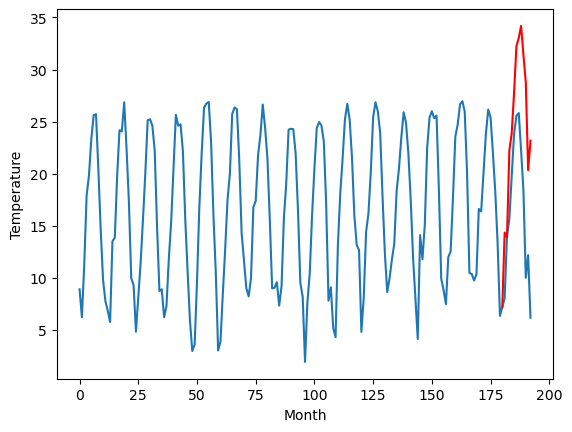

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		8.88		-0.12
7.43		7.83		0.40
15.34		17.22		1.88
17.13		18.35		1.22
21.10		22.27		1.17
24.38		26.54		2.16
25.01		27.00		1.99
25.06		28.43		3.37
22.55		25.93		3.38
20.24		23.44		3.20
12.15		15.02		2.87
14.92		18.68		3.76
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 8.876821499168873, 7.832838158905506, 17.21934614688158, 18.34904871493578, 22.26702771693468, 26.543945174515247, 27.003602783977986, 28.426963966190815, 25.93131200581789, 23.441579978764057, 15.018198173344135, 18.682786386311054]


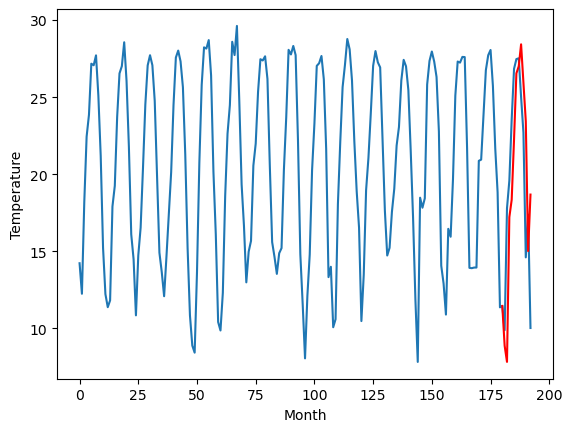

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.80		0.45
10.26		11.00		0.74
20.16		22.54		2.38
22.09		24.14		2.05
25.95		28.35		2.40
31.15		34.20		3.05
31.58		34.95		3.37
32.34		36.15		3.81
30.33		33.62		3.29
25.98		29.21		3.23
18.41		21.29		2.88
20.74		23.45		2.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 13.800087343454361, 11.004874597787857, 22.538760553598404, 24.138828288316727, 28.353770266771317, 34.19526721119881, 34.95378125786782, 36.150694500207905, 33.61687506318093, 29.211882959604267, 21.285728346109394, 23.453923116922383]


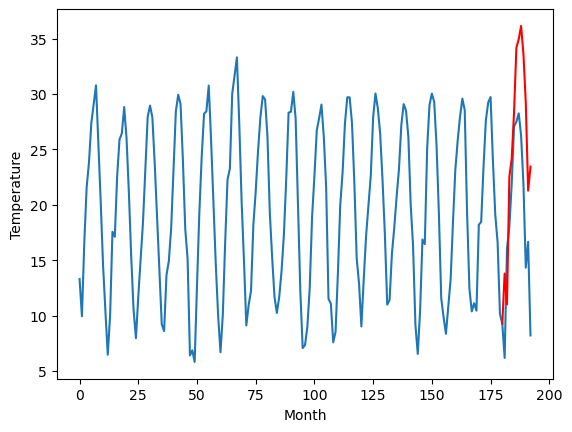

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.90		1.38
12.17		12.78		0.61
17.07		20.27		3.20
20.44		22.50		2.06
23.95		26.37		2.42
28.52		31.10		2.58
30.51		32.01		1.50
30.99		33.08		2.09
27.98		30.12		2.14
24.38		27.40		3.02
16.21		19.03		2.82
17.26		20.99		3.73
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.903090316057206, 12.783025290071965, 20.27132942825556, 22.502486731112004, 26.3724293962121, 31.098934675753117, 32.01023229509592, 33.08183654695749, 30.11992224603891, 27.40147003084421, 19.026322211325166, 20.992341364920136]


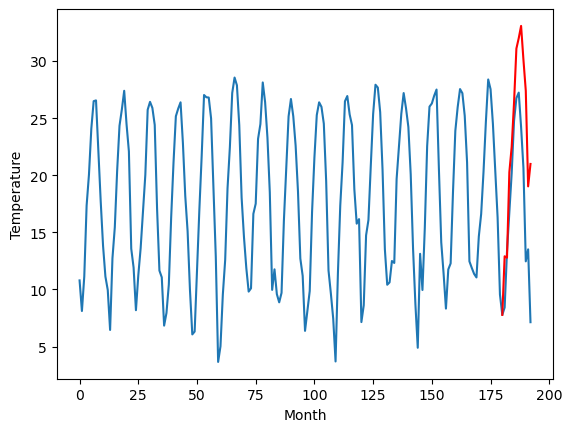

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		10.31		0.10
10.85		9.76		-1.09
17.83		18.03		0.20
18.86		20.18		1.32
22.57		24.10		1.53
26.90		29.11		2.21
28.52		30.03		1.51
28.46		31.10		2.64
24.41		28.00		3.59
21.18		25.13		3.95
12.53		16.47		3.94
14.47		18.51		4.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.314570524692535, 9.762236156463622, 18.027949848175048, 20.17897943496704, 24.09929923057556, 29.111988821029662, 30.027391293048858, 31.097706415653228, 28.004280664920806, 25.125576832294463, 16.47488961458206, 18.505835392475127]


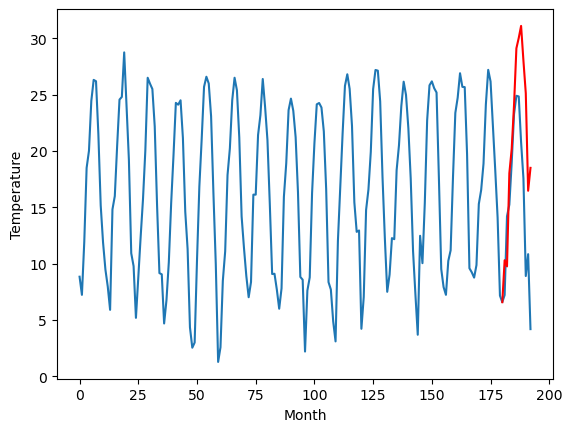

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.06		0.15
8.53		7.29		-1.24
15.05		15.88		0.83
18.68		18.33		-0.35
21.70		22.36		0.66
26.49		27.77		1.28
28.61		28.68		0.07
28.56		29.78		1.22
24.05		26.49		2.44
20.20		23.53		3.33
10.70		14.47		3.77
12.76		16.21		3.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 8.06288526058197, 7.285090899467468, 15.881164050102234, 18.328004813194276, 22.36355016231537, 27.774204230308534, 28.679297423362733, 29.782955861091615, 26.487412428855897, 23.525111651420595, 14.472752070426942, 16.213531947135927]


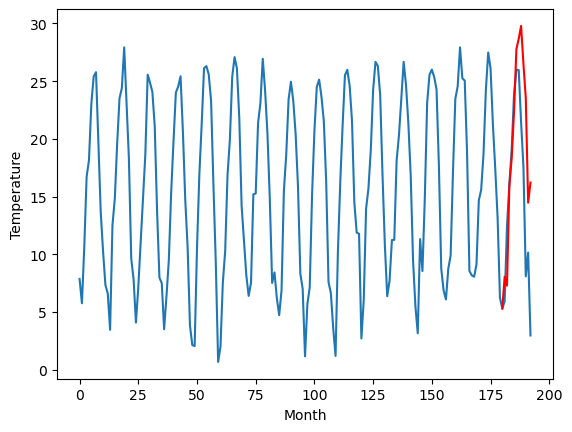

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.64		-0.44
2.81		2.95		0.14
15.28		16.10		0.82
17.88		18.30		0.42
22.57		22.71		0.14
28.76		29.65		0.89
29.33		30.21		0.88
29.27		31.51		2.24
25.53		28.26		2.73
21.57		23.79		2.22
11.53		14.33		2.80
13.33		15.75		2.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 6.642064805030823, 2.95114492893219, 16.097097153663636, 18.302204365730287, 22.706324334144593, 29.648414845466615, 30.214155967235566, 31.51034801721573, 28.259920055866242, 23.786856586933137, 14.331481869220735, 15.746289904117585]


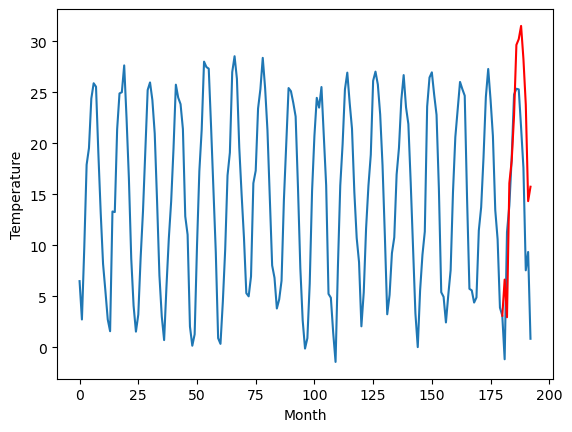

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		4.78		-0.12
2.73		1.90		-0.83
13.48		13.78		0.30
16.54		16.62		0.08
21.01		21.02		0.01
27.49		27.94		0.45
28.50		28.37		-0.13
29.10		29.82		0.72
25.24		26.02		0.78
20.77		22.49		1.72
10.11		11.94		1.83
11.34		13.06		1.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 4.784436573982239, 1.9042748117446902, 13.779892792701721, 16.618032326698305, 21.01832043170929, 27.936030735969545, 28.374121954441073, 29.818404009342196, 26.020114471912386, 22.488229801654818, 11.940925648212435, 13.057020475864412]


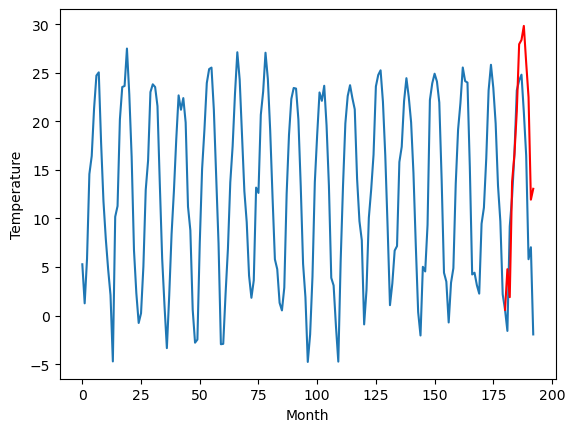

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		3.01		-0.67
-0.63		-0.66		-0.03
11.10		11.80		0.70
15.07		15.39		0.32
20.22		20.08		-0.14
27.53		27.80		0.27
28.12		28.06		-0.06
28.83		29.55		0.72
24.78		25.47		0.69
20.43		21.57		1.14
9.57		10.76		1.19
8.67		10.18		1.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 3.0132906818389893, -0.6581112957000732, 11.804160394668578, 15.394275941848754, 20.083009042739867, 27.795871057510375, 28.06269297838211, 29.549277760982513, 25.473827340602874, 21.568173863887786, 10.756030538082122, 10.176305034160613]


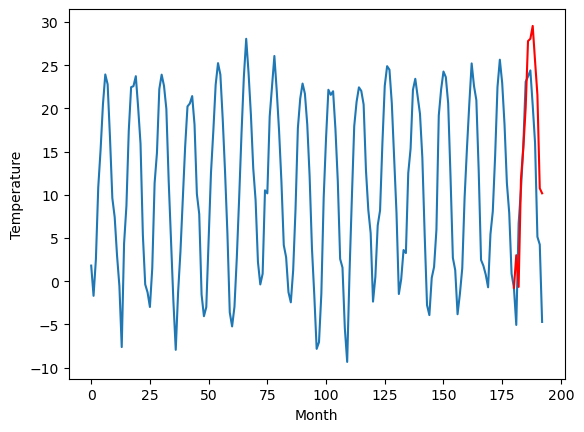

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.791966
1                 1   12.87  12.398925
2                 2   15.34  14.357468
3                 3    9.00   8.876821
4                 4   13.35  13.800087
5                 5   11.52  12.903090
6                 6   10.21  10.314571
7                 7    7.91   8.062885
8                 8    7.08   6.642065
9                 9    4.90   4.784437
10               10    3.68   3.013291


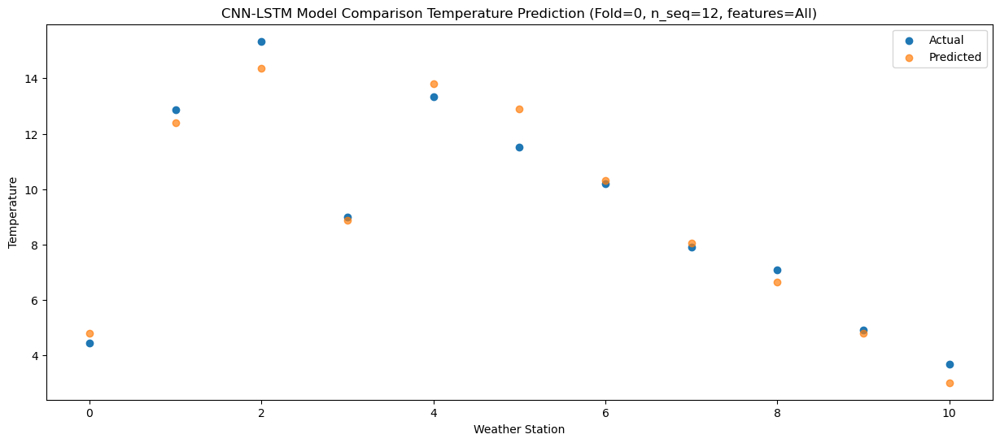

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   2.330028
1                 1   12.78  12.464894
2                 2   16.20  13.904989
3                 3    7.43   7.832838
4                 4   10.26  11.004875
5                 5   12.17  12.783025
6                 6   10.85   9.762236
7                 7    8.53   7.285091
8                 8    2.81   2.951145
9                 9    2.73   1.904275
10               10   -0.63  -0.658111


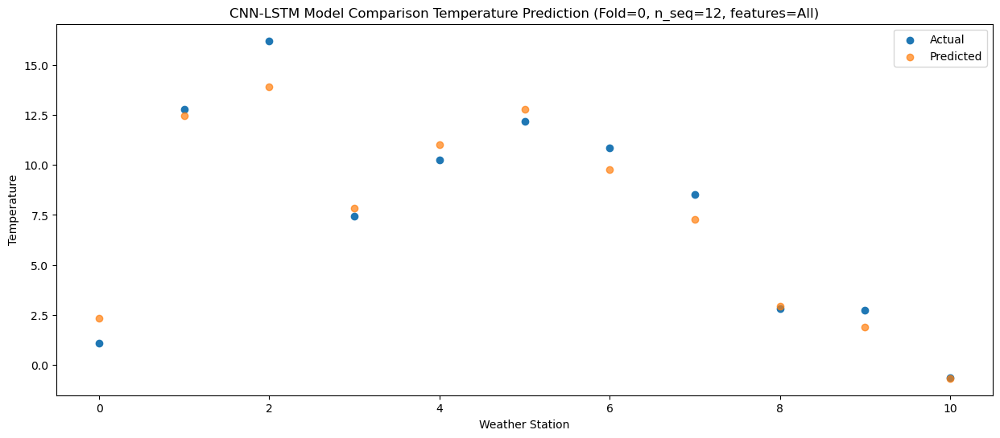

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  13.814103
1                 1   17.84  19.940857
2                 2   22.18  22.240280
3                 3   15.34  17.219346
4                 4   20.16  22.538761
5                 5   17.07  20.271329
6                 6   17.83  18.027950
7                 7   15.05  15.881164
8                 8   15.28  16.097097
9                 9   13.48  13.779893
10               10   11.10  11.804160


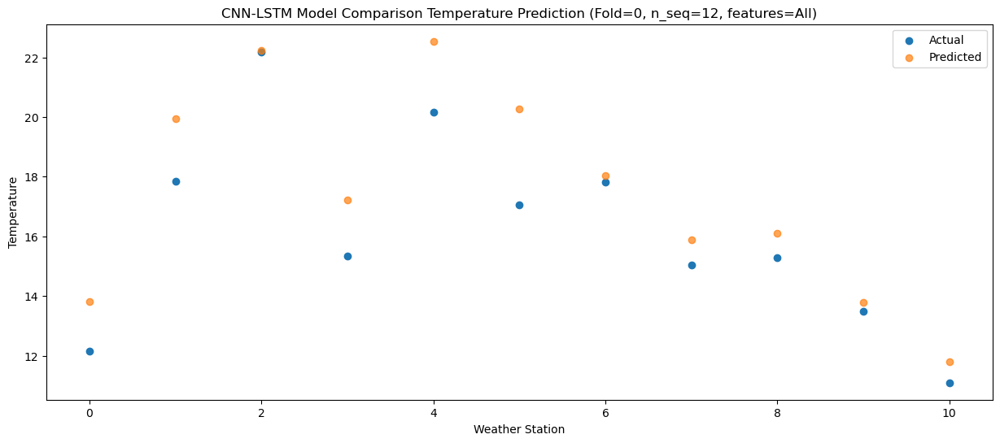

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.294442
1                 1   19.24  21.305361
2                 2   23.82  23.867524
3                 3   17.13  18.349049
4                 4   22.09  24.138828
5                 5   20.44  22.502487
6                 6   18.86  20.178979
7                 7   18.68  18.328005
8                 8   17.88  18.302204
9                 9   16.54  16.618032
10               10   15.07  15.394276


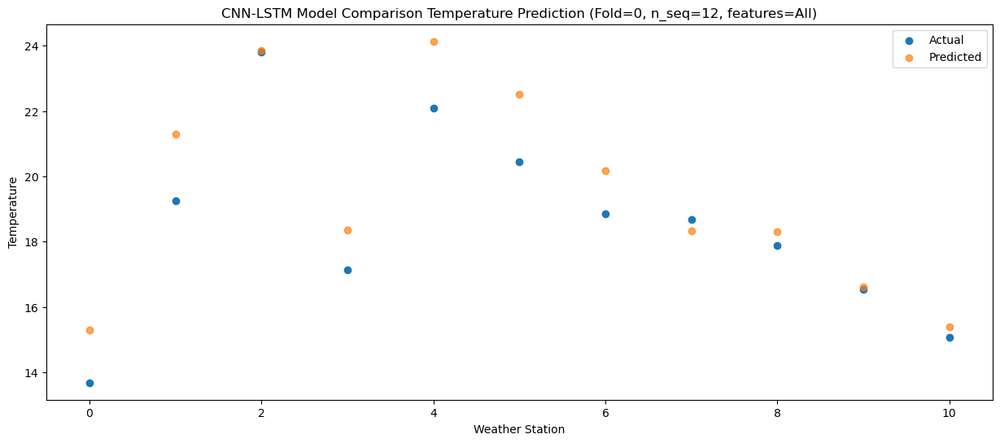

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  19.448900
1                 1   23.26  25.067953
2                 2   27.80  27.728711
3                 3   21.10  22.267028
4                 4   25.95  28.353770
5                 5   23.95  26.372429
6                 6   22.57  24.099299
7                 7   21.70  22.363550
8                 8   22.57  22.706324
9                 9   21.01  21.018320
10               10   20.22  20.083009


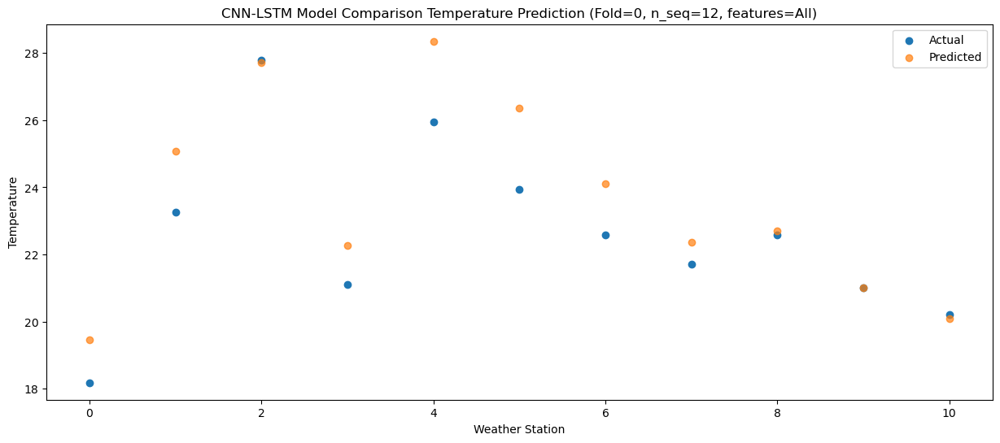

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  25.104292
1                 1   26.74  28.878292
2                 2   31.94  32.228409
3                 3   24.38  26.543945
4                 4   31.15  34.195267
5                 5   28.52  31.098935
6                 6   26.90  29.111989
7                 7   26.49  27.774204
8                 8   28.76  29.648415
9                 9   27.49  27.936031
10               10   27.53  27.795871


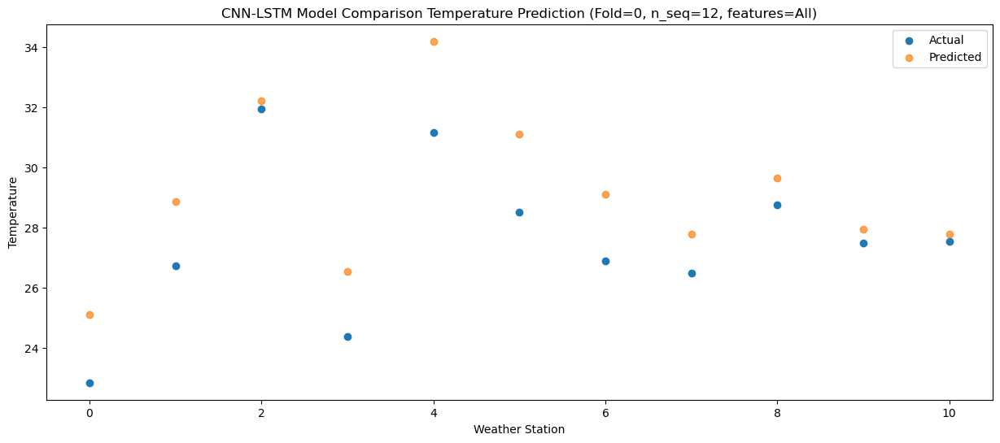

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44  25.810388
1                 1   27.96  29.544505
2                 2   33.70  33.024352
3                 3   25.01  27.003603
4                 4   31.58  34.953781
5                 5   30.51  32.010232
6                 6   28.52  30.027391
7                 7   28.61  28.679297
8                 8   29.33  30.214156
9                 9   28.50  28.374122
10               10   28.12  28.062693


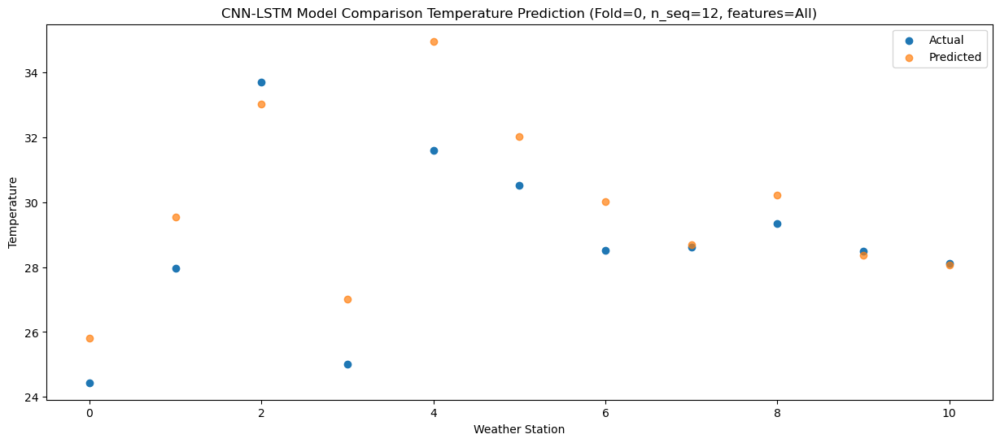

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  27.103793
1                 1   28.30  30.708285
2                 2   33.98  34.183511
3                 3   25.06  28.426964
4                 4   32.34  36.150695
5                 5   30.99  33.081837
6                 6   28.46  31.097706
7                 7   28.56  29.782956
8                 8   29.27  31.510348
9                 9   29.10  29.818404
10               10   28.83  29.549278


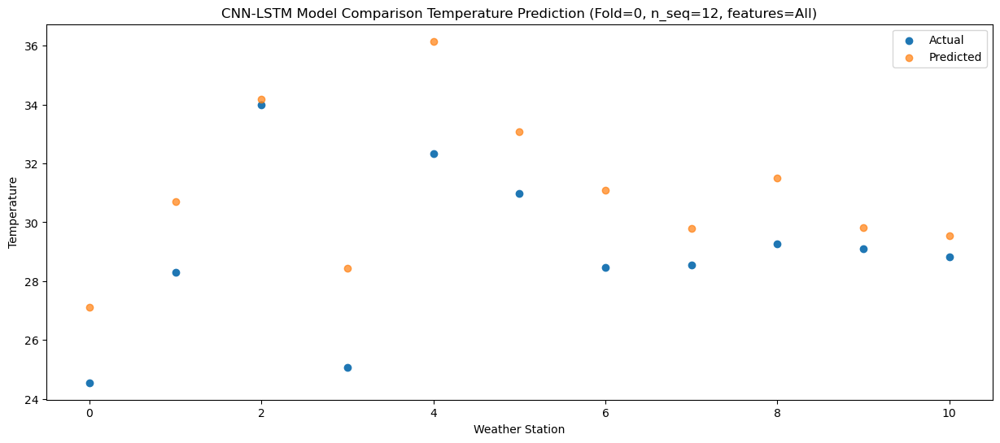

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  24.282635
1                 1   26.17  28.234015
2                 2   30.41  31.387020
3                 3   22.55  25.931312
4                 4   30.33  33.616875
5                 5   27.98  30.119922
6                 6   24.41  28.004281
7                 7   24.05  26.487412
8                 8   25.53  28.259920
9                 9   25.24  26.020114
10               10   24.78  25.473827


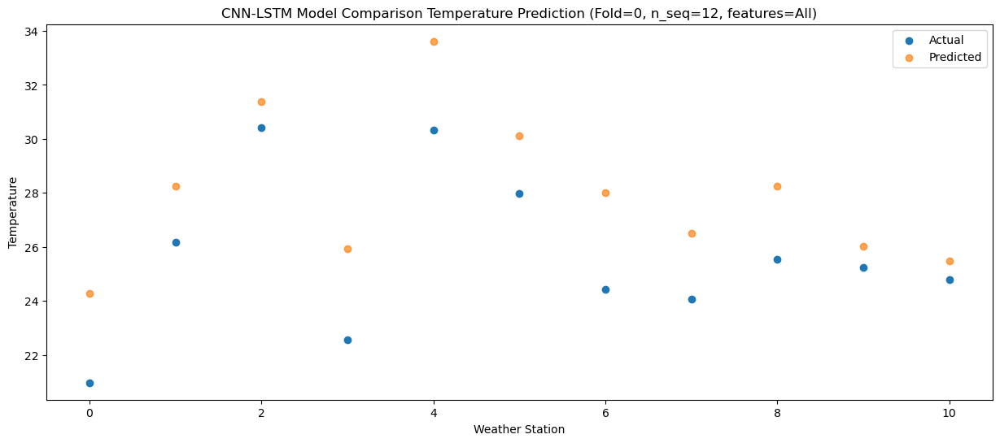

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  20.461010
1                 1   23.54  26.068608
2                 2   26.53  28.765169
3                 3   20.24  23.441580
4                 4   25.98  29.211883
5                 5   24.38  27.401470
6                 6   21.18  25.125577
7                 7   20.20  23.525112
8                 8   21.57  23.786857
9                 9   20.77  22.488230
10               10   20.43  21.568174


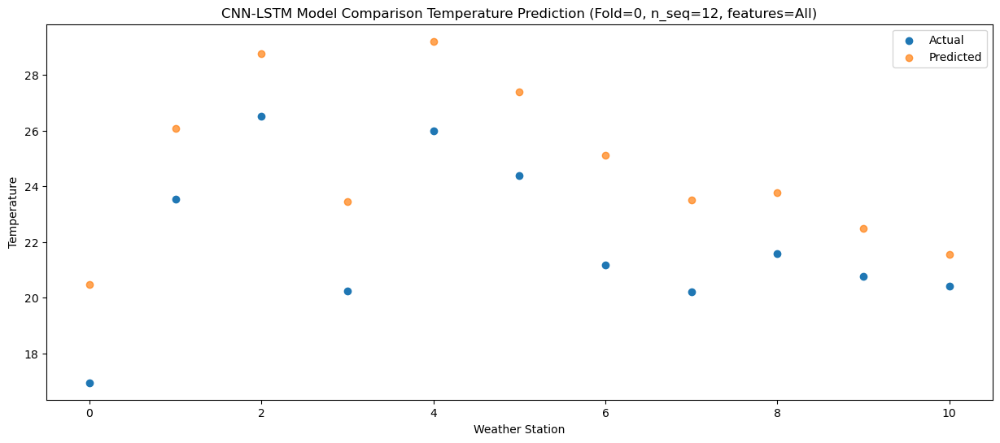

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19  11.771094
1                 1   18.03  18.097663
2                 2   18.17  20.339861
3                 3   12.15  15.018198
4                 4   18.41  21.285728
5                 5   16.21  19.026322
6                 6   12.53  16.474890
7                 7   10.70  14.472752
8                 8   11.53  14.331482
9                 9   10.11  11.940926
10               10    9.57  10.756031


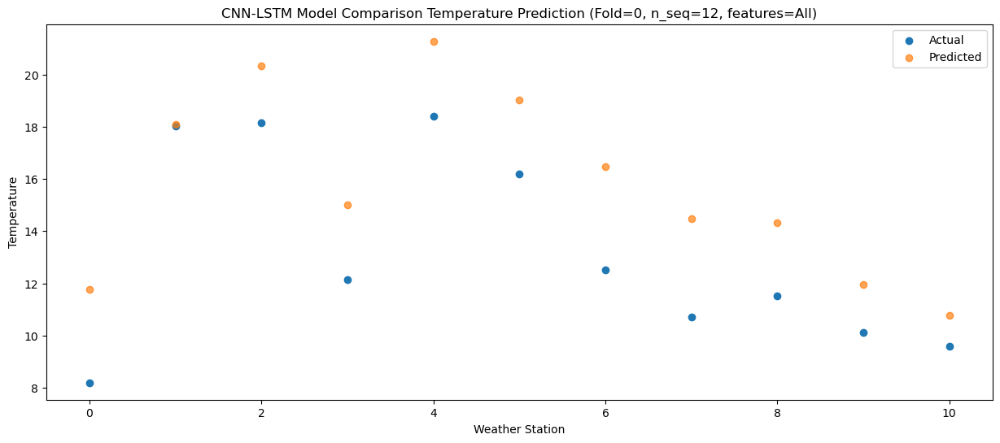

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57  14.565045
1                 1   17.79  21.191807
2                 2   20.35  23.169330
3                 3   14.92  18.682786
4                 4   20.74  23.453923
5                 5   17.26  20.992341
6                 6   14.47  18.505835
7                 7   12.76  16.213532
8                 8   13.33  15.746290
9                 9   11.34  13.057020
10               10    8.67  10.176305


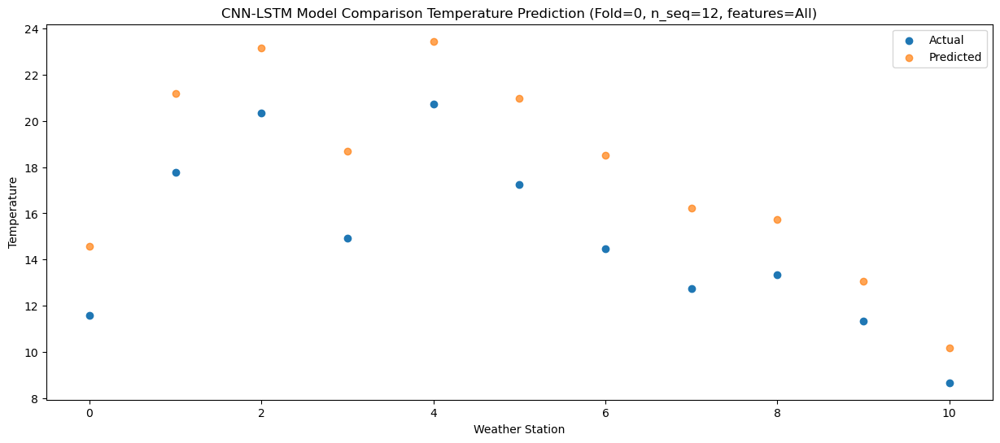

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 4.79196618 12.39892515 14.35746839  8.8768215  13.80008734 12.90309032
  10.31457052  8.06288526  6.64206481  4.78443657  3.01329068]
 [ 2.33002756 12.46489389 13

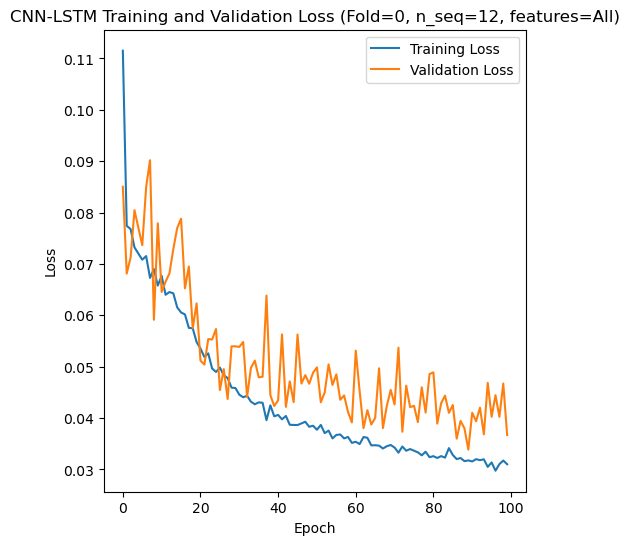

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 51s 331ms/step - loss: 0.1112 - accuracy: 0.5238 - mae: 0.0921 - rmse: 0.1112 - mape: 19.5215 - pearson: 0.6985 - val_loss: 0.0723 - val_accuracy: 0.8000 - val_mae: 0.0556 - val_rmse: 0.0723 - val_mape: 12.5920 - val_pearson: 0.7955
Epoch 2/100
84/84 [==============================] - 19s 229ms/step - loss: 0.0795 - accuracy: 0.7024 - mae: 0.0629 - rmse: 0.0795 - mape: 14.0752 - pearson: 0.7612 - val_loss: 0.0787 - val_accuracy: 0.1000 - val_mae: 0.0599 - val_rmse: 0.0787 - val_mape: 12.8755 - val_pearson: 0.7892
Epoch 3/100
84/84 [==============================] - 19s 231ms/step - loss: 0.0771 - accuracy: 0.6548 - mae: 0.0607 - rmse: 0.0771 - mape: 13.4472 - pearson: 0.7873

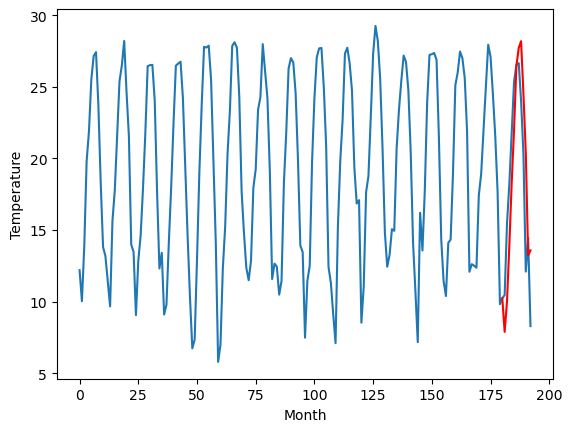

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.88		-0.12
12.66		13.04		0.38
19.43		18.94		-0.49
21.57		22.99		1.42
25.30		26.72		1.42
29.44		31.66		2.22
30.82		32.83		2.01
31.09		33.42		2.33
27.35		29.60		2.25
23.57		25.38		1.81
15.91		17.39		1.48
17.54		18.55		1.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 11.879891318082809, 13.038273972272872, 18.944114369153976, 22.98730246424675, 26.71881405711174, 31.66152302622795, 32.829255384206775, 33.41830895543099, 29.601293545961383, 25.381432992219928, 17.393086415529254, 18.545858961343768]


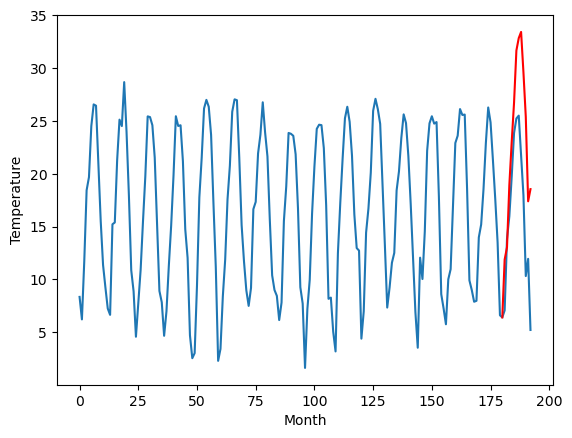

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		8.27		-0.50
9.26		9.26		-0.00
16.32		15.52		-0.80
17.72		19.16		1.44
21.84		22.82		0.98
25.72		27.50		1.78
26.49		28.67		2.18
27.15		29.23		2.08
24.13		25.65		1.52
20.35		21.49		1.14
12.61		13.65		1.04
15.21		15.37		0.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 8.269787719845771, 9.25960206091404, 15.523207655549049, 19.155901899933816, 22.824535122513772, 27.495062103867532, 28.66516219675541, 29.22834270298481, 25.650681665539743, 21.49133794605732, 13.645348241925241, 15.373936703801157]


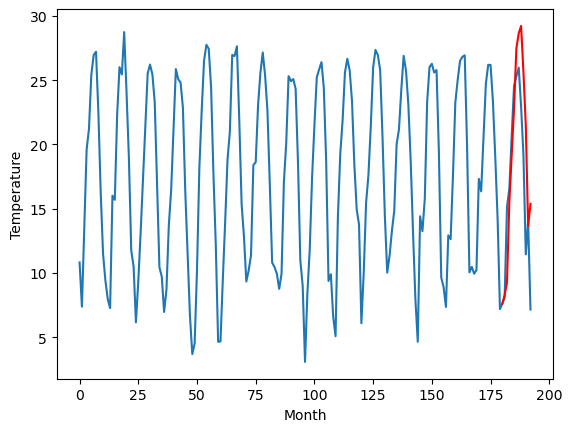

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		10.79		0.07
9.13		10.80		1.67
16.50		18.12		1.62
18.84		21.68		2.84
22.73		25.45		2.72
26.62		30.47		3.85
26.50		31.62		5.12
27.47		32.12		4.65
24.46		28.84		4.38
21.77		23.98		2.21
14.61		16.68		2.07
17.98		17.93		-0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 10.791819579601288, 10.796316103711725, 18.11707253910601, 21.681700663343072, 25.44534917332232, 30.469520525708795, 31.621625737920404, 32.11837805964053, 28.84074177004397, 23.983853952661157, 16.681646005883813, 17.927823440805078]


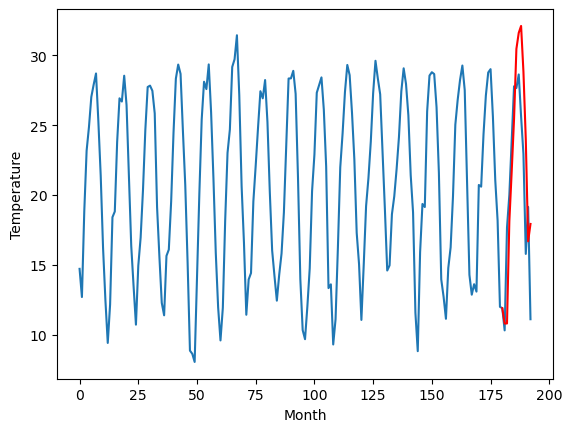

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		14.63		-0.07
13.00		14.44		1.44
20.61		22.19		1.58
22.91		25.71		2.80
27.03		29.47		2.44
30.50		34.59		4.09
30.59		35.71		5.12
31.56		36.26		4.70
27.98		32.97		4.99
24.94		28.07		3.13
17.39		20.60		3.21
21.27		22.07		0.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 14.632744475305081, 14.43926849871874, 22.193433194458486, 25.711890130341054, 29.473035722076894, 34.591928868591786, 35.71285799056292, 36.25694188386202, 32.97051653176546, 28.072723715603352, 20.59864267617464, 22.069347589313985]


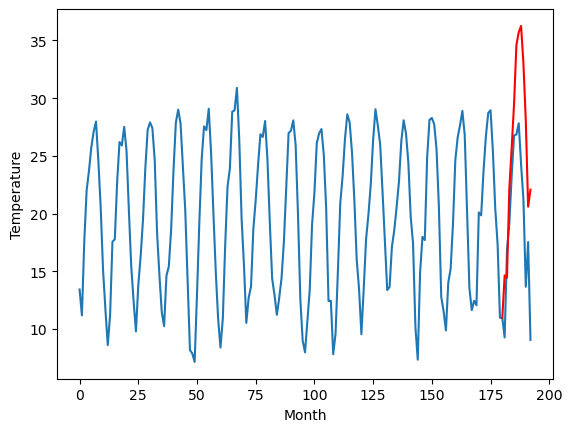

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		13.51		1.60
12.29		13.79		1.50
19.63		19.55		-0.08
21.90		24.08		2.18
27.49		28.00		0.51
31.76		33.62		1.86
31.10		35.00		3.90
30.51		35.10		4.59
30.15		31.93		1.78
25.83		25.85		0.02
19.36		20.05		0.69
19.62		18.70		-0.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.512042714357376, 13.793098641633987, 19.54546566128731, 24.081512166261675, 27.99719185948372, 33.615352107286455, 35.004342151880266, 35.10468178063631, 31.92869930535555, 25.85057668954134, 20.053096106350424, 18.6993400362134]


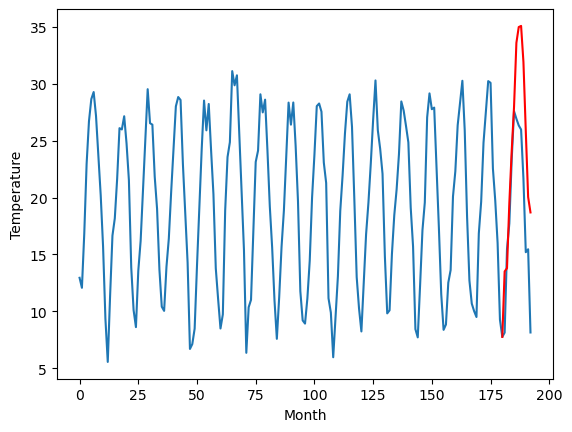

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		12.56		-0.19
13.53		13.80		0.27
19.81		19.47		-0.34
22.38		23.68		1.30
26.15		27.43		1.28
30.16		32.43		2.27
31.52		33.64		2.12
31.78		34.24		2.46
28.45		30.35		1.90
24.50		26.08		1.58
16.90		18.11		1.21
18.42		19.05		0.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 12.556074184179305, 13.799752753973006, 19.47241453528404, 23.68476967215538, 27.43120006918907, 32.4320850789547, 33.6406073987484, 34.240963619947436, 30.352864664793017, 26.077538412809375, 18.111521166563037, 19.054107648134234]


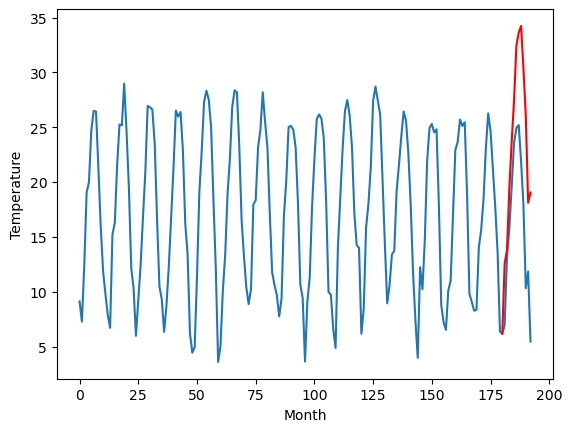

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.41		-0.40
5.81		6.57		0.76
17.13		17.14		0.01
18.84		20.71		1.87
23.50		24.68		1.18
29.58		30.90		1.32
30.57		31.90		1.33
31.79		32.43		0.64
28.08		28.82		0.74
22.88		23.29		0.41
13.58		14.76		1.18
15.99		15.79		-0.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 8.409020359516143, 6.570614631175994, 17.140838439464567, 20.705286557674405, 24.684508140087125, 30.898539836406705, 31.904462749958036, 32.427839572429654, 28.82224493741989, 23.293735320568082, 14.757994468212125, 15.793385083675382]


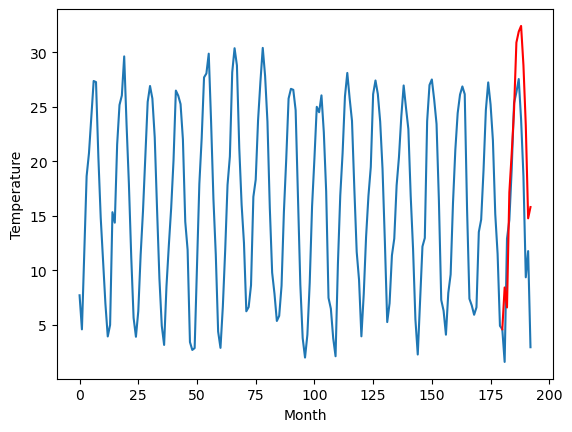

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		7.05		-0.29
2.56		4.29		1.73
15.12		15.46		0.34
16.92		19.25		2.33
21.73		23.45		1.72
27.76		30.32		2.56
29.27		31.49		2.22
29.66		31.65		1.99
27.15		28.27		1.12
20.90		21.57		0.67
13.15		14.04		0.89
12.34		13.30		0.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 7.052193703651429, 4.294634165763855, 15.46375113964081, 19.24570948123932, 23.45474964618683, 30.31877666950226, 31.492125096321107, 31.64722244679928, 28.26735775411129, 21.57073967397213, 14.04149858891964, 13.297041642069818]


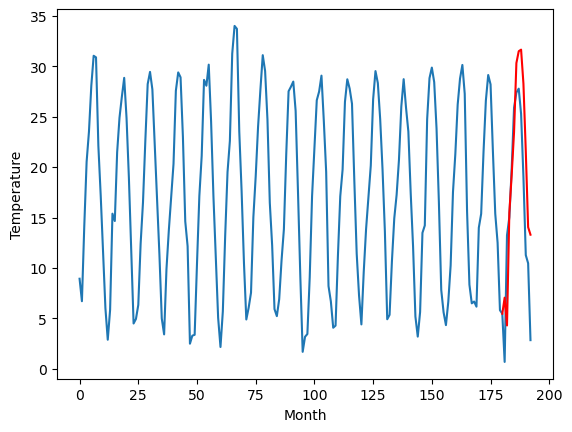

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		8.48		-0.56
4.67		6.19		1.52
15.38		15.53		0.15
19.14		20.07		0.93
23.69		24.44		0.75
30.80		31.65		0.85
31.47		33.10		1.63
31.32		32.81		1.49
29.37		29.42		0.05
21.93		21.95		0.02
15.68		15.77		0.09
14.07		12.69		-1.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 8.48457067489624, 6.193484954833984, 15.532185249328613, 20.067468338012695, 24.441916637420654, 31.653498344421386, 33.1049461889267, 32.814099811315536, 29.424236797094345, 21.95494367957115, 15.771380447149276, 12.689740203619003]


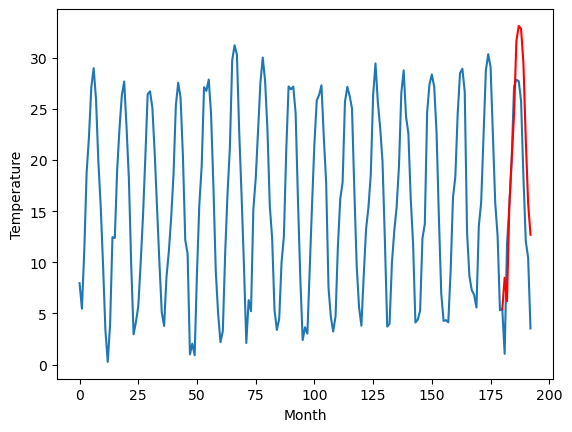

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.34		0.22
5.16		7.10		1.94
12.38		12.71		0.33
17.03		18.79		1.76
21.57		23.01		1.44
27.66		29.52		1.86
29.89		30.46		0.57
29.67		31.22		1.55
25.97		26.43		0.46
21.55		21.72		0.17
12.23		12.94		0.71
11.46		10.88		-0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 6.338032326698303, 7.100317380428314, 12.709507367610932, 18.788373849391938, 23.014944932460786, 29.517243764400483, 30.455662212371827, 31.217463932037354, 26.434608898162843, 21.72310110092163, 12.943061313629151, 10.875605783462525]


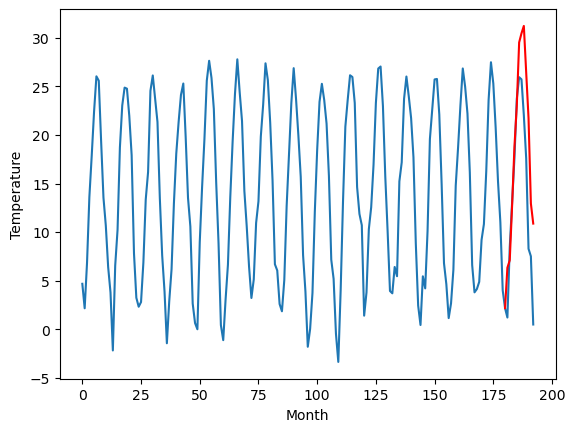

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   7.888353
1                 1   12.00  11.879891
2                 2    8.77   8.269788
3                 3   10.72  10.791820
4                 4   14.70  14.632744
5                 5   11.91  13.512043
6                 6   12.75  12.556074
7                 7    8.81   8.409020
8                 8    7.34   7.052194
9                 9    9.04   8.484571
10               10    6.12   6.338032


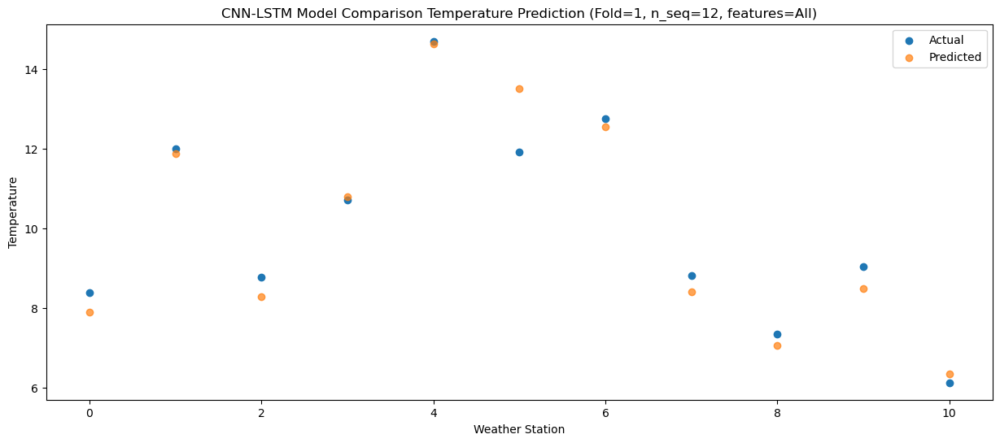

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60  10.002231
1                 1   12.66  13.038274
2                 2    9.26   9.259602
3                 3    9.13  10.796316
4                 4   13.00  14.439268
5                 5   12.29  13.793099
6                 6   13.53  13.799753
7                 7    5.81   6.570615
8                 8    2.56   4.294634
9                 9    4.67   6.193485
10               10    5.16   7.100317


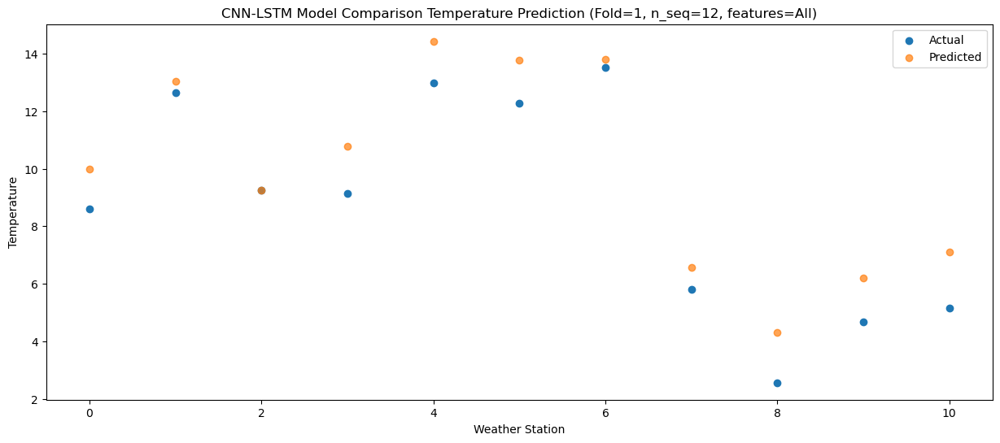

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  13.931844
1                 1   19.43  18.944114
2                 2   16.32  15.523208
3                 3   16.50  18.117073
4                 4   20.61  22.193433
5                 5   19.63  19.545466
6                 6   19.81  19.472415
7                 7   17.13  17.140838
8                 8   15.12  15.463751
9                 9   15.38  15.532185
10               10   12.38  12.709507


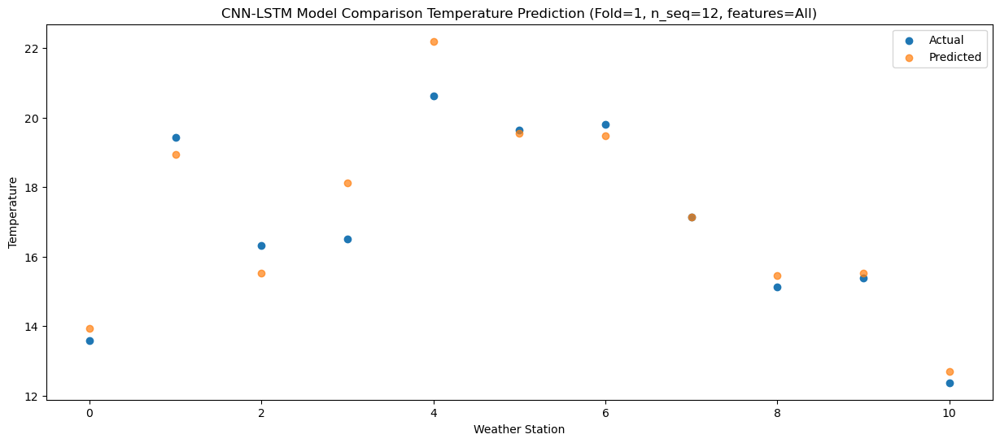

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  18.293353
1                 1   21.57  22.987302
2                 2   17.72  19.155902
3                 3   18.84  21.681701
4                 4   22.91  25.711890
5                 5   21.90  24.081512
6                 6   22.38  23.684770
7                 7   18.84  20.705287
8                 8   16.92  19.245709
9                 9   19.14  20.067468
10               10   17.03  18.788374


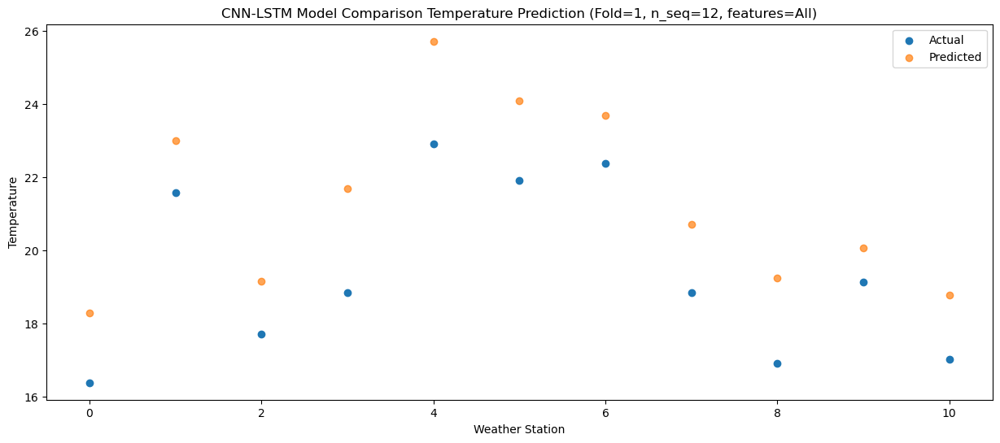

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  21.987840
1                 1   25.30  26.718814
2                 2   21.84  22.824535
3                 3   22.73  25.445349
4                 4   27.03  29.473036
5                 5   27.49  27.997192
6                 6   26.15  27.431200
7                 7   23.50  24.684508
8                 8   21.73  23.454750
9                 9   23.69  24.441917
10               10   21.57  23.014945


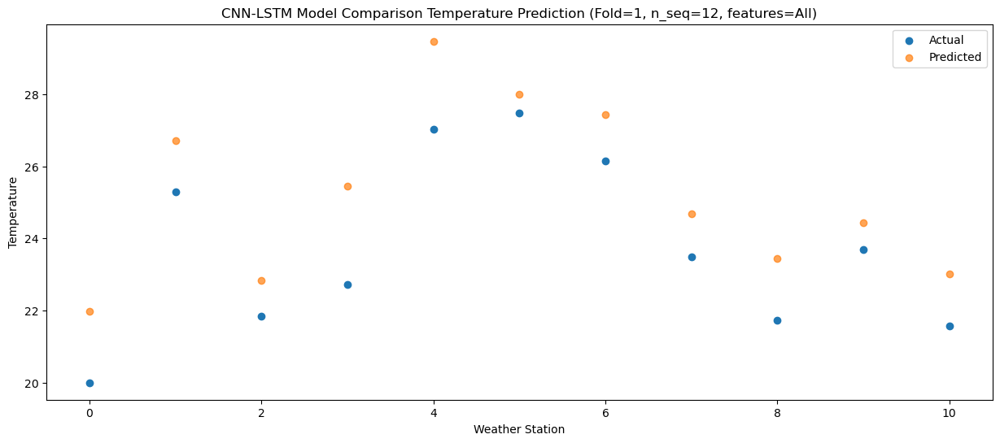

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  26.460450
1                 1   29.44  31.661523
2                 2   25.72  27.495062
3                 3   26.62  30.469521
4                 4   30.50  34.591929
5                 5   31.76  33.615352
6                 6   30.16  32.432085
7                 7   29.58  30.898540
8                 8   27.76  30.318777
9                 9   30.80  31.653498
10               10   27.66  29.517244


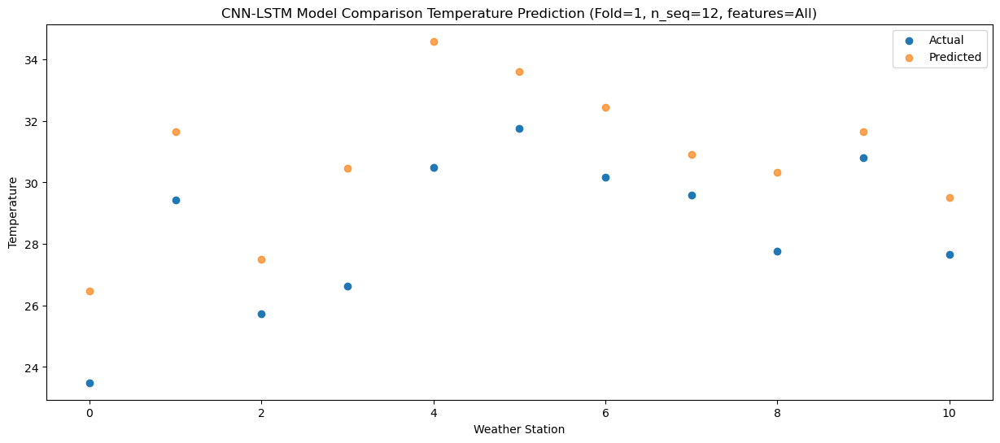

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  27.731274
1                 1   30.82  32.829255
2                 2   26.49  28.665162
3                 3   26.50  31.621626
4                 4   30.59  35.712858
5                 5   31.10  35.004342
6                 6   31.52  33.640607
7                 7   30.57  31.904463
8                 8   29.27  31.492125
9                 9   31.47  33.104946
10               10   29.89  30.455662


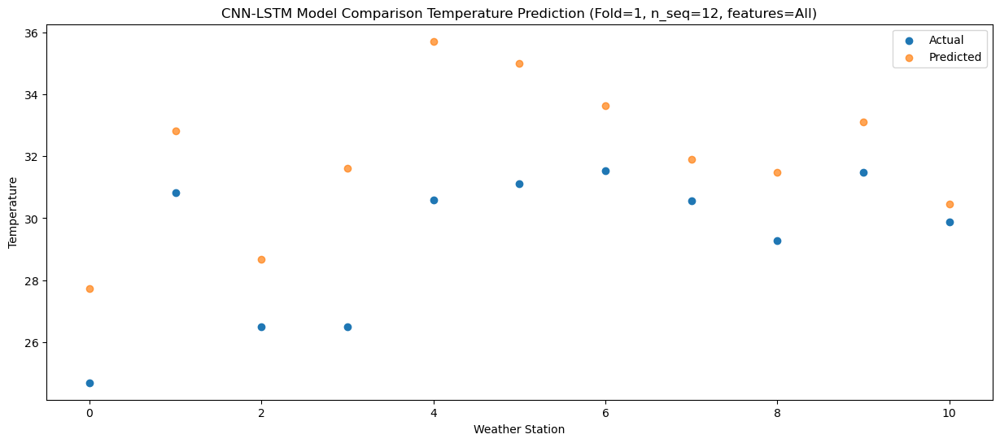

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  28.197455
1                 1   31.09  33.418309
2                 2   27.15  29.228343
3                 3   27.47  32.118378
4                 4   31.56  36.256942
5                 5   30.51  35.104682
6                 6   31.78  34.240964
7                 7   31.79  32.427840
8                 8   29.66  31.647222
9                 9   31.32  32.814100
10               10   29.67  31.217464


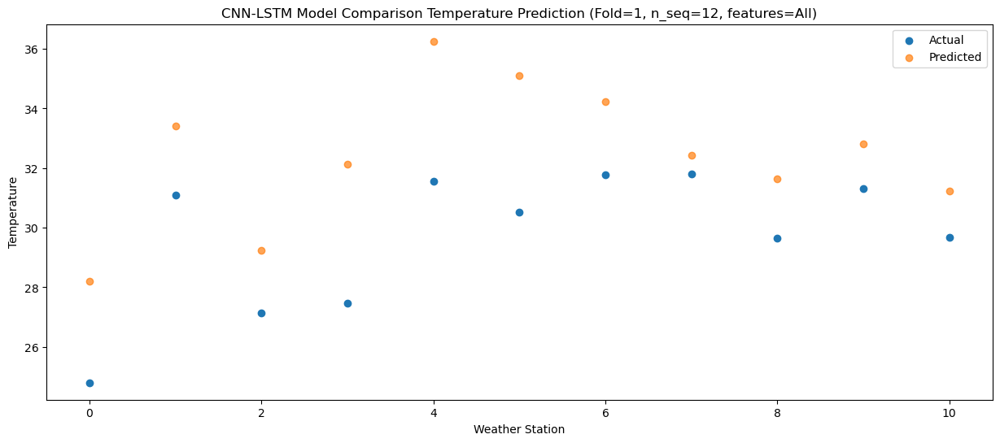

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  24.511122
1                 1   27.35  29.601294
2                 2   24.13  25.650682
3                 3   24.46  28.840742
4                 4   27.98  32.970517
5                 5   30.15  31.928699
6                 6   28.45  30.352865
7                 7   28.08  28.822245
8                 8   27.15  28.267358
9                 9   29.37  29.424237
10               10   25.97  26.434609


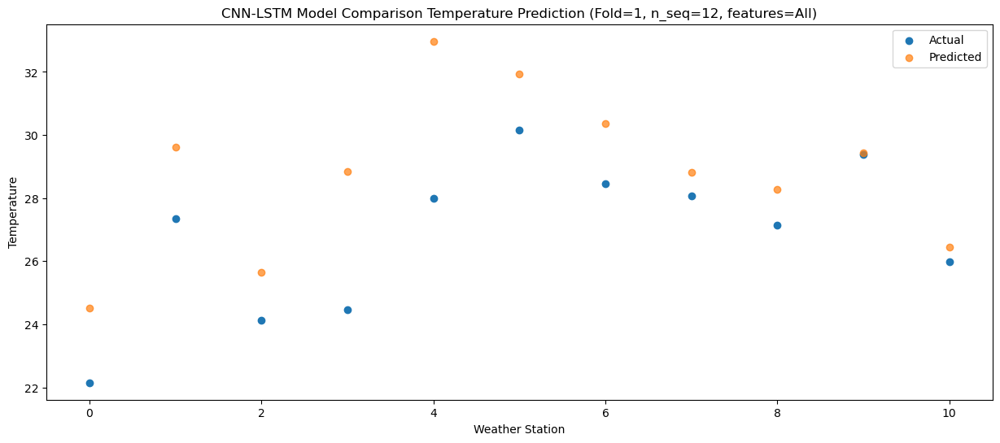

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  20.395108
1                 1   23.57  25.381433
2                 2   20.35  21.491338
3                 3   21.77  23.983854
4                 4   24.94  28.072724
5                 5   25.83  25.850577
6                 6   24.50  26.077538
7                 7   22.88  23.293735
8                 8   20.90  21.570740
9                 9   21.93  21.954944
10               10   21.55  21.723101


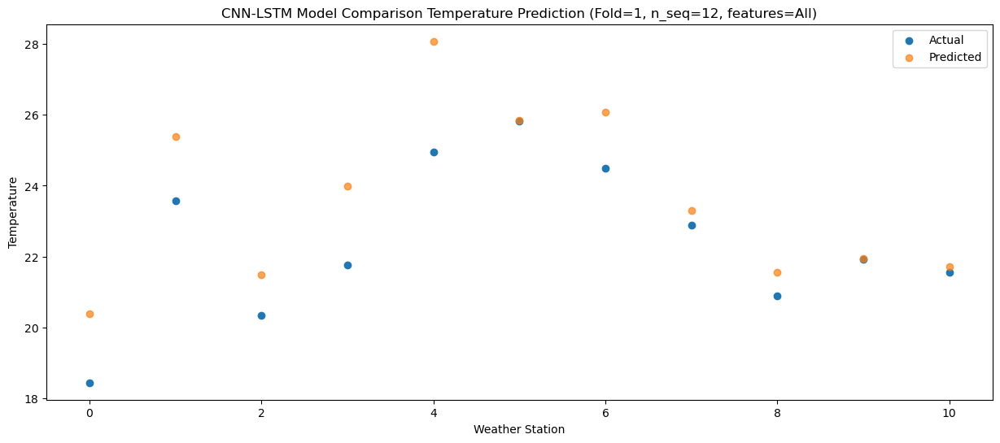

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24  13.229226
1                 1   15.91  17.393086
2                 2   12.61  13.645348
3                 3   14.61  16.681646
4                 4   17.39  20.598643
5                 5   19.36  20.053096
6                 6   16.90  18.111521
7                 7   13.58  14.757994
8                 8   13.15  14.041499
9                 9   15.68  15.771380
10               10   12.23  12.943061


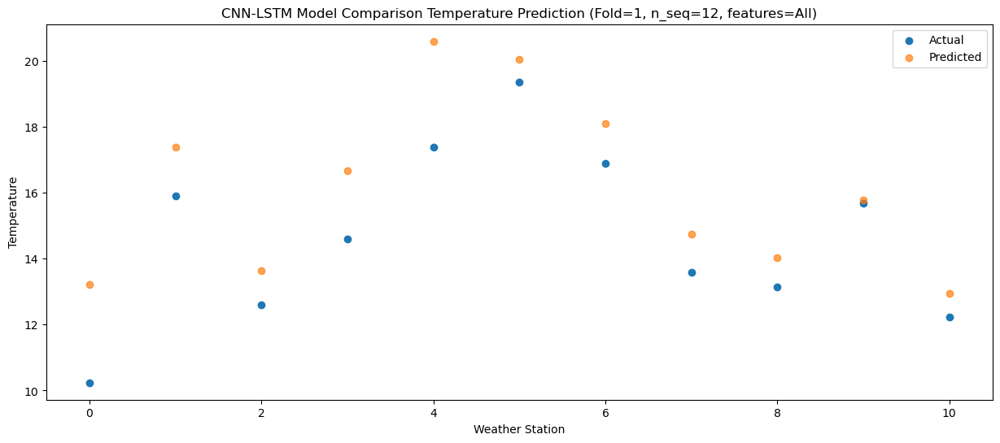

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59  13.582276
1                 1   17.54  18.545859
2                 2   15.21  15.373937
3                 3   17.98  17.927823
4                 4   21.27  22.069348
5                 5   19.62  18.699340
6                 6   18.42  19.054108
7                 7   15.99  15.793385
8                 8   12.34  13.297042
9                 9   14.07  12.689740
10               10   11.46  10.875606


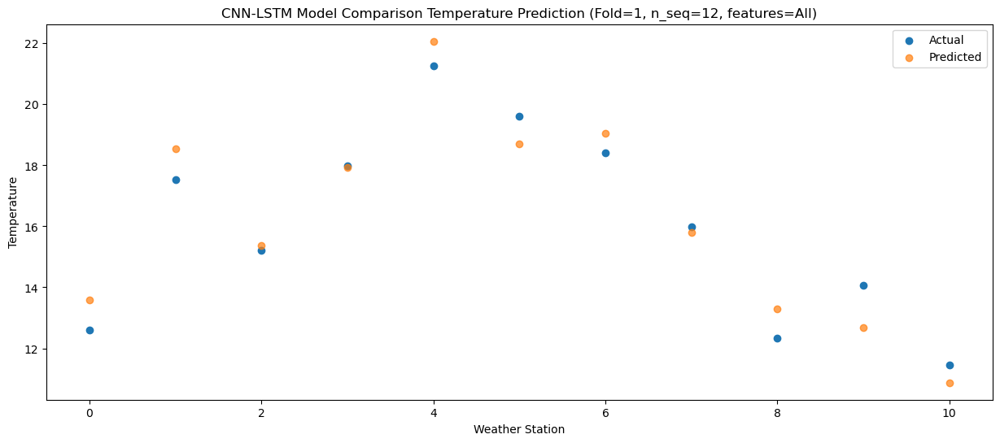

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 7.88835272 11.87989132  8.26978772 10.79181958 14.63274448 13.51204271
  12.55607418  8.40902036  7.0521937   8.48457067  6.33803233]
 [10.00223121 13.03827397  9

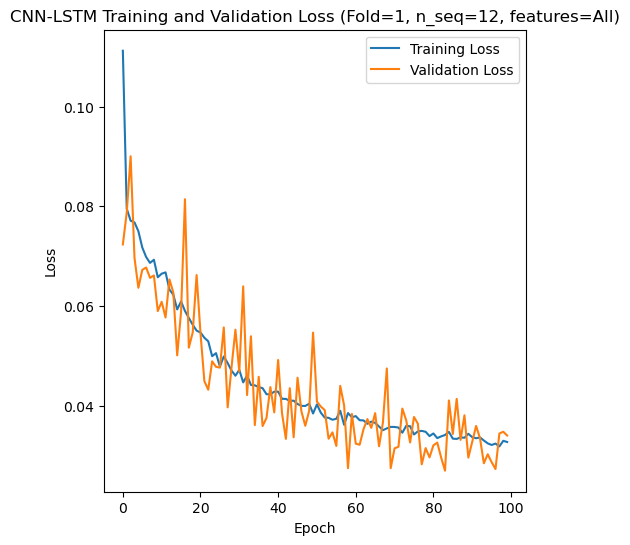

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 54s 324ms/step - loss: 0.1134 - accuracy: 0.5357 - mae: 0.0957 - rmse: 0.1134 - mape: 20.4256 - pearson: 0.7259 - val_loss: 0.0788 - val_accuracy: 0.9000 - val_mae: 0.0614 - val_rmse: 0.0788 - val_mape: 13.3582 - val_pearson: 0.8178
Epoch 2/100
84/84 [==============================] - 19s 228ms/step - loss: 0.0790 - accuracy: 0.6667 - mae: 0.0622 - rmse: 0.0790 - mape: 13.7964 - pearson: 0.7766 - val_loss: 0.0647 - val_accuracy: 0.9000 - val_mae: 0.0492 - val_rmse: 0.0647 - val_mape: 12.5978 - val_pearson: 0.9041
Epoch 3/100
84/84 [==============================] - 20s 233ms/step - loss: 0.0753 - accuracy: 0.6786 - mae: 0.0588 - rmse: 0.0753 - mape: 13.1122 - pearson: 0.7857

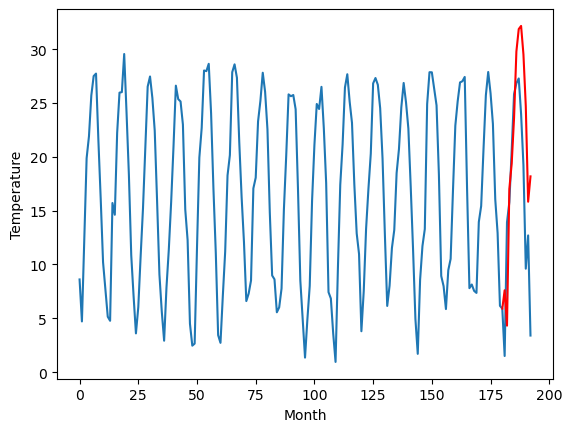

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.31		-0.22
4.49		3.93		-0.56
14.68		16.25		1.57
18.44		19.59		1.15
23.62		24.44		0.82
30.87		32.21		1.34
31.56		35.01		3.45
32.32		33.65		1.33
30.08		31.12		1.04
21.82		23.58		1.76
15.11		17.70		2.59
12.72		15.48		2.76
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 8.309756354093551, 3.92586143374443, 16.24866874575615, 19.5885096347332, 24.438202456235885, 32.21117408633232, 35.00581796526909, 33.64981587290764, 31.121028498411178, 23.58499629855156, 17.704482153654098, 15.478456095457076]


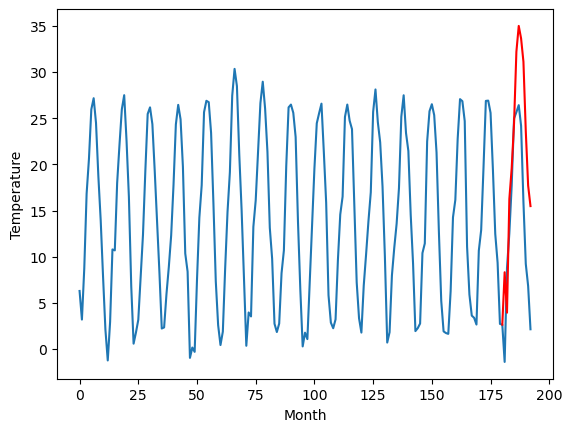

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		6.33		-0.61
9.67		7.34		-2.33
11.48		12.15		0.67
13.29		14.30		1.01
16.87		17.95		1.08
18.09		21.36		3.27
18.88		23.64		4.76
18.93		23.83		4.90
17.65		22.01		4.36
16.51		19.01		2.50
9.66		12.50		2.84
10.56		14.61		4.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 6.331091454923153, 7.3413872036337855, 12.145269325673581, 14.29780977100134, 17.9520534786582, 21.35945027202368, 23.637827566564084, 23.826440713107587, 22.01153554648161, 19.012120148837568, 12.499949357211591, 14.608058116137983]


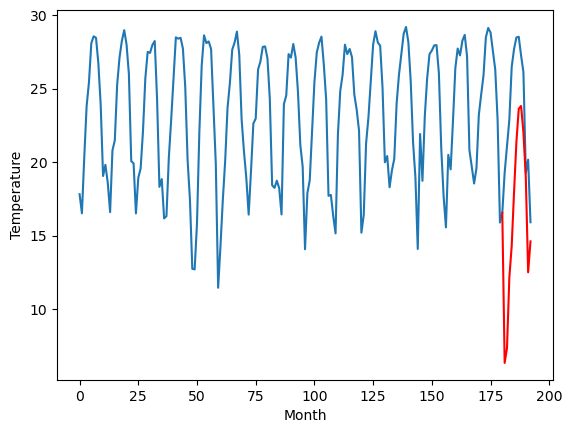

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.25		1.51
14.76		15.11		0.35
18.87		23.10		4.23
23.37		27.95		4.58
28.63		32.60		3.97
34.20		39.36		5.16
36.20		41.53		5.33
37.26		41.52		4.26
34.09		37.74		3.65
30.26		33.27		3.01
22.18		24.31		2.13
20.26		23.04		2.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 16.24969298362732, 15.106614418029785, 23.099825687408448, 27.94606143951416, 32.599932498931885, 39.35892183303833, 41.52608448982239, 41.516014642715454, 37.73704177856445, 33.266046352386475, 24.307277507781983, 23.04123372554779]


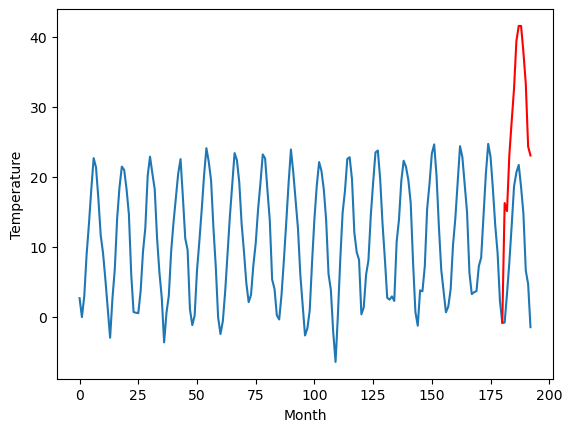

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.35		-0.68
2.29		1.48		-0.81
9.62		10.10		0.48
10.49		11.94		1.45
14.96		15.78		0.82
18.44		20.13		1.69
19.03		22.33		3.30
19.20		22.70		3.50
16.66		20.66		4.00
13.92		17.12		3.20
5.65		9.49		3.84
9.06		12.54		3.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 2.348379068374634, 1.4825503158569338, 10.096532516479492, 11.935027294158935, 15.778337173461914, 20.12783592224121, 22.33174627304077, 22.698351167440414, 20.659673475027084, 17.115263007879257, 9.485715888738632, 12.536262058019638]


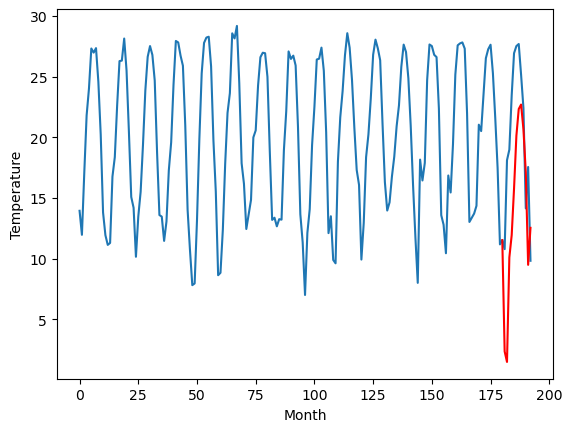

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.45		0.10
11.00		11.32		0.32
19.38		21.77		2.39
21.50		23.67		2.17
25.54		27.66		2.12
30.09		32.84		2.75
30.17		35.10		4.93
31.28		35.28		4.00
28.54		33.16		4.62
25.24		28.77		3.53
17.60		21.11		3.51
20.84		23.87		3.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 13.452352019548416, 11.323858233690261, 21.771432849168775, 23.671032043695448, 27.66356620430946, 32.839943500757215, 35.10033139824867, 35.282722460627554, 33.15766237914562, 28.76622580230236, 21.114093291163442, 23.870896326899526]


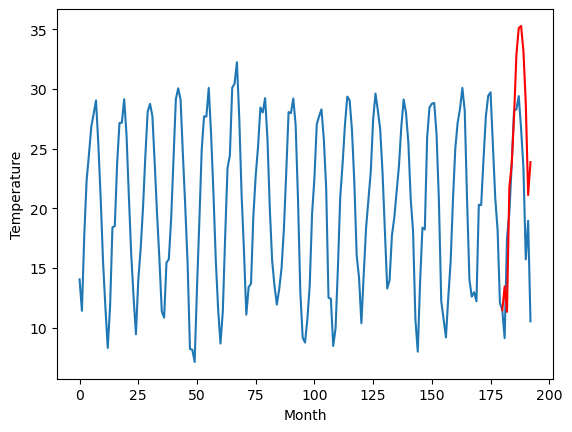

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.35		0.00
10.24		10.01		-0.23
20.61		22.40		1.79
22.31		24.44		2.13
26.39		28.61		2.22
31.95		34.62		2.67
32.84		36.85		4.01
33.40		36.94		3.54
31.13		34.67		3.54
26.62		29.57		2.95
18.65		21.63		2.98
20.94		23.93		2.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.352284419536591, 10.00909208059311, 22.403070199489594, 24.44460986852646, 28.608748662471772, 34.61860727071762, 36.854697453975675, 36.93529428094625, 34.66918076127767, 29.570682893693444, 21.627222906053063, 23.932013164460656]


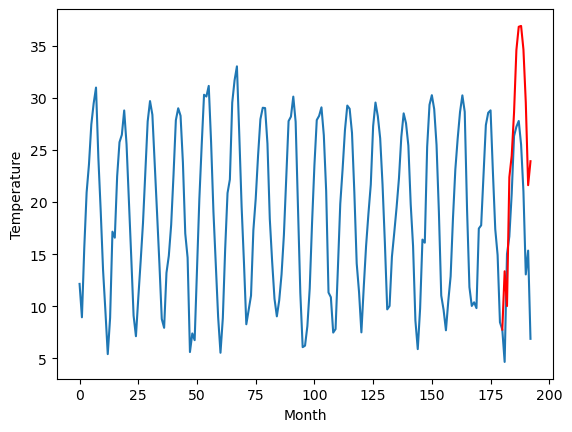

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		12.29		-0.39
15.60		11.60		-4.00
18.70		17.51		-1.19
25.36		21.12		-4.24
30.37		25.54		-4.83
35.36		31.31		-4.05
34.16		34.27		0.11
33.64		33.08		-0.56
31.46		30.85		-0.61
24.90		24.72		-0.18
19.50		19.92		0.42
16.15		18.25		2.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 12.293232991695405, 11.603411271572114, 17.5148659491539, 21.116175725460053, 25.544976308345795, 31.310676171779633, 34.27051837682724, 33.075528218746186, 30.85235889196396, 24.717974259853364, 19.91741998434067, 18.251876308918]


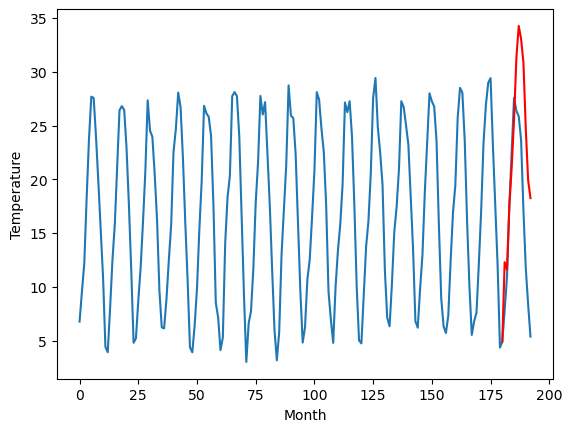

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		7.41		0.70
5.79		7.60		1.81
5.39		10.83		5.44
9.25		14.93		5.68
11.47		19.31		7.84
15.71		24.92		9.21
18.69		28.19		9.50
18.29		26.39		8.10
16.51		24.30		7.79
11.53		17.73		6.20
10.27		14.51		4.24
3.76		11.11		7.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 7.406611342430114, 7.604517404437065, 10.834026519656181, 14.928409759402275, 19.309666339755058, 24.920993034243583, 28.192959968447685, 26.387255493998527, 24.30469257056713, 17.73412782371044, 14.505085770487785, 11.113367621302604]


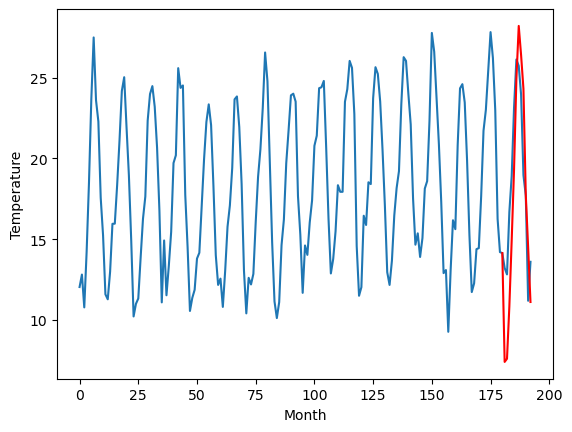

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.25		-0.38
12.13		10.23		-1.90
19.01		19.26		0.25
21.80		21.95		0.15
25.82		25.99		0.17
30.11		31.20		1.09
31.68		33.49		1.81
31.77		33.80		2.03
27.66		31.05		3.39
24.38		27.12		2.74
15.47		18.57		3.10
17.39		20.81		3.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 11.247410812377929, 10.22831968307495, 19.261907138824462, 21.950343885421752, 25.989254274368285, 31.19982460975647, 33.490958013534545, 33.803934433460235, 31.048016407489776, 27.11858806848526, 18.567865946292876, 20.813753464221953]


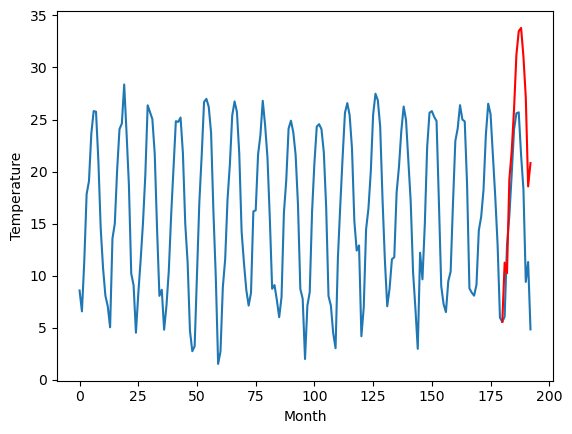

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		7.55		-1.35
10.25		6.11		-4.14
16.46		15.91		-0.55
18.43		18.83		0.40
23.34		22.98		-0.36
28.75		28.62		-0.13
30.06		30.82		0.76
30.14		31.18		1.04
25.65		28.23		2.58
21.89		24.20		2.31
11.67		15.21		3.54
13.77		17.26		3.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 7.550497837066651, 6.10854513168335, 15.91226655960083, 18.827790803909302, 22.983089990615845, 28.617484159469605, 30.817525215148926, 31.17828673839569, 28.227562851905823, 24.204416699409485, 15.207944340705872, 17.262214608192444]


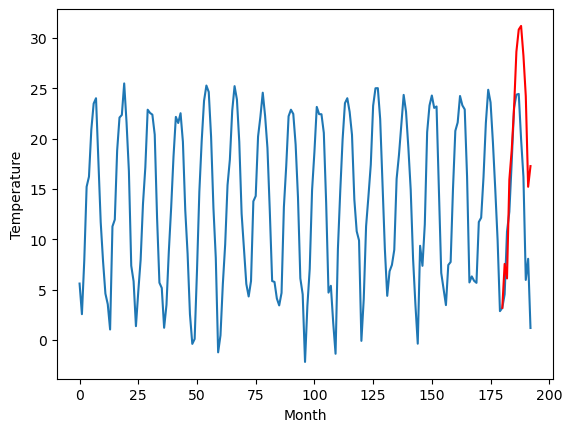

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   7.604739
1                 1    8.53   8.309756
2                 2    6.94   6.331091
3                 3   14.74  16.249693
4                 4    3.03   2.348379
5                 5   13.35  13.452352
6                 6   13.35  13.352284
7                 7   12.68  12.293233
8                 8    6.71   7.406611
9                 9   11.63  11.247411
10               10    8.90   7.550498


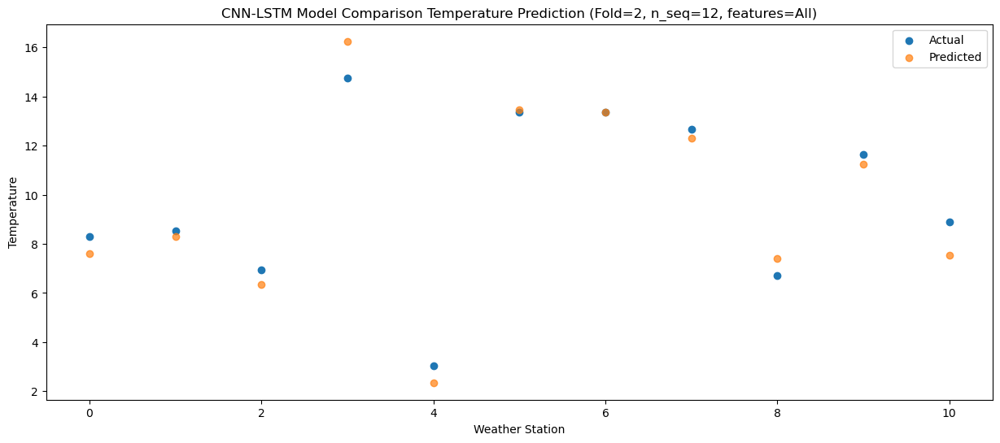

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   4.317185
1                 1    4.49   3.925861
2                 2    9.67   7.341387
3                 3   14.76  15.106614
4                 4    2.29   1.482550
5                 5   11.00  11.323858
6                 6   10.24  10.009092
7                 7   15.60  11.603411
8                 8    5.79   7.604517
9                 9   12.13  10.228320
10               10   10.25   6.108545


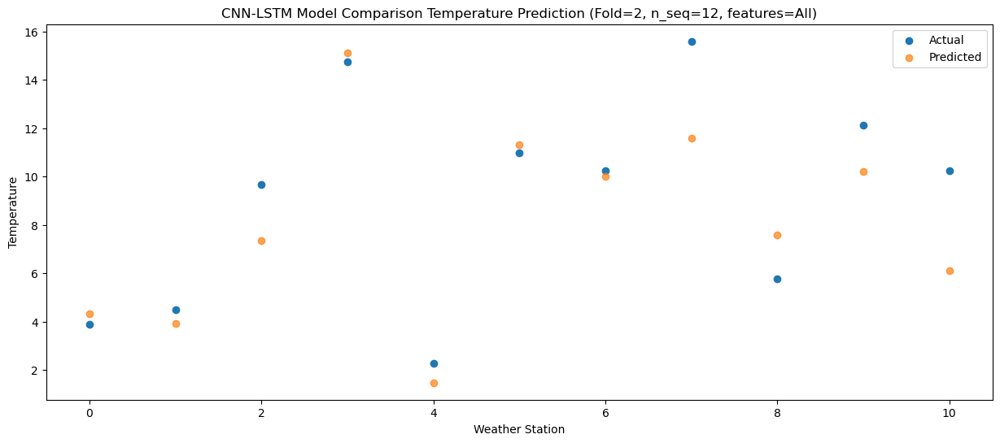

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  17.017865
1                 1   14.68  16.248669
2                 2   11.48  12.145269
3                 3   18.87  23.099826
4                 4    9.62  10.096533
5                 5   19.38  21.771433
6                 6   20.61  22.403070
7                 7   18.70  17.514866
8                 8    5.39  10.834027
9                 9   19.01  19.261907
10               10   16.46  15.912267


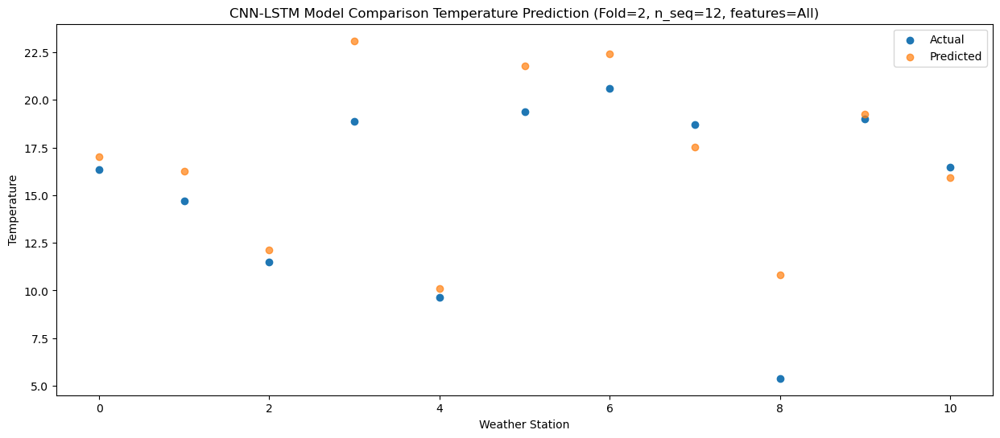

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  19.378450
1                 1   18.44  19.588510
2                 2   13.29  14.297810
3                 3   23.37  27.946061
4                 4   10.49  11.935027
5                 5   21.50  23.671032
6                 6   22.31  24.444610
7                 7   25.36  21.116176
8                 8    9.25  14.928410
9                 9   21.80  21.950344
10               10   18.43  18.827791


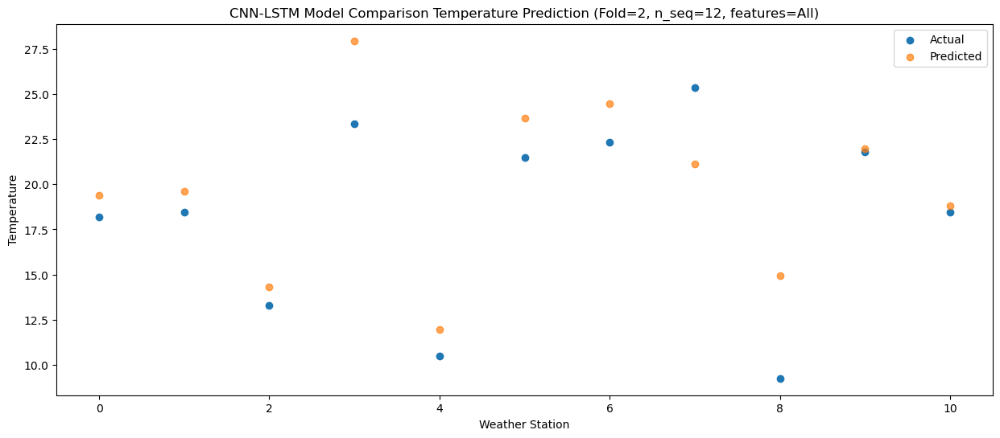

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  23.589114
1                 1   23.62  24.438202
2                 2   16.87  17.952053
3                 3   28.63  32.599932
4                 4   14.96  15.778337
5                 5   25.54  27.663566
6                 6   26.39  28.608749
7                 7   30.37  25.544976
8                 8   11.47  19.309666
9                 9   25.82  25.989254
10               10   23.34  22.983090


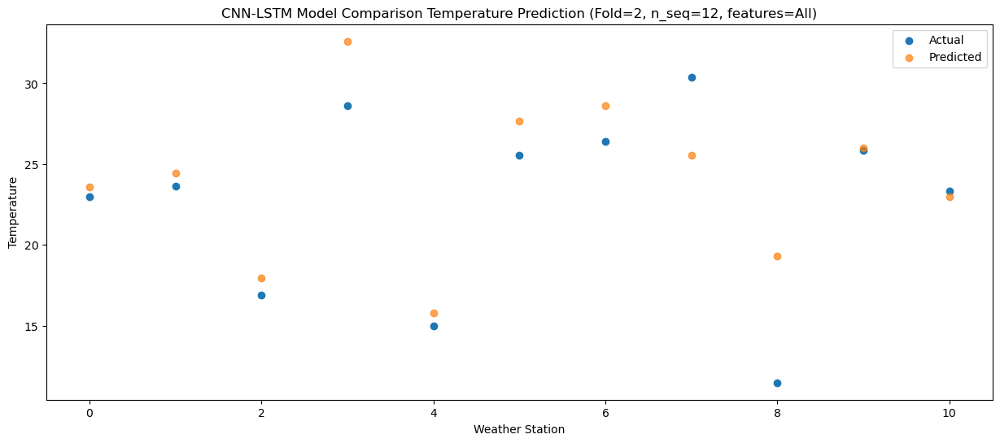

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  29.786084
1                 1   30.87  32.211174
2                 2   18.09  21.359450
3                 3   34.20  39.358922
4                 4   18.44  20.127836
5                 5   30.09  32.839944
6                 6   31.95  34.618607
7                 7   35.36  31.310676
8                 8   15.71  24.920993
9                 9   30.11  31.199825
10               10   28.75  28.617484


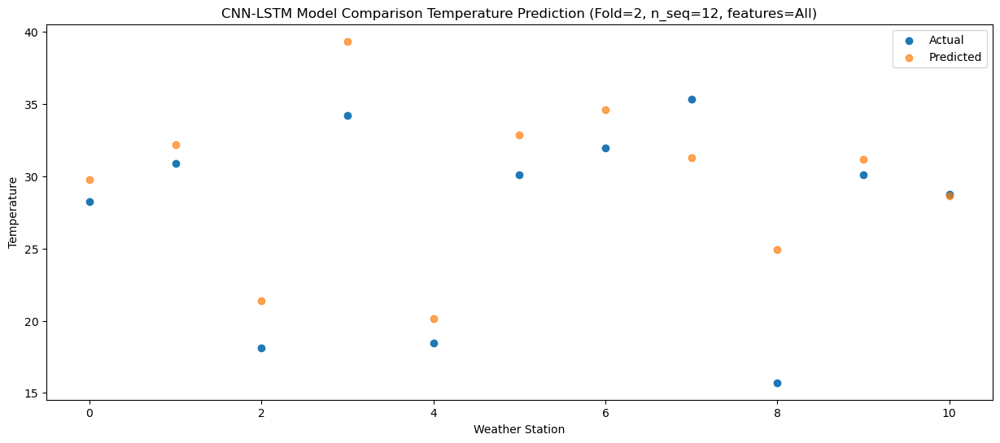

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  31.866848
1                 1   31.56  35.005818
2                 2   18.88  23.637828
3                 3   36.20  41.526084
4                 4   19.03  22.331746
5                 5   30.17  35.100331
6                 6   32.84  36.854697
7                 7   34.16  34.270518
8                 8   18.69  28.192960
9                 9   31.68  33.490958
10               10   30.06  30.817525


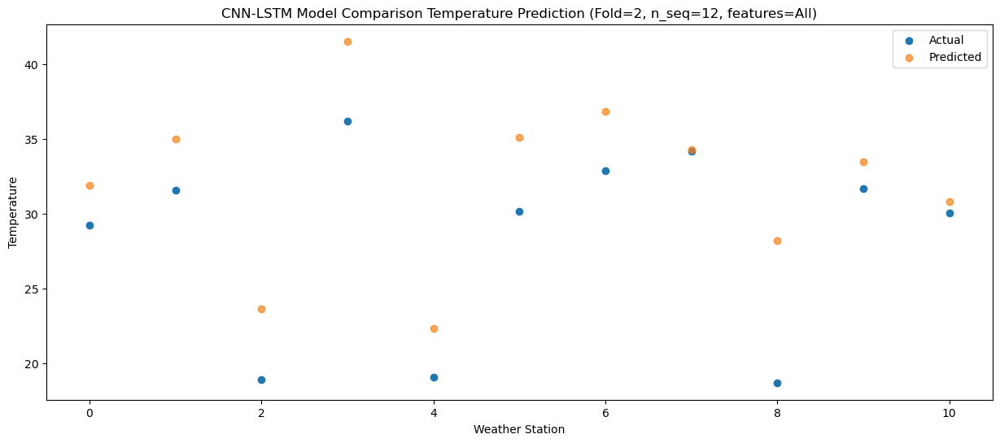

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  32.158346
1                 1   32.32  33.649816
2                 2   18.93  23.826441
3                 3   37.26  41.516015
4                 4   19.20  22.698351
5                 5   31.28  35.282722
6                 6   33.40  36.935294
7                 7   33.64  33.075528
8                 8   18.29  26.387255
9                 9   31.77  33.803934
10               10   30.14  31.178287


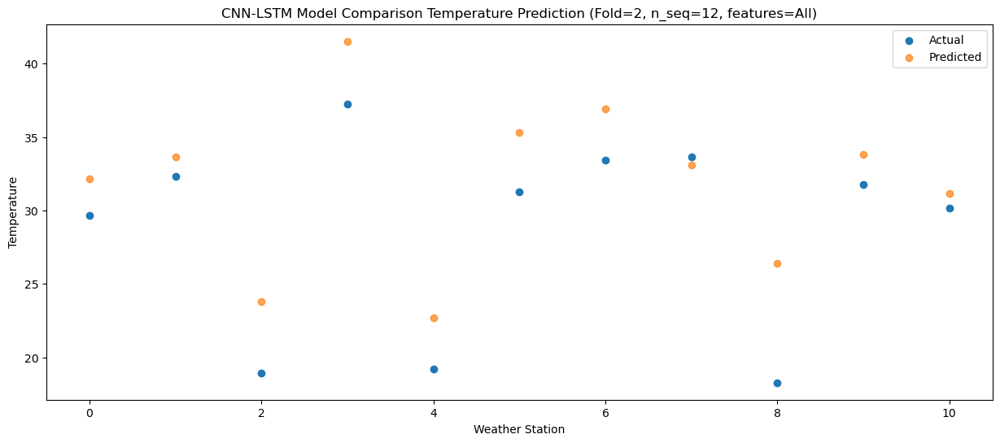

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  29.518578
1                 1   30.08  31.121028
2                 2   17.65  22.011536
3                 3   34.09  37.737042
4                 4   16.66  20.659673
5                 5   28.54  33.157662
6                 6   31.13  34.669181
7                 7   31.46  30.852359
8                 8   16.51  24.304693
9                 9   27.66  31.048016
10               10   25.65  28.227563


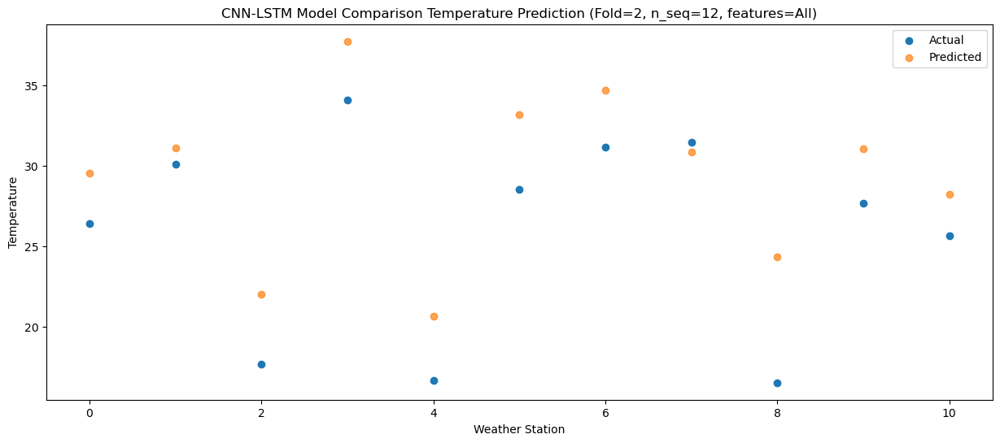

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  24.703369
1                 1   21.82  23.584996
2                 2   16.51  19.012120
3                 3   30.26  33.266046
4                 4   13.92  17.115263
5                 5   25.24  28.766226
6                 6   26.62  29.570683
7                 7   24.90  24.717974
8                 8   11.53  17.734128
9                 9   24.38  27.118588
10               10   21.89  24.204417


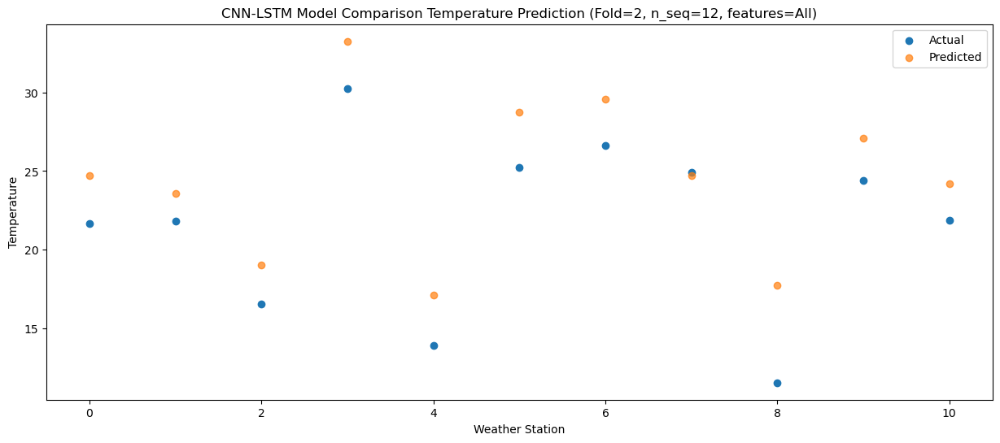

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  15.829113
1                 1   15.11  17.704482
2                 2    9.66  12.499949
3                 3   22.18  24.307278
4                 4    5.65   9.485716
5                 5   17.60  21.114093
6                 6   18.65  21.627223
7                 7   19.50  19.917420
8                 8   10.27  14.505086
9                 9   15.47  18.567866
10               10   11.67  15.207944


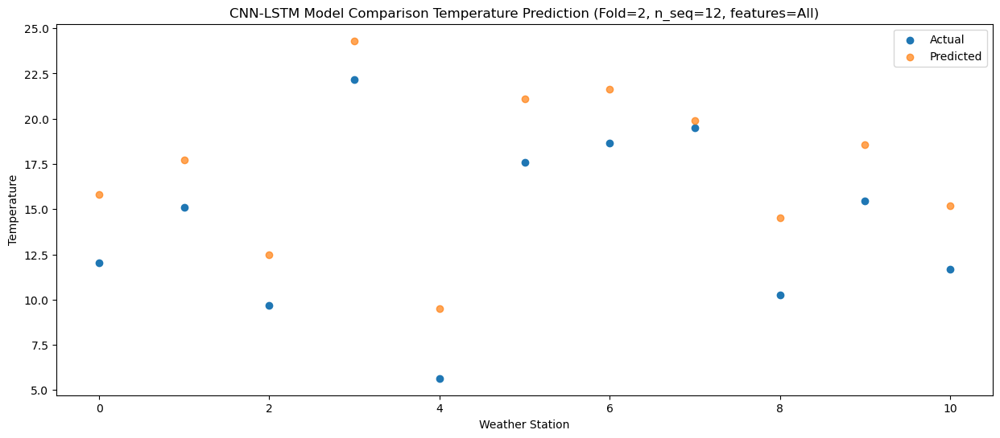

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  18.184306
1                 1   12.72  15.478456
2                 2   10.56  14.608058
3                 3   20.26  23.041234
4                 4    9.06  12.536262
5                 5   20.84  23.870896
6                 6   20.94  23.932013
7                 7   16.15  18.251876
8                 8    3.76  11.113368
9                 9   17.39  20.813753
10               10   13.77  17.262215


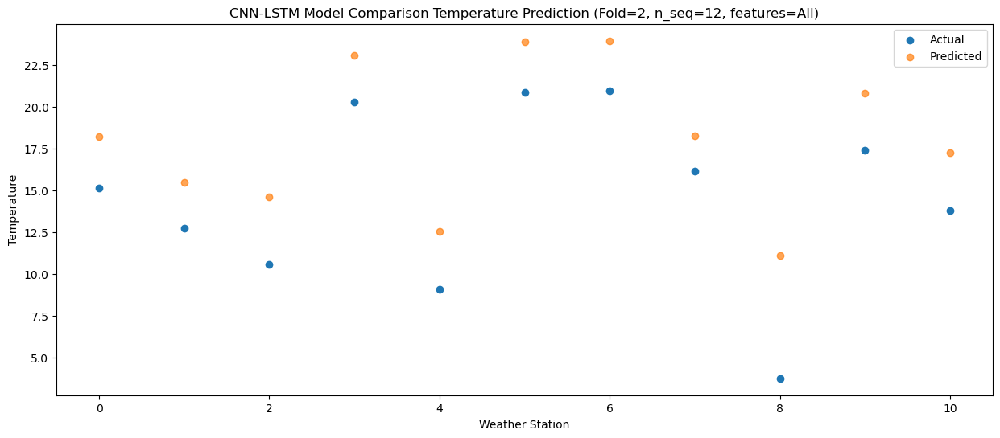

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 7.60473949  8.30975635  6.33109145 16.24969298  2.34837907 13.45235202
  13.35228442 12.29323299  7.40661134 11.24741081  7.55049784]
 [ 4.31718499  3.92586143  7

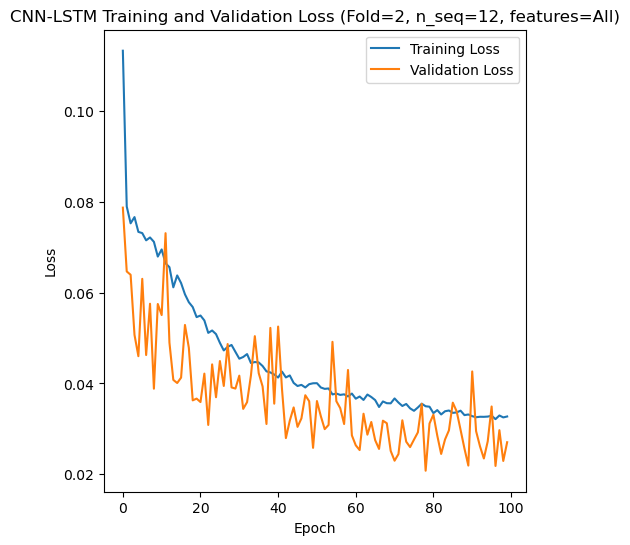

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 52s 303ms/step - loss: 0.1101 - accuracy: 0.7024 - mae: 0.0929 - rmse: 0.1101 - mape: 20.5752 - pearson: 0.7421 - val_loss: 0.1189 - val_accuracy: 0.7000 - val_mae: 0.0959 - val_rmse: 0.1189 - val_mape: 27.5203 - val_pearson: 0.5914
Epoch 2/100
84/84 [==============================] - 18s 213ms/step - loss: 0.0767 - accuracy: 0.7381 - mae: 0.0604 - rmse: 0.0767 - mape: 14.3355 - pearson: 0.8049 - val_loss: 0.0824 - val_accuracy: 0.7000 - val_mae: 0.0645 - val_rmse: 0.0824 - val_mape: 17.3688 - val_pearson: 0.7660
Epoch 3/100
84/84 [==============================] - 20s 233ms/step - loss: 0.0724 - accuracy: 0.7857 - mae: 0.0568 - rmse: 0.0724 - mape: 13.4005 - pearson: 0.8217

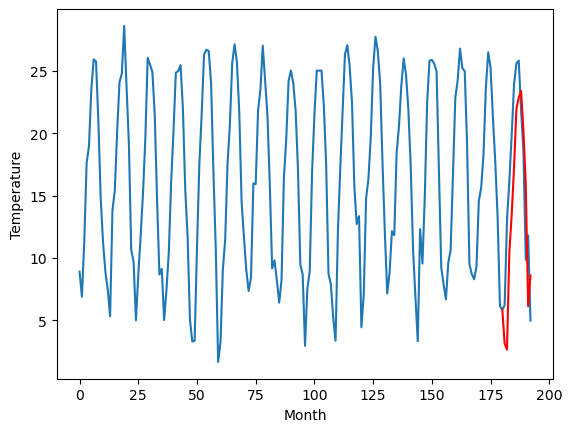

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		8.65		0.90
4.03		4.62		0.59
16.00		17.74		1.74
17.86		20.41		2.55
22.08		24.81		2.73
28.79		31.19		2.40
30.10		31.58		1.48
30.67		32.17		1.50
27.94		29.41		1.47
21.34		23.10		1.76
13.63		13.81		0.18
14.94		15.56		0.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 8.654352852702141, 4.616934010386467, 17.735787579417227, 20.41265363395214, 24.8081824272871, 31.18721837699413, 31.577994713187216, 32.168828257918356, 29.411185750365256, 23.097585210204123, 13.808800229430197, 15.563126215338706]


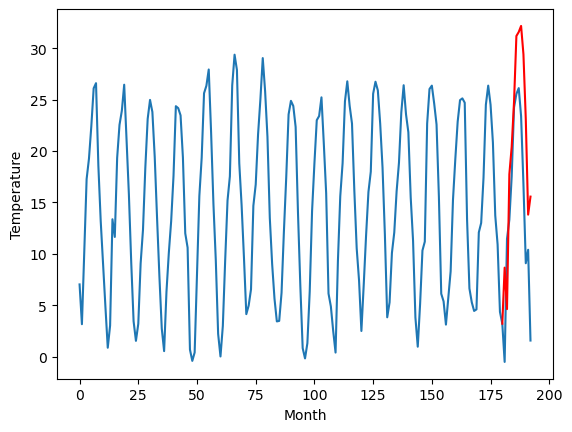

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		7.48		-0.80
10.58		7.45		-3.13
11.73		10.91		-0.82
17.46		15.68		-1.78
22.26		19.87		-2.39
27.11		25.76		-1.35
30.24		27.06		-3.18
28.04		25.92		-2.12
24.73		22.91		-1.82
16.07		16.17		0.10
11.73		11.14		-0.59
7.81		7.23		-0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 7.480313469171524, 7.450540127679705, 10.910307707712054, 15.676625552102923, 19.872612299844622, 25.759378256723284, 27.056246938630938, 25.915681781694293, 22.913083496019244, 16.166215362474322, 11.136957111284136, 7.23061865799129]


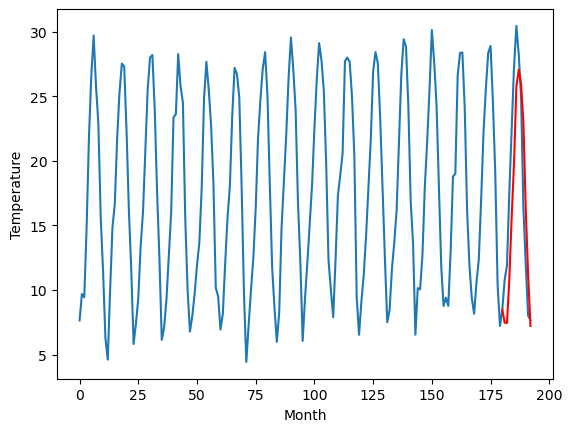

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		7.04		0.85
4.87		5.24		0.37
15.08		15.23		0.15
17.43		18.68		1.25
21.50		22.78		1.28
27.42		28.65		1.23
28.41		29.27		0.86
28.93		30.00		1.07
24.80		26.56		1.76
21.22		21.76		0.54
11.56		11.17		-0.39
13.05		13.10		0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 7.039242827892304, 5.240995252132416, 15.23292716741562, 18.677932107448576, 22.778115594387053, 28.64705785512924, 29.274649882316588, 29.997286760807036, 26.564964735507964, 21.756946051120757, 11.167574369907378, 13.10159214735031]


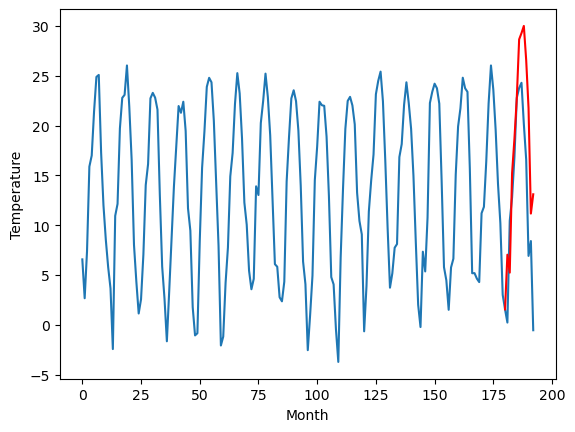

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.95		0.85
1.23		1.67		0.44
14.31		15.26		0.95
17.60		18.50		0.90
22.17		23.04		0.87
29.65		30.06		0.41
29.65		30.25		0.60
29.77		30.87		1.10
26.41		27.78		1.37
20.99		21.52		0.53
11.25		11.53		0.28
10.89		12.32		1.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 5.945318050384522, 1.6735461425781253, 15.25986988067627, 18.501560516357422, 23.043398685455323, 30.063335247039795, 30.24971783876419, 30.865502424240113, 27.775053806304932, 21.519480056762696, 11.530664749145508, 12.321600801944733]


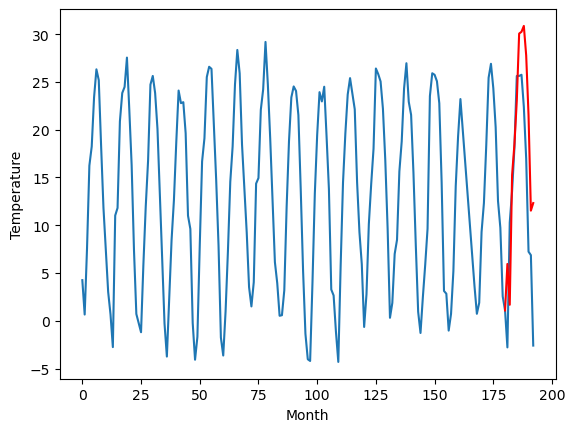

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		3.46		0.66
0.08		0.11		0.03
11.41		12.47		1.06
14.86		15.86		1.00
19.14		20.20		1.06
25.85		26.84		0.99
26.23		27.12		0.89
26.55		27.91		1.36
23.29		24.60		1.31
18.71		19.13		0.42
7.86		8.47		0.61
8.91		9.95		1.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 3.457157254219055, 0.10914075374603271, 12.468748450279236, 15.859345078468323, 20.19862949848175, 26.837266087532043, 27.121799647808075, 27.909346520900726, 24.59760731458664, 19.12631005048752, 8.466203391551971, 9.94958382844925]


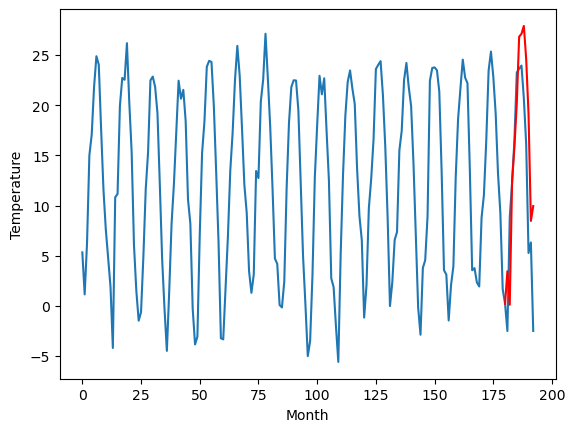

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		5.63		0.03
5.70		4.51		-1.19
8.67		10.66		1.99
13.45		15.05		1.60
18.50		19.50		1.00
25.89		25.70		-0.19
27.73		26.83		-0.90
25.81		26.09		0.28
23.94		23.13		-0.81
15.97		16.23		0.26
13.23		10.16		-3.07
8.47		7.36		-1.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 5.625629590749741, 4.511272238492966, 10.655311869382858, 15.052202986478806, 19.50371007800102, 25.701463507413862, 26.83008925795555, 26.088101552724837, 23.133356975317, 16.22891371130943, 10.164086269140242, 7.359546827077864]


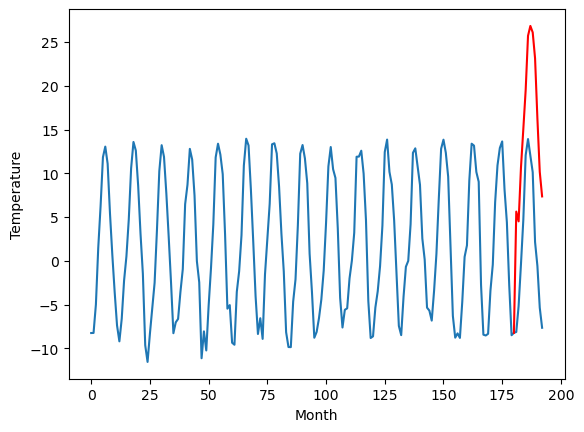

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-7.81		-0.12
-4.84		-8.31		-3.47
-3.24		-3.93		-0.69
4.73		0.88		-3.85
9.16		5.25		-3.91
16.80		11.48		-5.32
17.88		12.75		-5.13
16.65		11.58		-5.07
12.68		8.62		-4.06
2.33		1.51		-0.82
-0.19		-3.60		-3.41
-7.46		-7.67		-0.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -7.805409362316132, -8.305380573272705, -3.9341270828247072, 0.8847119903564451, 5.251570472717285, 11.484574565887451, 12.7521236038208, 11.583463559150696, 8.615535864830017, 1.5069772100448606, -3.601034989356995, -7.671256890296936]


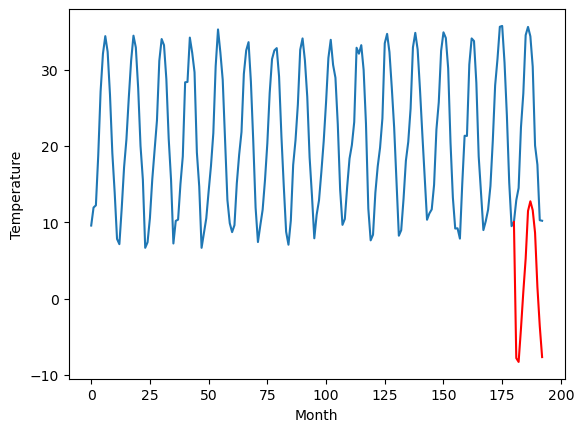

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.17		-0.62
11.72		10.57		-1.15
11.50		13.29		1.79
13.69		17.75		4.06
17.98		21.71		3.73
19.68		26.94		7.26
18.86		28.12		9.26
19.41		27.08		7.67
18.86		24.36		5.50
16.10		18.09		1.99
13.28		13.26		-0.02
9.58		9.90		0.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 10.170423693656922, 10.571341223716736, 13.291819519996643, 17.745277829170227, 21.708517498970032, 26.938695378303528, 28.1245734167099, 27.08036560535431, 24.35812086582184, 18.09249825000763, 13.25725073337555, 9.900853581428528]


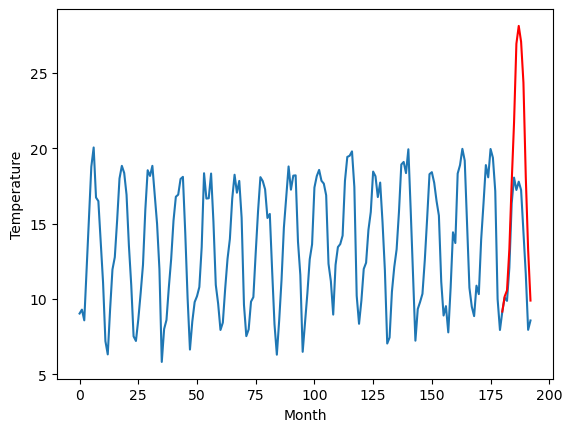

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.84		1.82
5.90		7.18		1.28
10.90		14.13		3.23
15.52		19.12		3.60
20.35		23.57		3.22
26.22		29.76		3.54
28.36		30.30		1.94
28.98		30.88		1.90
25.66		27.21		1.55
21.22		22.47		1.25
12.30		12.65		0.35
10.70		11.65		0.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 7.841261782646178, 7.179315605163573, 14.12875274658203, 19.121879138946532, 23.569355525970458, 29.76326326370239, 30.296350219249724, 30.875783898830413, 27.21282074689865, 22.468074061870574, 12.651806094646453, 11.650339701175689]


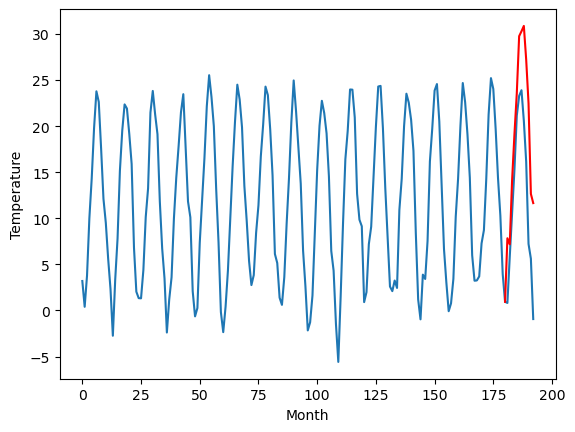

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		2.08		0.44
0.84		1.04		0.20
8.03		9.14		1.11
12.90		13.71		0.81
17.16		18.05		0.89
23.33		24.21		0.88
24.97		24.76		-0.21
24.70		25.47		0.77
20.44		21.81		1.37
16.32		17.15		0.83
6.10		6.75		0.65
5.69		6.79		1.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 2.075731706619263, 1.0448646068573, 9.135436010360717, 13.71064896583557, 18.052701425552367, 24.212722730636596, 24.75806440114975, 25.465497028827667, 21.805962812900543, 17.154239904880523, 6.754554998874664, 6.786568530648946]


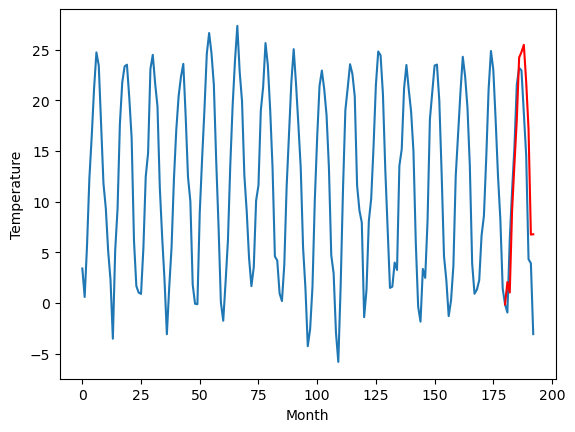

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   3.125142
1                 1    7.75   8.654353
2                 2    8.28   7.480313
3                 3    6.19   7.039243
4                 4    5.10   5.945318
5                 5    2.80   3.457157
6                 6    5.60   5.625630
7                 7   -7.69  -7.805409
8                 8   10.79  10.170424
9                 9    6.02   7.841262
10               10    1.64   2.075732


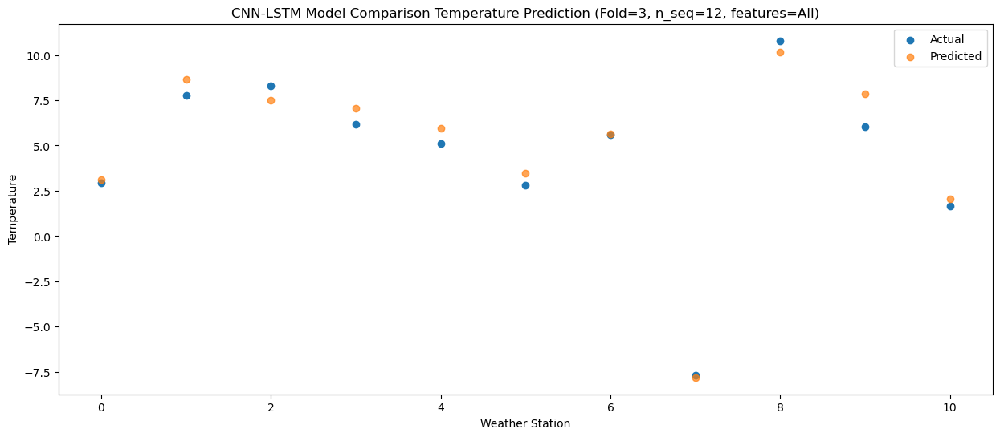

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   2.646144
1                 1    4.03   4.616934
2                 2   10.58   7.450540
3                 3    4.87   5.240995
4                 4    1.23   1.673546
5                 5    0.08   0.109141
6                 6    5.70   4.511272
7                 7   -4.84  -8.305381
8                 8   11.72  10.571341
9                 9    5.90   7.179316
10               10    0.84   1.044865


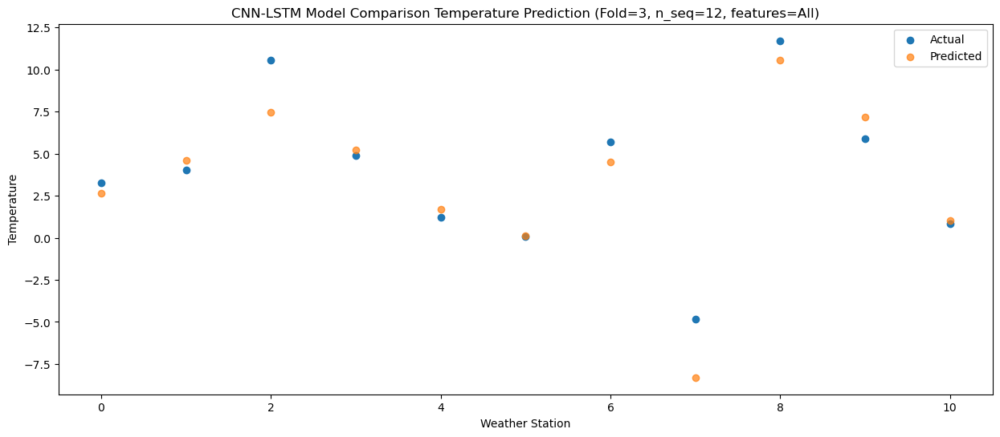

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09  10.447096
1                 1   16.00  17.735788
2                 2   11.73  10.910308
3                 3   15.08  15.232927
4                 4   14.31  15.259870
5                 5   11.41  12.468748
6                 6    8.67  10.655312
7                 7   -3.24  -3.934127
8                 8   11.50  13.291820
9                 9   10.90  14.128753
10               10    8.03   9.135436


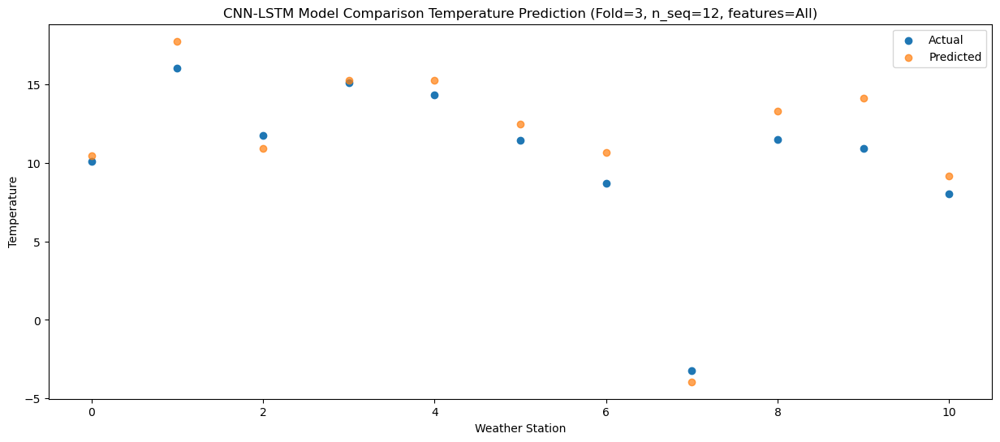

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  13.471241
1                 1   17.86  20.412654
2                 2   17.46  15.676626
3                 3   17.43  18.677932
4                 4   17.60  18.501561
5                 5   14.86  15.859345
6                 6   13.45  15.052203
7                 7    4.73   0.884712
8                 8   13.69  17.745278
9                 9   15.52  19.121879
10               10   12.90  13.710649


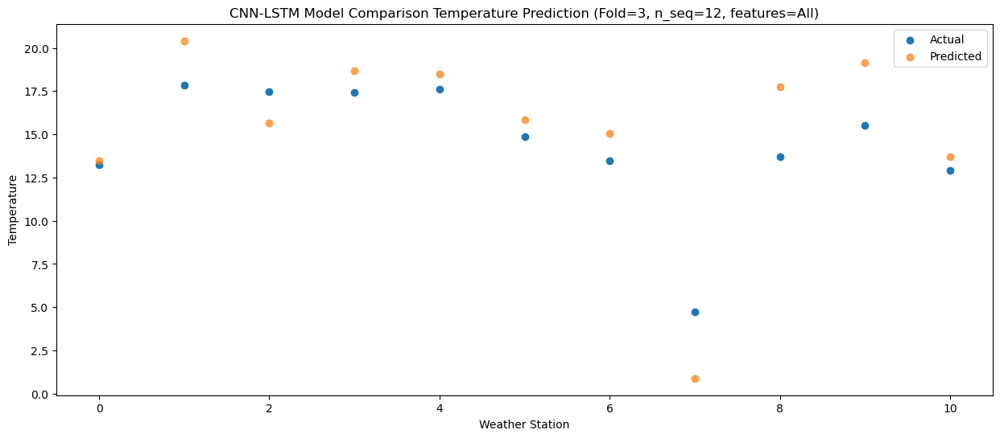

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  17.257727
1                 1   22.08  24.808182
2                 2   22.26  19.872612
3                 3   21.50  22.778116
4                 4   22.17  23.043399
5                 5   19.14  20.198629
6                 6   18.50  19.503710
7                 7    9.16   5.251570
8                 8   17.98  21.708517
9                 9   20.35  23.569356
10               10   17.16  18.052701


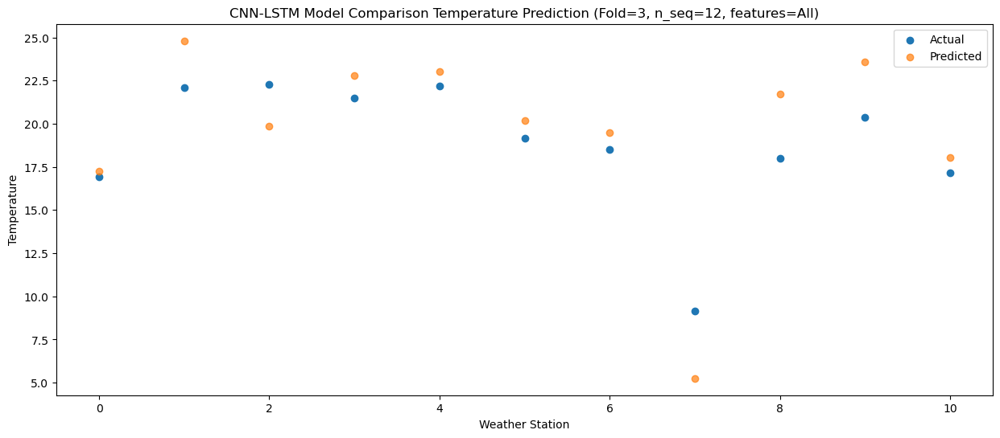

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  21.952904
1                 1   28.79  31.187218
2                 2   27.11  25.759378
3                 3   27.42  28.647058
4                 4   29.65  30.063335
5                 5   25.85  26.837266
6                 6   25.89  25.701464
7                 7   16.80  11.484575
8                 8   19.68  26.938695
9                 9   26.22  29.763263
10               10   23.33  24.212723


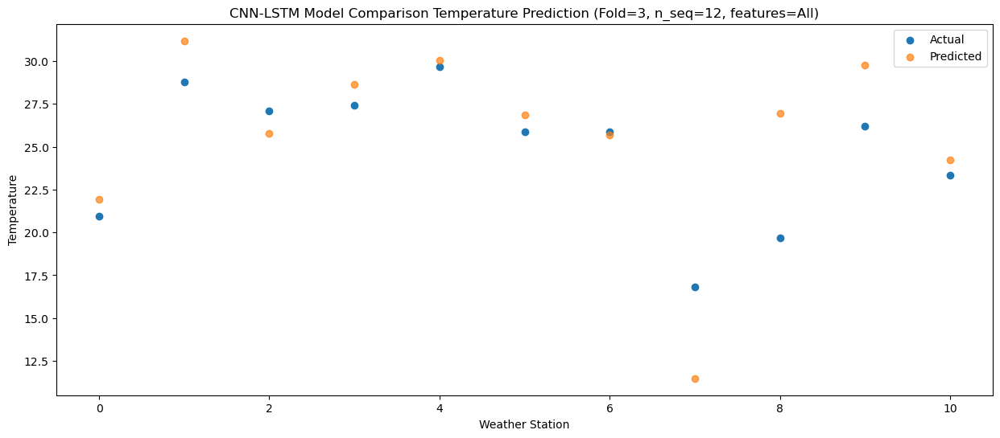

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  22.871924
1                 1   30.10  31.577995
2                 2   30.24  27.056247
3                 3   28.41  29.274650
4                 4   29.65  30.249718
5                 5   26.23  27.121800
6                 6   27.73  26.830089
7                 7   17.88  12.752124
8                 8   18.86  28.124573
9                 9   28.36  30.296350
10               10   24.97  24.758064


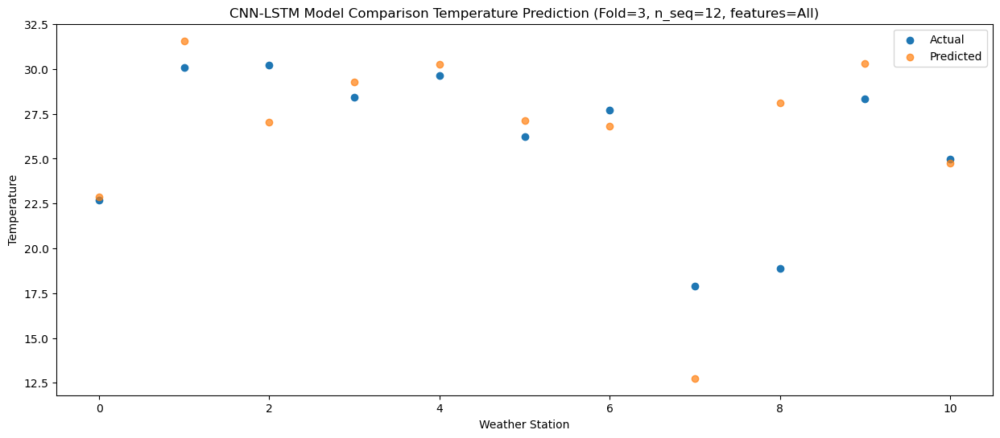

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  23.393586
1                 1   30.67  32.168828
2                 2   28.04  25.915682
3                 3   28.93  29.997287
4                 4   29.77  30.865502
5                 5   26.55  27.909347
6                 6   25.81  26.088102
7                 7   16.65  11.583464
8                 8   19.41  27.080366
9                 9   28.98  30.875784
10               10   24.70  25.465497


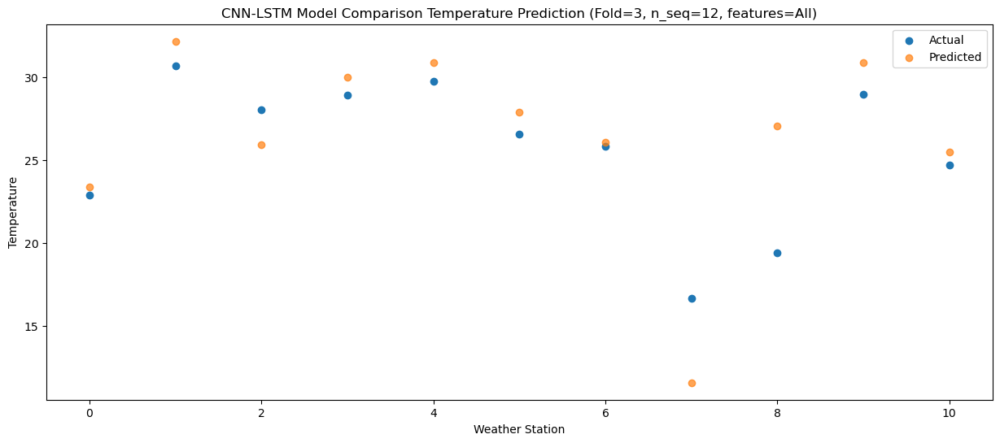

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  20.231716
1                 1   27.94  29.411186
2                 2   24.73  22.913083
3                 3   24.80  26.564965
4                 4   26.41  27.775054
5                 5   23.29  24.597607
6                 6   23.94  23.133357
7                 7   12.68   8.615536
8                 8   18.86  24.358121
9                 9   25.66  27.212821
10               10   20.44  21.805963


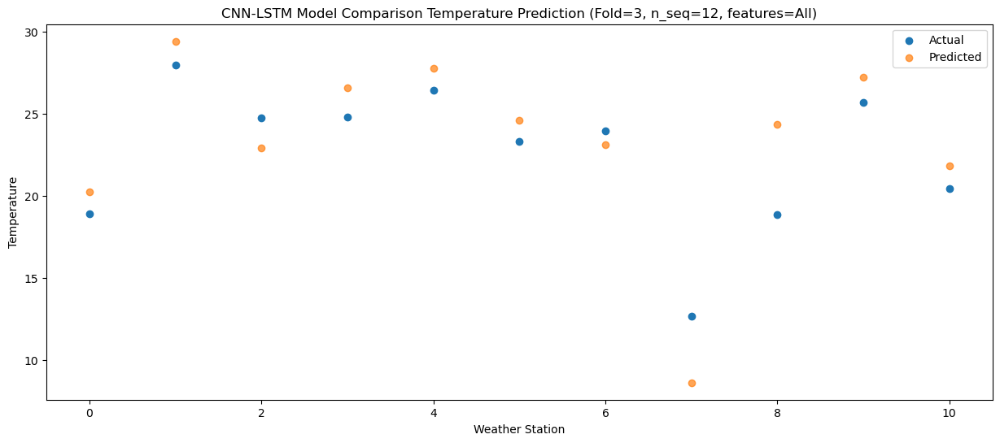

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68  15.831441
1                 1   21.34  23.097585
2                 2   16.07  16.166215
3                 3   21.22  21.756946
4                 4   20.99  21.519480
5                 5   18.71  19.126310
6                 6   15.97  16.228914
7                 7    2.33   1.506977
8                 8   16.10  18.092498
9                 9   21.22  22.468074
10               10   16.32  17.154240


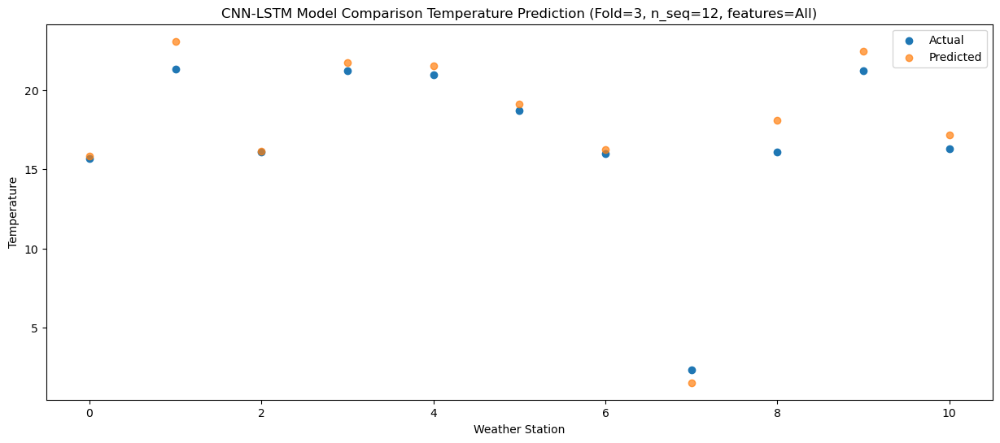

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   6.128952
1                 1   13.63  13.808800
2                 2   11.73  11.136957
3                 3   11.56  11.167574
4                 4   11.25  11.530665
5                 5    7.86   8.466203
6                 6   13.23  10.164086
7                 7   -0.19  -3.601035
8                 8   13.28  13.257251
9                 9   12.30  12.651806
10               10    6.10   6.754555


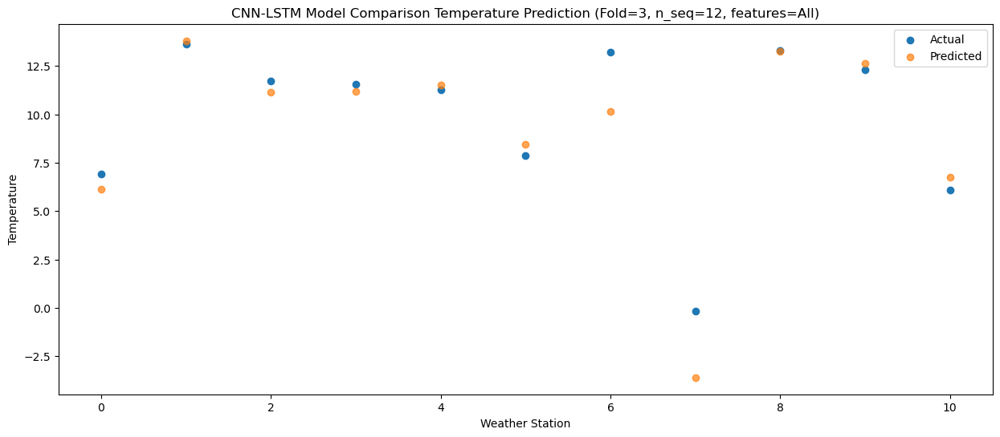

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   8.592477
1                 1   14.94  15.563126
2                 2    7.81   7.230619
3                 3   13.05  13.101592
4                 4   10.89  12.321601
5                 5    8.91   9.949584
6                 6    8.47   7.359547
7                 7   -7.46  -7.671257
8                 8    9.58   9.900854
9                 9   10.70  11.650340
10               10    5.69   6.786569


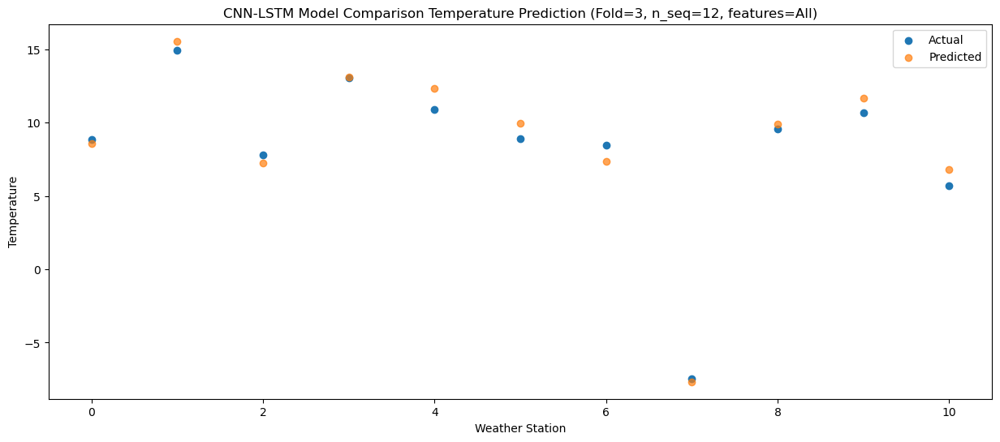

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[ 3.12514236  8.65435285  7.48031347  7.03924283  5.94531805  3.45715725
   5.62562959 -7.80540936 10.17042369  7.84126178  2.07573171]
 [ 2.64614417  4.61693401  7

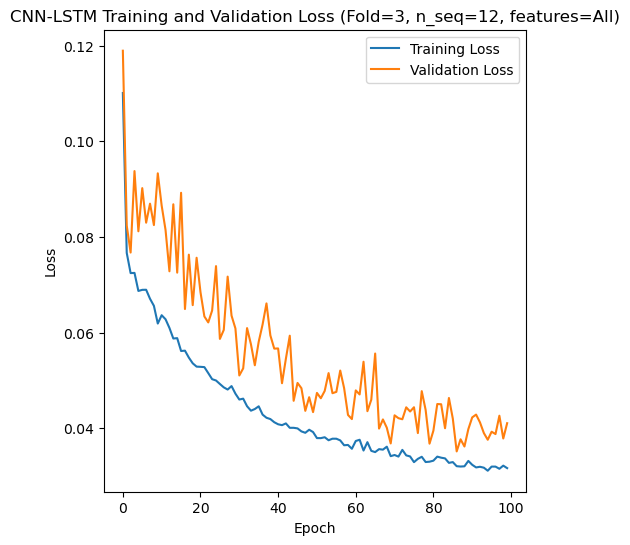

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 55s 348ms/step - loss: 0.1051 - accuracy: 0.6190 - mae: 0.0876 - rmse: 0.1051 - mape: 18.5415 - pearson: 0.7235 - val_loss: 0.0840 - val_accuracy: 0.7000 - val_mae: 0.0671 - val_rmse: 0.0840 - val_mape: 16.4075 - val_pearson: 0.8046
Epoch 2/100
84/84 [==============================] - 19s 226ms/step - loss: 0.0758 - accuracy: 0.6905 - mae: 0.0594 - rmse: 0.0758 - mape: 13.2346 - pearson: 0.7789 - val_loss: 0.0832 - val_accuracy: 0.7000 - val_mae: 0.0665 - val_rmse: 0.0832 - val_mape: 15.5162 - val_pearson: 0.7817
Epoch 3/100
84/84 [==============================] - 20s 236ms/step - loss: 0.0743 - accuracy: 0.6429 - mae: 0.0582 - rmse: 0.0743 - mape: 12.8845 - pearson: 0.7861

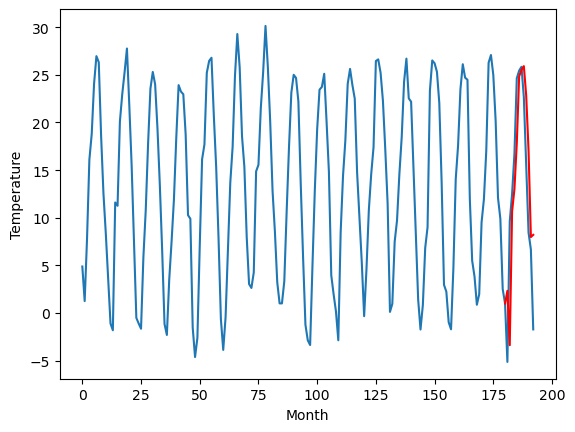

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		5.18		-0.41
9.02		7.76		-1.26
10.62		9.92		-0.70
12.06		11.61		-0.45
16.10		14.50		-1.60
17.73		16.12		-1.61
18.10		17.30		-0.80
18.38		17.81		-0.57
17.09		15.46		-1.63
15.25		13.27		-1.98
8.09		6.78		-1.31
9.89		9.53		-0.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 5.175376340150833, 7.757252618074417, 9.915734454393387, 11.606823965311051, 14.499669357538224, 16.12110917210579, 17.300044938325883, 17.80620633006096, 15.457642658948899, 13.266381605863572, 6.781647070646287, 9.532265290021897]


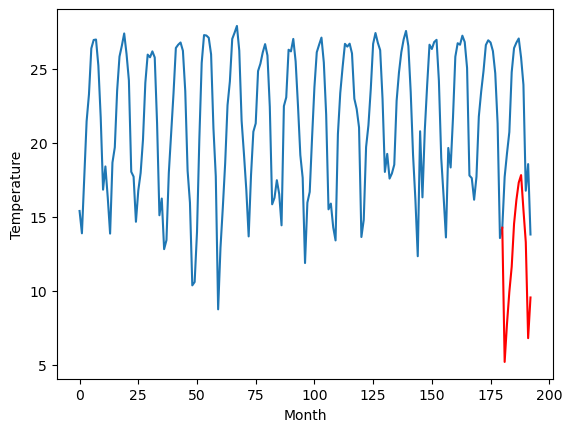

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		14.91		-0.50
13.49		13.86		0.37
22.82		22.24		-0.58
23.89		23.38		-0.51
28.36		26.82		-1.54
32.62		30.08		-2.54
33.28		30.90		-2.38
33.93		31.77		-2.16
30.81		29.19		-1.62
27.42		26.31		-1.11
18.75		17.69		-1.06
22.26		22.12		-0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 14.909888063669205, 13.857941185235978, 22.243931328058245, 23.376820479631427, 26.818235789537432, 30.0806428539753, 30.902496193647387, 31.77052173495293, 29.191492651700976, 26.312390421628955, 17.69467840075493, 22.115329836606982]


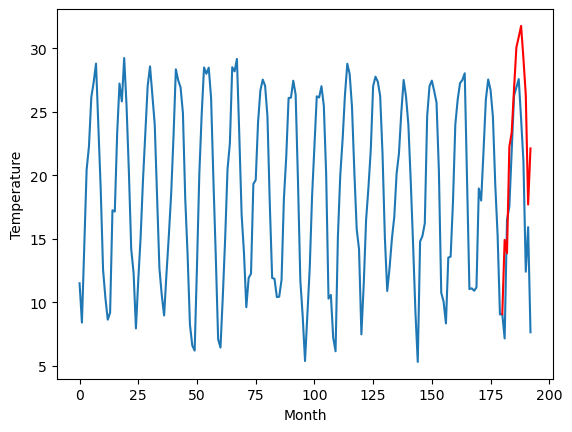

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.94		0.37
7.11		7.69		0.58
18.07		18.66		0.59
19.76		19.94		0.18
23.92		23.85		-0.07
29.60		28.48		-1.12
31.19		29.26		-1.93
31.56		29.97		-1.59
28.77		27.54		-1.23
24.12		23.25		-0.87
16.12		14.91		-1.21
18.12		18.11		-0.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 10.942872276306153, 7.694123020172119, 18.66327642440796, 19.93646763801575, 23.85218023300171, 28.47779582977295, 29.260941197872164, 29.97213714361191, 27.54489677190781, 23.250105550289156, 14.906968762874605, 18.105628421306612]


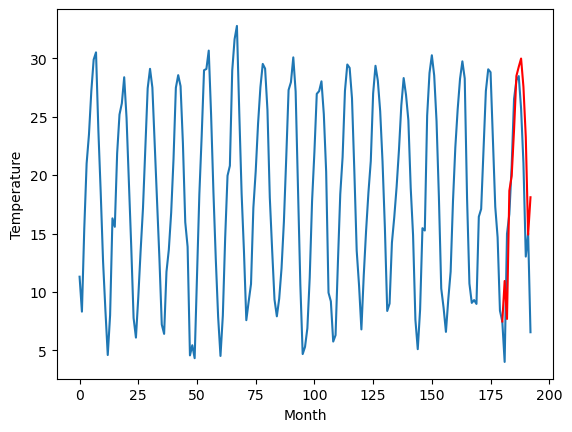

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.77		0.06
6.82		7.41		0.59
17.74		18.38		0.64
19.92		19.77		-0.15
23.45		23.79		0.34
30.30		28.59		-1.71
31.79		29.43		-2.36
32.16		30.06		-2.10
28.73		27.64		-1.09
23.86		23.10		-0.76
16.02		14.94		-1.08
17.76		17.72		-0.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.770417866706849, 7.410688338279725, 18.38341229915619, 19.773789224624636, 23.78625517845154, 28.588059244155886, 29.426059422492983, 30.06419342517853, 27.639528450965884, 23.09993332386017, 14.937504467964175, 17.723948416709902]


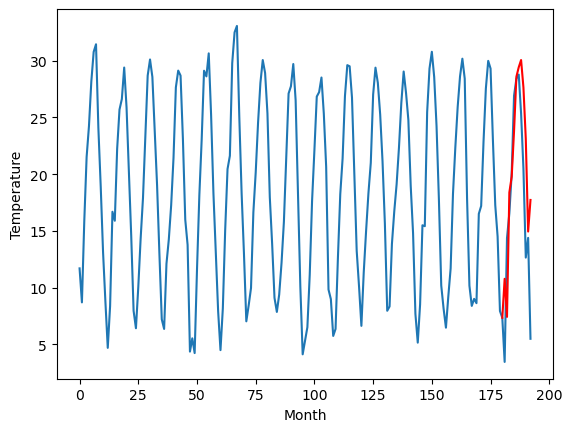

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		11.49		0.90
9.02		9.91		0.89
18.27		17.58		-0.69
20.50		19.69		-0.81
25.99		23.66		-2.33
30.95		28.08		-2.87
30.69		29.33		-1.36
31.01		29.60		-1.41
30.32		27.24		-3.08
24.62		22.44		-2.18
17.68		15.64		-2.04
18.09		16.87		-1.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 11.493648173809051, 9.90865028142929, 17.578026654720304, 19.690193059444425, 23.656602742671964, 28.0847519659996, 29.325861456394193, 29.602994652986524, 27.239097567796705, 22.444406481981275, 15.641246291399, 16.872815700769422]


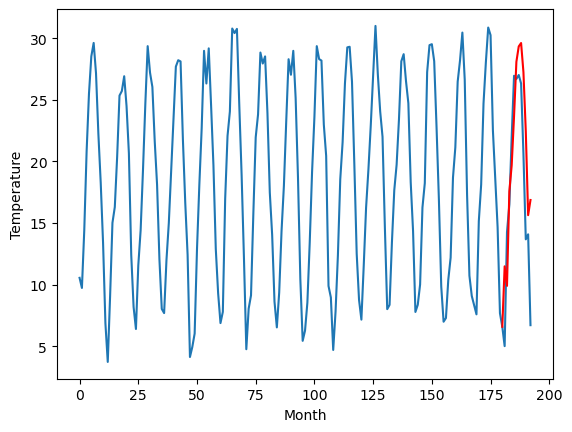

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.86		-0.93
11.46		10.21		-1.25
17.86		16.62		-1.24
20.59		18.48		-2.11
24.04		21.91		-2.13
28.06		25.12		-2.94
29.80		26.19		-3.61
29.93		26.94		-2.99
25.96		23.99		-1.97
22.16		21.30		-0.86
14.00		12.59		-1.41
15.91		16.04		0.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 9.863155601024628, 10.21436127781868, 16.615039912462237, 18.48212572693825, 21.91209956765175, 25.11745616555214, 26.192247000932696, 26.941213039159777, 23.99357762694359, 21.300694612264635, 12.591187623739245, 16.042823938131335]


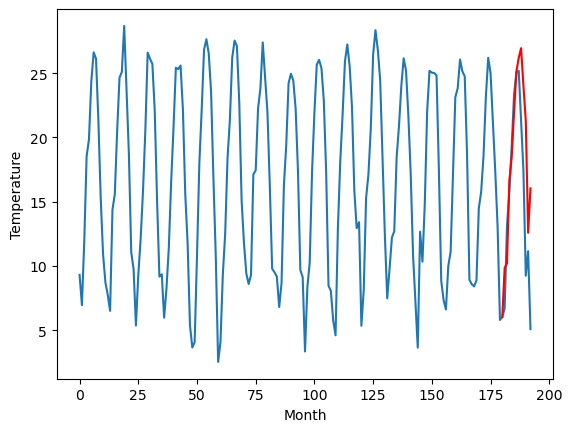

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.40		0.75
4.04		4.85		0.81
16.31		16.45		0.14
18.21		18.08		-0.13
22.25		22.16		-0.09
28.55		27.32		-1.23
29.84		28.04		-1.80
30.36		28.76		-1.60
27.32		25.99		-1.33
21.55		21.68		0.13
13.61		12.64		-0.97
15.07		15.46		0.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 8.395111448764801, 4.847359545230866, 16.452331430912018, 18.079757936000824, 22.16253877401352, 27.316062219142914, 28.044129021167755, 28.762634105682373, 25.993612594604492, 21.676640815734864, 12.638347930908203, 15.461478776931763]


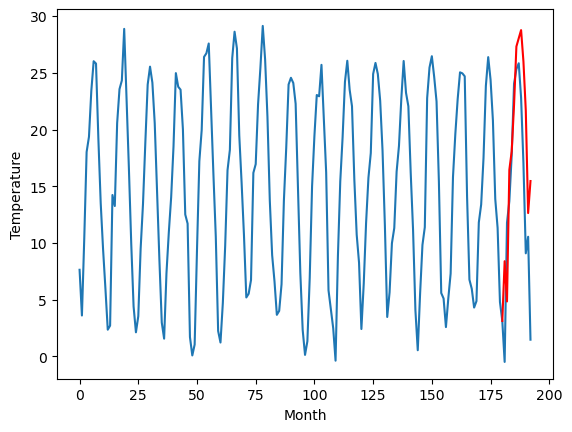

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		5.81		-0.25
2.70		2.47		-0.23
14.67		13.82		-0.85
18.32		16.63		-1.69
22.73		20.97		-1.76
29.97		26.95		-3.02
30.54		27.47		-3.07
31.40		28.30		-3.10
27.91		24.67		-3.24
22.56		20.75		-1.81
11.70		10.23		-1.47
12.02		11.77		-0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 5.809016718864441, 2.4688913965225217, 13.81787230014801, 16.625066294670106, 20.968040957450867, 26.946010127067566, 27.470612123012543, 28.299180104732514, 24.671618297100068, 20.752999618053437, 10.232720687389374, 11.76932151556015]


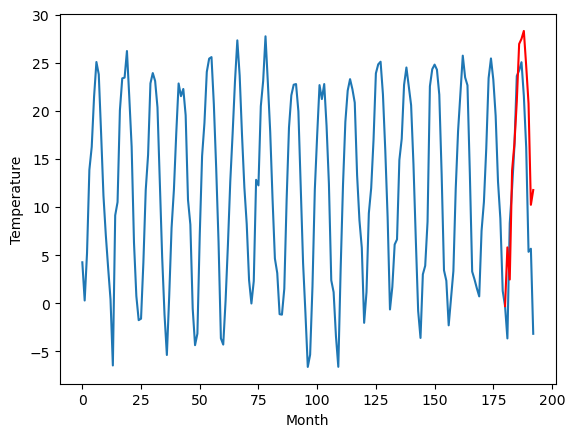

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.53		0.30
-2.21		-2.43		-0.22
11.65		10.97		-0.68
15.36		13.63		-1.73
20.14		18.27		-1.87
27.53		25.02		-2.51
27.24		25.44		-1.80
27.52		26.13		-1.39
24.41		22.63		-1.78
18.95		17.88		-1.07
8.64		7.60		-1.04
8.39		8.44		0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 2.52643431186676, -2.4281474256515505, 10.967522511482239, 13.625619778633117, 18.27477539539337, 25.022448906898497, 25.442252585887907, 26.126136848926542, 22.62870127916336, 17.883471081256864, 7.601666042804716, 8.441235969066618]


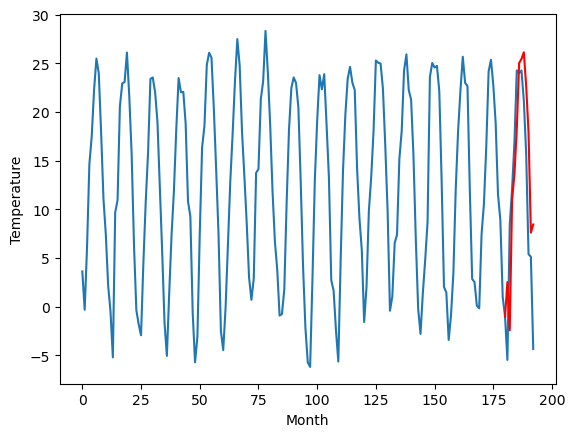

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.49		-0.21
-0.54		-0.74		-0.20
9.35		8.80		-0.55
13.15		12.24		-0.91
17.68		16.59		-1.09
24.57		22.46		-2.11
24.73		23.06		-1.67
25.93		23.95		-1.98
21.64		19.99		-1.65
18.11		16.46		-1.65
7.71		5.86		-1.85
6.85		6.71		-0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 1.494159097671509, -0.7382029342651366, 8.797148818969728, 12.241426820755006, 16.587056035995484, 22.464831705093385, 23.060084099769593, 23.9476686668396, 19.990575428009034, 16.463531370162965, 5.856818075180055, 6.707554812431336]


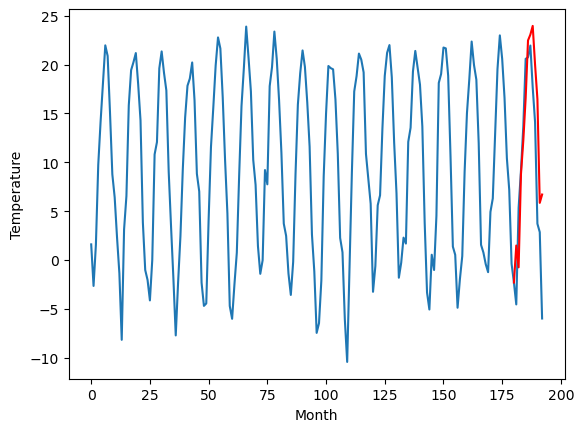

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.339100
1                 1    5.59   5.175376
2                 2   15.41  14.909888
3                 3   10.57  10.942872
4                 4   10.71  10.770418
5                 5   10.59  11.493648
6                 6   10.79   9.863156
7                 7    7.65   8.395111
8                 8    6.06   5.809017
9                 9    2.23   2.526434
10               10    1.70   1.494159


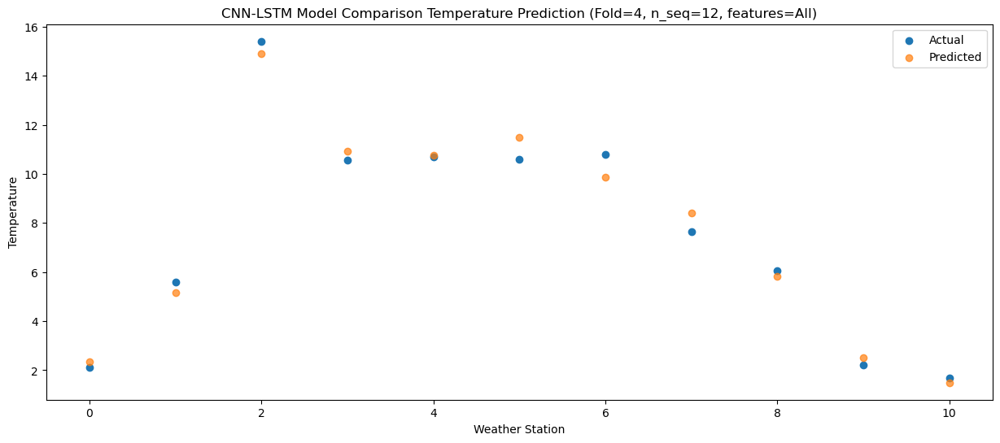

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -3.366207
1                 1    9.02   7.757253
2                 2   13.49  13.857941
3                 3    7.11   7.694123
4                 4    6.82   7.410688
5                 5    9.02   9.908650
6                 6   11.46  10.214361
7                 7    4.04   4.847360
8                 8    2.70   2.468891
9                 9   -2.21  -2.428147
10               10   -0.54  -0.738203


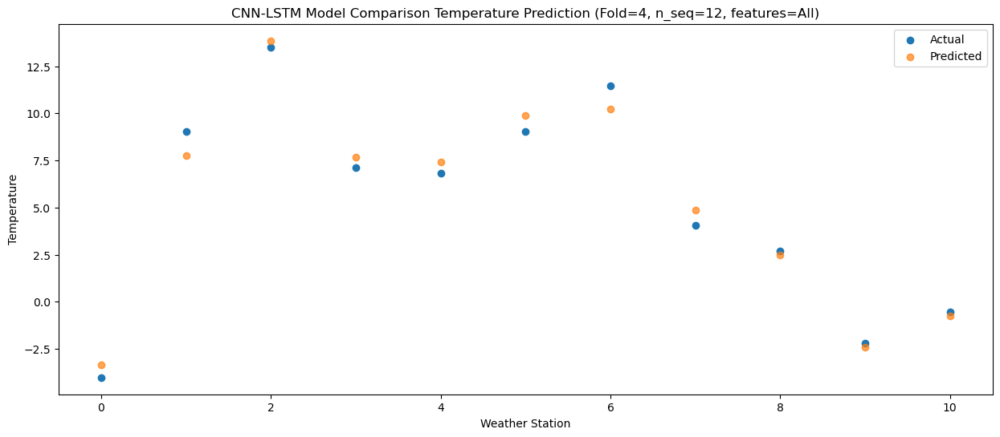

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  10.672357
1                 1   10.62   9.915734
2                 2   22.82  22.243931
3                 3   18.07  18.663276
4                 4   17.74  18.383412
5                 5   18.27  17.578027
6                 6   17.86  16.615040
7                 7   16.31  16.452331
8                 8   14.67  13.817872
9                 9   11.65  10.967523
10               10    9.35   8.797149


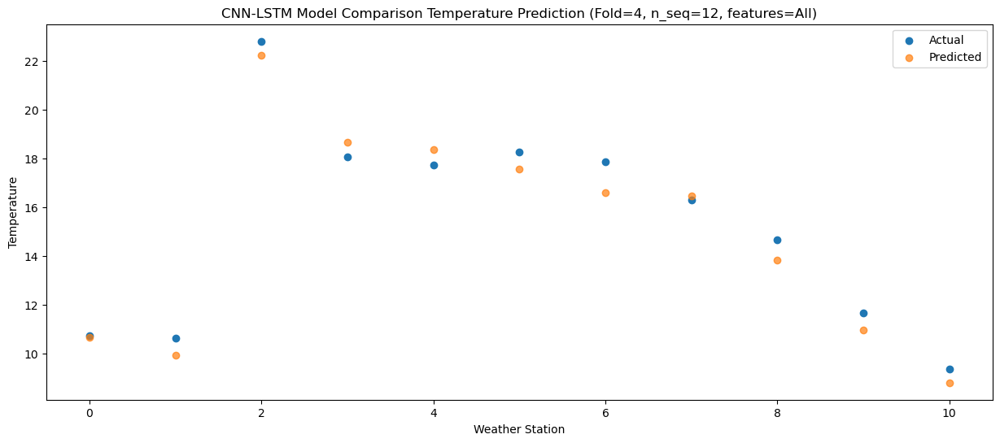

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.027981
1                 1   12.06  11.606824
2                 2   23.89  23.376820
3                 3   19.76  19.936468
4                 4   19.92  19.773789
5                 5   20.50  19.690193
6                 6   20.59  18.482126
7                 7   18.21  18.079758
8                 8   18.32  16.625066
9                 9   15.36  13.625620
10               10   13.15  12.241427


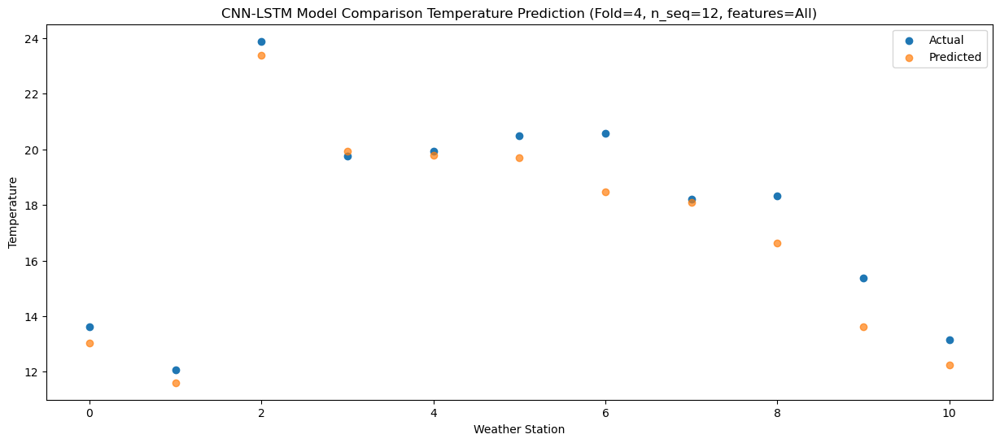

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  17.838535
1                 1   16.10  14.499669
2                 2   28.36  26.818236
3                 3   23.92  23.852180
4                 4   23.45  23.786255
5                 5   25.99  23.656603
6                 6   24.04  21.912100
7                 7   22.25  22.162539
8                 8   22.73  20.968041
9                 9   20.14  18.274775
10               10   17.68  16.587056


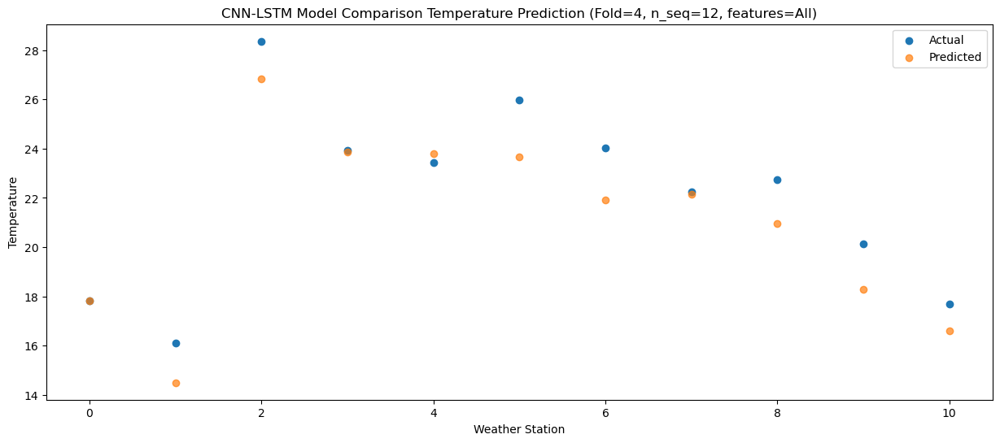

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  24.838627
1                 1   17.73  16.121109
2                 2   32.62  30.080643
3                 3   29.60  28.477796
4                 4   30.30  28.588059
5                 5   30.95  28.084752
6                 6   28.06  25.117456
7                 7   28.55  27.316062
8                 8   29.97  26.946010
9                 9   27.53  25.022449
10               10   24.57  22.464832


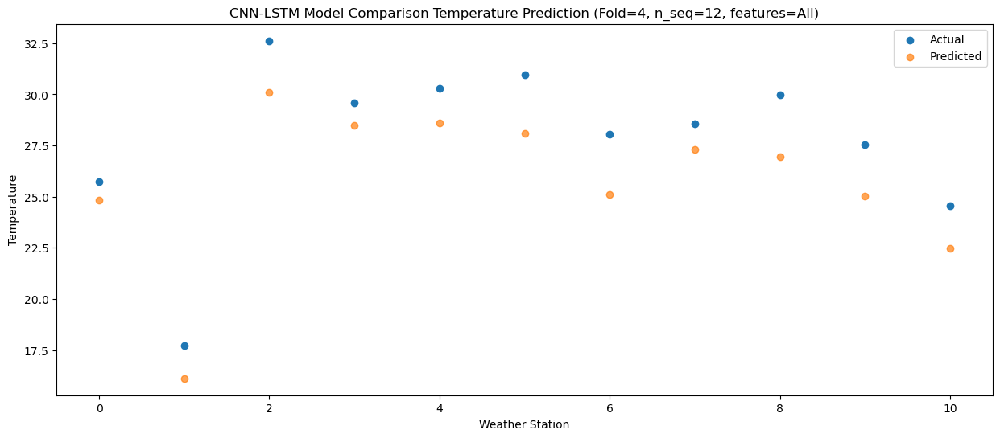

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  25.516872
1                 1   18.10  17.300045
2                 2   33.28  30.902496
3                 3   31.19  29.260941
4                 4   31.79  29.426059
5                 5   30.69  29.325861
6                 6   29.80  26.192247
7                 7   29.84  28.044129
8                 8   30.54  27.470612
9                 9   27.24  25.442253
10               10   24.73  23.060084


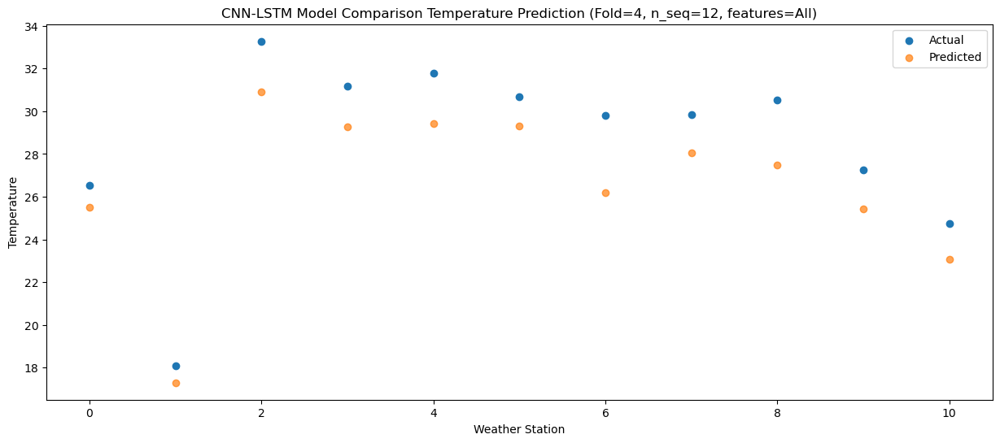

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  25.912261
1                 1   18.38  17.806206
2                 2   33.93  31.770522
3                 3   31.56  29.972137
4                 4   32.16  30.064193
5                 5   31.01  29.602995
6                 6   29.93  26.941213
7                 7   30.36  28.762634
8                 8   31.40  28.299180
9                 9   27.52  26.126137
10               10   25.93  23.947669


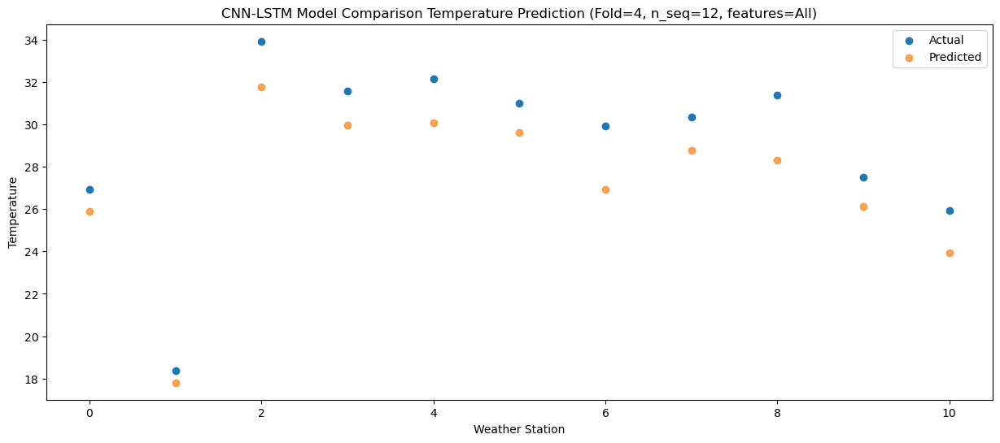

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  22.838351
1                 1   17.09  15.457643
2                 2   30.81  29.191493
3                 3   28.77  27.544897
4                 4   28.73  27.639528
5                 5   30.32  27.239098
6                 6   25.96  23.993578
7                 7   27.32  25.993613
8                 8   27.91  24.671618
9                 9   24.41  22.628701
10               10   21.64  19.990575


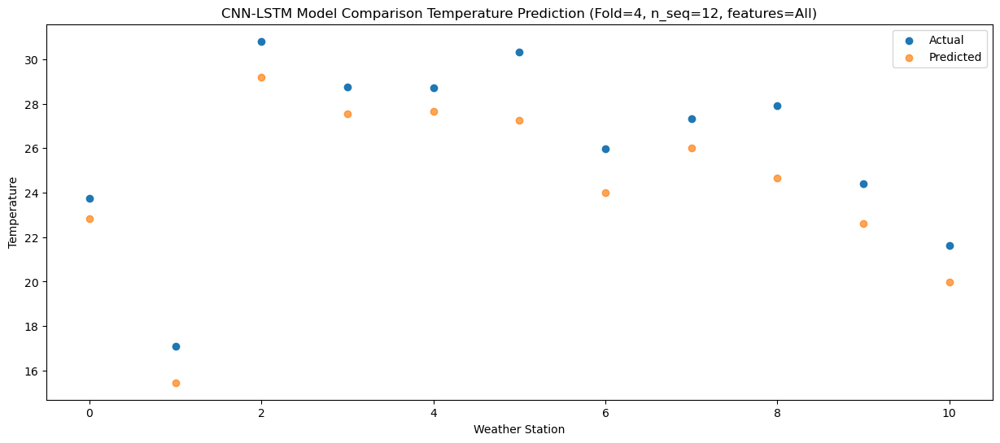

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  17.105765
1                 1   15.25  13.266382
2                 2   27.42  26.312390
3                 3   24.12  23.250106
4                 4   23.86  23.099933
5                 5   24.62  22.444406
6                 6   22.16  21.300695
7                 7   21.55  21.676641
8                 8   22.56  20.753000
9                 9   18.95  17.883471
10               10   18.11  16.463531


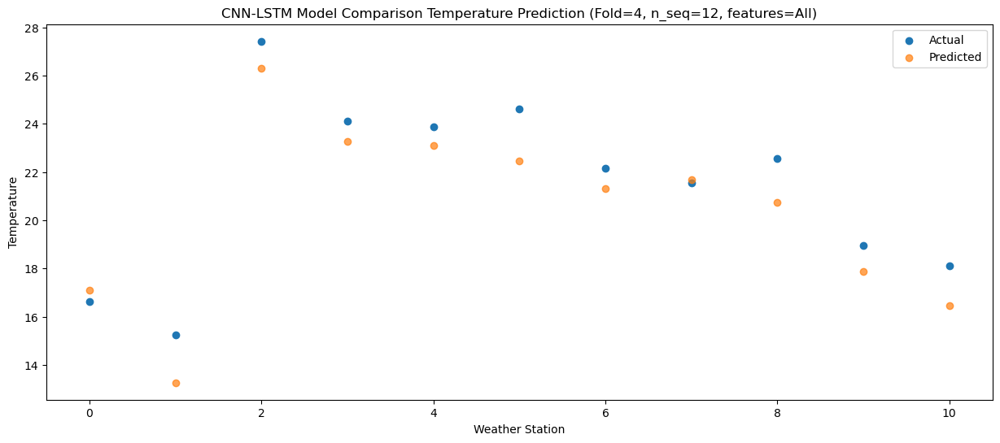

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   7.981464
1                 1    8.09   6.781647
2                 2   18.75  17.694678
3                 3   16.12  14.906969
4                 4   16.02  14.937504
5                 5   17.68  15.641246
6                 6   14.00  12.591188
7                 7   13.61  12.638348
8                 8   11.70  10.232721
9                 9    8.64   7.601666
10               10    7.71   5.856818


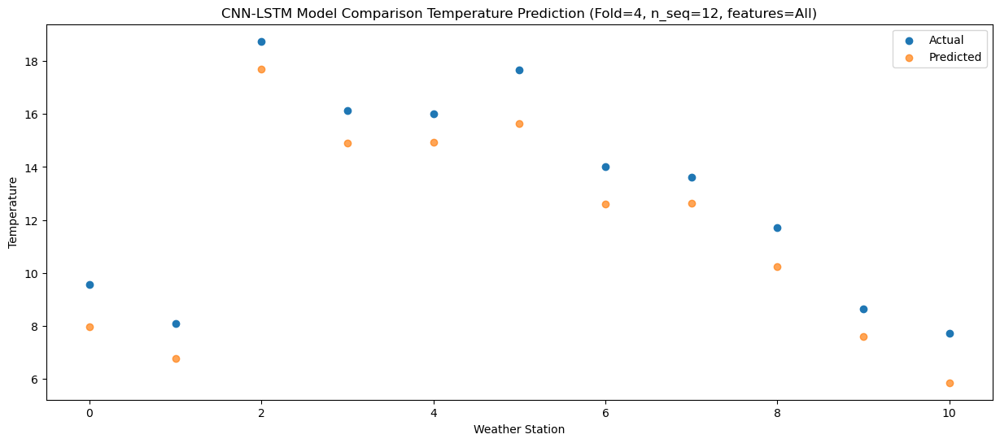

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77   8.212460
1                 1    9.89   9.532265
2                 2   22.26  22.115330
3                 3   18.12  18.105628
4                 4   17.76  17.723948
5                 5   18.09  16.872816
6                 6   15.91  16.042824
7                 7   15.07  15.461479
8                 8   12.02  11.769322
9                 9    8.39   8.441236
10               10    6.85   6.707555


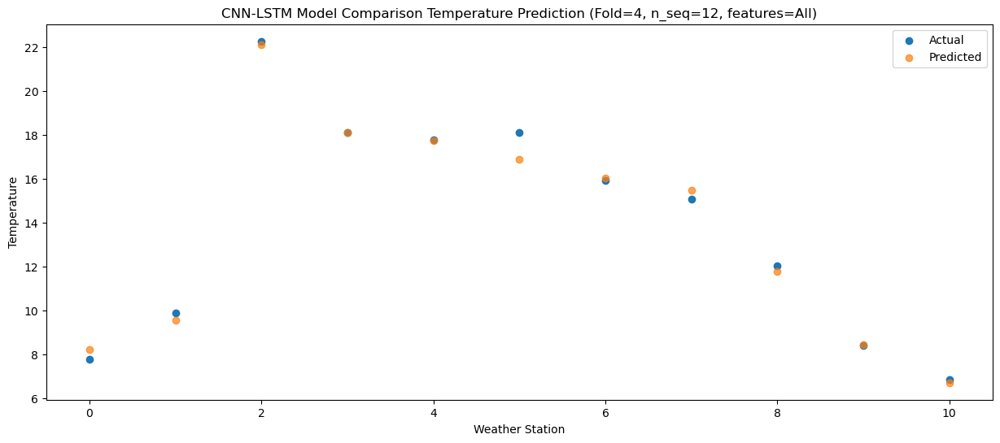

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 2.33910048  5.17537634 14.90988806 10.94287228 10.77041787 11.49364817
   9.8631556   8.39511145  5.80901672  2.52643431  1.4941591 ]
 [-3.36620701  7.75725262 13

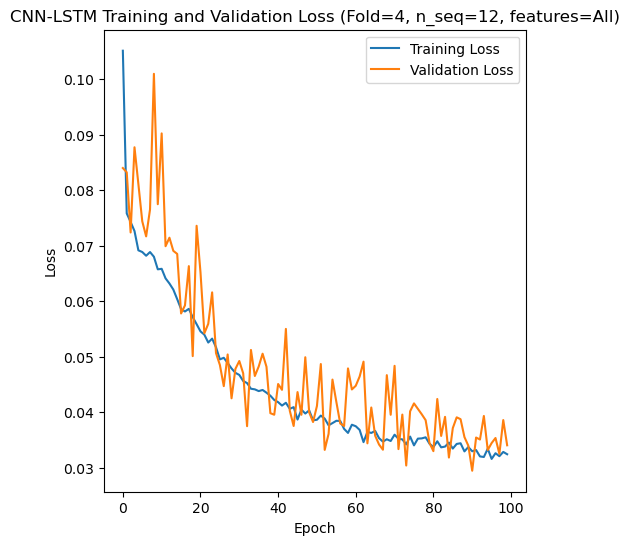

[[2.044523227975383], [1.9511457274172284], [3.256233929824355], [2.170507042622481], [1.4499368411229407]]
[[array(2.04452323)], [array(1.95114573)], [array(3.25623393)], [array(2.17050704)], [array(1.44993684)]]
[[1.6676051447427636], [1.5387807999511793], [2.5954771982968743], [1.50181746387064], [1.179151297834786]]
[[0.10388867796961852], [0.08138736350547307], [0.17123801682722709], [0.25659681055760364], [0.06846371286889887]]
[[0.9324419422808281], [0.9321351137413196], [0.85781349269879], [0.9410020587371954], [0.9730848244830939]]
[[array(0.1032126)], [array(0.08138736)], [array(0.17123802)], [array(-0.03016632)], [array(0.0589427)]]
[[array(0.97372883)], [array(0.97979223)], [array(0.92398613)], [array(0.9540528)], [array(0.99115731)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.34 17.13

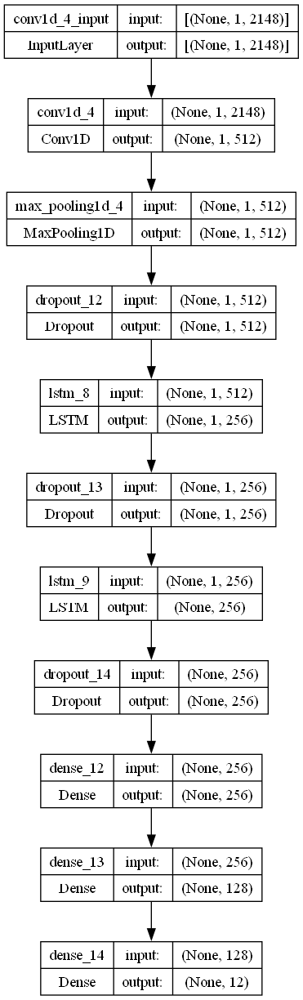

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.08998336848412251
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 256
    dropout_rate = 0.13357123631882456

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)